In [1]:
# Zelle 1 – Imports & Basis
# -*- coding: utf-8 -*-
# ============================================================
# QSD-VDEM-POTENTIALE
# A1^a(t) und A0^a(t) pro Land (USA, Germany, Hungary, Ukraine)
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.ndimage import gaussian_filter1d

plt.rcParams["figure.figsize"] = (10, 6)
plt.rcParams["axes.grid"] = True
plt.rcParams["axes.spines.top"] = False
plt.rcParams["axes.spines.right"] = False

# Google Colab & Drive Integration (optional)
try:
    from google.colab import drive
    COLAB_AVAILABLE = True
    print("✅ Google Colab environment detected")
except ImportError:
    COLAB_AVAILABLE = False
    print("⚠️ Not in Google Colab - using local file system")


✅ Google Colab environment detected


In [2]:
# Zelle 2 – V-Dem Loader (aus deinem ODE-Modell entnommen & verschlankt)
# ============================================================
# V-DEM DATA LOADER (1990–2024)
# ============================================================

class VDemDataLoader:
    """V-Dem data loader mit Google-Drive-Integration (1990-2024)"""

    def __init__(self, gdrive_folder="/content/drive/MyDrive/VDem_Data"):
        self.vdem_data = None
        self.country_data = {}
        self.arrays_dict = {}
        self.gdrive_folder = gdrive_folder
        self.period = "1990-2024"

    def setup_google_drive(self):
        if not COLAB_AVAILABLE:
            print("⚠️ Not in Google Colab - skipping Drive mount")
            return False

        try:
            print("🔗 MOUNTING GOOGLE DRIVE...")
            drive.mount('/content/drive')
            print("✅ Google Drive mounted successfully")

            if os.path.exists(self.gdrive_folder):
                print(f"✅ Found V-Dem folder: {self.gdrive_folder}")
                files = os.listdir(self.gdrive_folder)
                vdem_files = [
                    f for f in files
                    if f.lower().endswith('.csv') and ('v-dem' in f.lower() or 'vdem' in f.lower())
                ]
                if vdem_files:
                    print("📁 Available V-Dem files:")
                    for i, file in enumerate(vdem_files, 1):
                        size_mb = os.path.getsize(os.path.join(self.gdrive_folder, file)) / 1024**2
                        print(f"   {i}. {file} ({size_mb:.1f} MB)")
                else:
                    print("❌ No V-Dem CSV files found in folder")
                    self._print_upload_instructions()
            else:
                print(f"❌ V-Dem folder not found: {self.gdrive_folder}")
                self._create_gdrive_folder()

            return True

        except Exception as e:
            print(f"❌ Error mounting Google Drive: {e}")
            return False

    def _create_gdrive_folder(self):
        try:
            os.makedirs(self.gdrive_folder, exist_ok=True)
            print(f"✅ Created folder: {self.gdrive_folder}")
        except:
            print(f"❌ Could not create folder: {self.gdrive_folder}")
        self._print_upload_instructions()

    def _print_upload_instructions(self):
        print("\n📋 GOOGLE DRIVE SETUP INSTRUCTIONS:")
        print("=" * 50)
        print("1. Download V-Dem data from https://www.v-dem.net/data/")
        print("   e.g. 'V-Dem-Full+Others-v15.csv'")
        print(f"2. Upload the CSV file into: {self.gdrive_folder}")
        print("3. Re-run this cell after upload.\n")

    def load_vdem_csv(self,
                      filename=None,
                      countries=('Germany', 'USA', 'Hungary', 'Ukraine')):
        print("📊 V-DEM DATA LOADING")
        print("=" * 50)
        print(f"⚠️ RESTRICTED TO {self.period}")

        if COLAB_AVAILABLE:
            if not self.setup_google_drive():
                return None

        if filename is None:
            possible_files = [
                "VDem-FullData-v15.csv",
                "V-Dem-Full+Others-v15.csv",
                "V-Dem-Basic-v15.csv",
                "vdem_full_v15.csv"
            ]
            filepath = None
            for fname in possible_files:
                test_path = (os.path.join(self.gdrive_folder, fname)
                             if COLAB_AVAILABLE else fname)
                if os.path.exists(test_path):
                    filepath = test_path
                    filename = fname
                    break
        else:
            filepath = (os.path.join(self.gdrive_folder, filename)
                        if COLAB_AVAILABLE else filename)

        if filepath is None or not os.path.exists(filepath):
            print("❌ V-Dem CSV file not found.")
            if COLAB_AVAILABLE:
                print(f"   Searched in: {self.gdrive_folder}")
                self._print_upload_instructions()
            else:
                print("   Place V-Dem CSV file in current directory.")
            return None

        try:
            size_mb = os.path.getsize(filepath) / 1024**2
            print(f"📁 Loading {filename} ({size_mb:.1f} MB)")
            self.vdem_data = pd.read_csv(filepath, low_memory=False)
            print(f"✅ Loaded {len(self.vdem_data):,} rows, "
                  f"{len(self.vdem_data.columns)} columns")
        except Exception as e:
            print(f"❌ Error loading file: {e}")
            return None

        required_cols = ['country_name', 'year', 'v2x_libdem']
        missing = [c for c in required_cols if c not in self.vdem_data.columns]
        if missing:
            print(f"❌ Missing required columns: {missing}")
            return None

        self._extract_country_data(countries)
        self._convert_to_arrays()
        self._print_sample_data()
        return self.arrays_dict

    def _extract_country_data(self, countries):
        print("\n🏳️ COUNTRY DATA EXTRACTION:")
        for country in countries:
            variations = [country, country.upper(), country.lower()]
            if country == 'USA':
                variations += ['United States', 'United States of America']

            found = False
            for v in variations:
                mask = (self.vdem_data['country_name'] == v)
                if 'country_text_id' in self.vdem_data.columns:
                    mask = mask | (self.vdem_data['country_text_id'] == str(v).upper())

                if mask.any():
                    mask = (mask &
                            (self.vdem_data['year'] >= 1990) &
                            (self.vdem_data['year'] <= 2024))
                    subset = self.vdem_data[mask].sort_values('year')
                    if len(subset) > 0:
                        self.country_data[country] = subset
                        found = True
                        break

            if found:
                years = self.country_data[country]['year']
                print(f"   ✅ {country:8s}: {len(years):3d} obs "
                      f"({years.min()}–{years.max()})")
            else:
                print(f"   ❌ {country:8s}: no data in 1990–2024")

    def _convert_to_arrays(self):
        print("\n🔄 CONVERTING TO ARRAYS:")

        key_indicators = [
            'v2x_libdem',
            'v2x_delibdem',
            'v2x_polyarchy',
            'v2x_freexp',
            'v2x_frassoc',
            'v2xme_altinf',
            'v2cacamps',
            'v2x_corr',
            'v2x_cspart',
            'v2x_egaldem',
            'v2x_rule',
            'v2xcl_rol',
            'v2xpe_exlpol'
        ]

        for country, data in self.country_data.items():
            arrays = {}
            # --- Immer Jahre/Count setzen ---
            arrays["years"] = data["year"].values.astype(float)
            arrays["n_observations"] = len(data)

            added = 0
            for ind in key_indicators:
                if ind in data.columns:
                    vals = data[ind].values.astype(float)
                    mask = ~pd.isna(vals)

                    entry = {
                        "values": vals,
                        "valid_mask": mask,
                        "mean": float(np.nanmean(vals)) if mask.any() else np.nan,
                        "std": float(np.nanstd(vals)) if mask.any() else np.nan,
                    }
                    # Trend nur, wenn min. zwei gültige Werte existieren
                    valid_vals = vals[mask]
                    if valid_vals.size >= 2:
                        entry["trend"] = "up" if valid_vals[-1] > valid_vals[0] else "down"
                    else:
                        entry["trend"] = "n/a"

                    arrays[ind] = entry
                    added += 1
                # wenn Spalte in CSV fehlt: kein Eintrag (Add-on nutzt Fallbacks)

            self.arrays_dict[country] = arrays
            print(f"   ✅ {country}: {added} indicators converted (Keys gesetzt, auch bei NaN-Serien)")

    def _print_sample_data(self):
        print("\n📋 SAMPLE DATA (max 10 rows per country):")
        print("=" * 80)
        key_indicators = [
            'v2x_libdem', 'v2x_delibdem', 'v2x_polyarchy',
            'v2x_cspart', 'v2x_egaldem', 'v2x_rule',
            'v2xcl_rol', 'v2xpe_exlpol'
        ]

        for country, data in self.country_data.items():
            print(f"\n🏳️ {country.upper()}:")
            present = [ind for ind in key_indicators if ind in data.columns]
            if not present:
                print("  (keine der Beispielspalten im Datensatz vorhanden)")
                continue

            header = "Year   " + " ".join([f"{ind:12s}" for ind in present])
            print(header)
            print("-" * len(header))

            sample = data[['year'] + present].head(10)
            for _, row in sample.iterrows():
                line = f"{int(row['year']):4d}   "
                for ind in present:
                    val = row[ind]
                    if pd.isna(val):
                        line += f"{'N/A':>12s} "
                    else:
                        line += f"{float(val):12.3f} "
                print(line)


def load_vdem_data_for_countries(
        countries=('Germany', 'USA', 'Hungary', 'Ukraine'),
        gdrive_folder="/content/drive/MyDrive/VDem_Data",
        filename=None):
    loader = VDemDataLoader(gdrive_folder=gdrive_folder)
    arrays_dict = loader.load_vdem_csv(filename=filename, countries=countries)
    return arrays_dict


In [3]:
# Zelle 3 – V-Dem Daten für die 4 Länder laden
# ============================================================
# V-DEM DATEN LADEN
# ============================================================

countries = ('Germany', 'USA', 'Hungary', 'Ukraine')
gdrive_folder = "/content/drive/MyDrive/VDem_Data" if COLAB_AVAILABLE else "."

vdem_arrays = load_vdem_data_for_countries(
    countries=countries,
    gdrive_folder=gdrive_folder,
    filename=None  # Auto-Erkennung
)

print("\nVerfügbare Länder:", list(vdem_arrays.keys()))


📊 V-DEM DATA LOADING
⚠️ RESTRICTED TO 1990-2024
🔗 MOUNTING GOOGLE DRIVE...
Mounted at /content/drive
✅ Google Drive mounted successfully
✅ Found V-Dem folder: /content/drive/MyDrive/VDem_Data
📁 Available V-Dem files:
   1. VDem-FullData-v15.csv (383.8 MB)
📁 Loading VDem-FullData-v15.csv (383.8 MB)
✅ Loaded 27,913 rows, 4607 columns

🏳️ COUNTRY DATA EXTRACTION:
   ✅ Germany :  35 obs (1990–2024)
   ✅ USA     :  35 obs (1990–2024)
   ✅ Hungary :  35 obs (1990–2024)
   ✅ Ukraine :  35 obs (1990–2024)

🔄 CONVERTING TO ARRAYS:
   ✅ Germany: 12 indicators converted (Keys gesetzt, auch bei NaN-Serien)
   ✅ USA: 12 indicators converted (Keys gesetzt, auch bei NaN-Serien)
   ✅ Hungary: 12 indicators converted (Keys gesetzt, auch bei NaN-Serien)
   ✅ Ukraine: 12 indicators converted (Keys gesetzt, auch bei NaN-Serien)

📋 SAMPLE DATA (max 10 rows per country):

🏳️ GERMANY:
Year   v2x_libdem   v2x_delibdem v2x_polyarchy v2x_cspart   v2x_egaldem  v2x_rule     v2xcl_rol    v2xpe_exlpol
-------------

ℹ️ Germany: fehlende Reihen (nicht im Datensatz): ['v2x_frassoc']


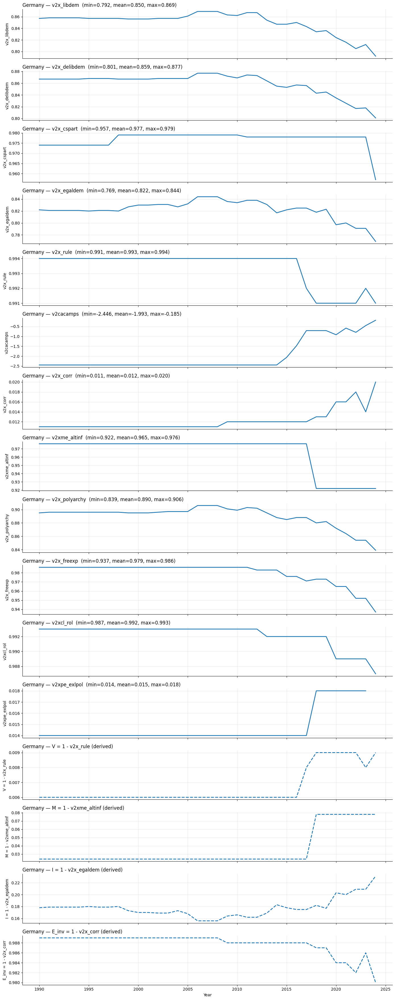

ℹ️ USA: fehlende Reihen (nicht im Datensatz): ['v2x_frassoc']


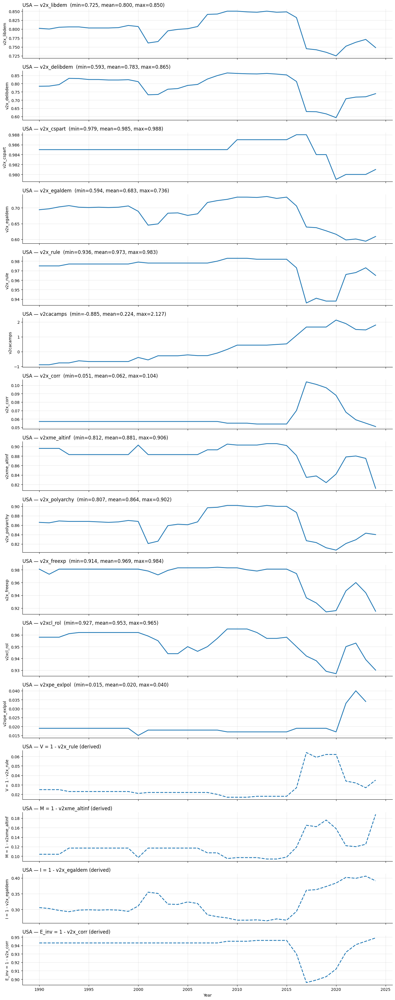

ℹ️ Hungary: fehlende Reihen (nicht im Datensatz): ['v2x_frassoc']


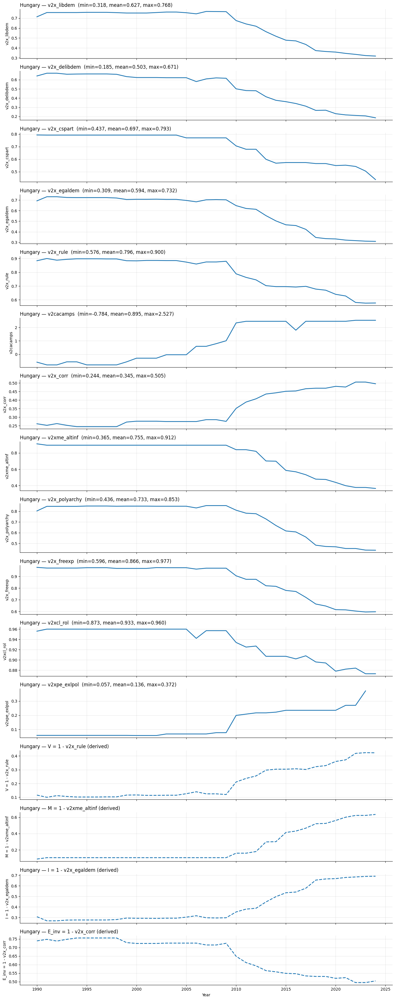

ℹ️ Ukraine: fehlende Reihen (nicht im Datensatz): ['v2x_frassoc']


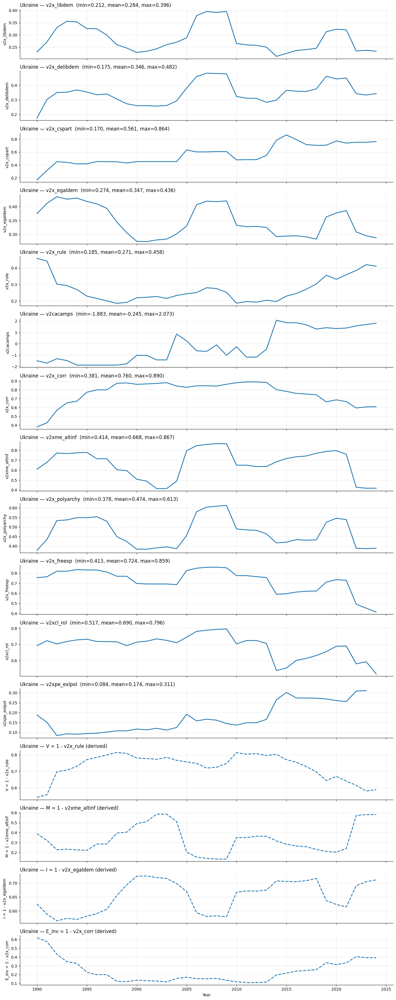

In [4]:
# ============================================================
# ADD-ON: Plot aller V-Dem Reihen für alle 4 Länder (1990–2024)
# kompatibel mit vdem_arrays aus deinem Loader
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

def plot_all_vdem_series(vdem_arrays,
                         countries=("Germany", "USA", "Hungary", "Ukraine"),
                         indicators=None,
                         show_derived=True):
    """
    Plottet pro Land alle gewünschten Indikatoren (roh, ohne Clipping).
    Optional zusätzlich abgeleitete Größen (V=1-rule, M=1-altinf, I=1-egaldem, E_inv=1-corr).
    """

    if indicators is None:
        indicators = [
            "v2x_libdem",
            "v2x_delibdem",
            "v2x_cspart",
            "v2x_egaldem",
            "v2x_rule",
            "v2cacamps",
            "v2x_corr",
            "v2xme_altinf",
            "v2x_polyarchy",
            "v2x_freexp",
            "v2x_frassoc",
            "v2xcl_rol",
            "v2xpe_exlpol",
        ]

    for country in countries:
        if country not in vdem_arrays:
            print(f"⚠️ {country} nicht in vdem_arrays.")
            continue

        c = vdem_arrays[country]
        years = np.asarray(c["years"], dtype=float)

        present = [k for k in indicators if k in c]
        missing = [k for k in indicators if k not in c]

        n_rows = len(present) + (4 if show_derived else 0)
        if n_rows == 0:
            print(f"⚠️ {country}: keine der angefragten Reihen vorhanden.")
            continue

        fig, axes = plt.subplots(n_rows, 1, figsize=(14, 2.2*n_rows), sharex=True)
        if n_rows == 1:
            axes = [axes]

        r = 0
        for key in present:
            vals = np.asarray(c[key]["values"], dtype=float)
            ax = axes[r]
            ax.plot(years, vals, linewidth=2)
            ax.set_ylabel(key)

            # kleine Stats im Plot
            vmin = np.nanmin(vals)
            vmean = np.nanmean(vals)
            vmax = np.nanmax(vals)
            ax.set_title(f"{country} — {key}  (min={vmin:.3f}, mean={vmean:.3f}, max={vmax:.3f})", loc="left")

            r += 1

        if show_derived:
            # abgeleitete Reihen (nur wenn Basis vorhanden)
            def _plot_derived(name, arr):
                nonlocal r
                ax = axes[r]
                ax.plot(years, arr, linewidth=2, linestyle="--")
                ax.set_ylabel(name)
                ax.set_title(f"{country} — {name} (derived)", loc="left")
                r += 1

            if "v2x_rule" in c:
                rule = np.asarray(c["v2x_rule"]["values"], dtype=float)
                _plot_derived("V = 1 - v2x_rule", 1.0 - rule)

            if "v2xme_altinf" in c:
                alt = np.asarray(c["v2xme_altinf"]["values"], dtype=float)
                _plot_derived("M = 1 - v2xme_altinf", 1.0 - alt)

            if "v2x_egaldem" in c:
                egal = np.asarray(c["v2x_egaldem"]["values"], dtype=float)
                _plot_derived("I = 1 - v2x_egaldem", 1.0 - egal)

            if "v2x_corr" in c:
                corr = np.asarray(c["v2x_corr"]["values"], dtype=float)
                _plot_derived("E_inv = 1 - v2x_corr", 1.0 - corr)

        # Achsen/Optik
        axes[-1].set_xlabel("Year")
        for ax in axes:
            ax.grid(True, alpha=0.3)

        if missing:
            print(f"ℹ️ {country}: fehlende Reihen (nicht im Datensatz): {missing}")

        plt.tight_layout()
        plt.show()


# --- Aufrufbeispiel ---
plot_all_vdem_series(vdem_arrays,
                     countries=("Germany", "USA", "Hungary", "Ukraine"),
                     show_derived=True)


In [5]:
def quick_check(vdem_arrays, country="Germany"):
    keys = ["v2cacamps","v2x_rule","v2x_corr","v2xme_altinf","v2x_libdem"]
    c = vdem_arrays[country]
    print("Years:", int(c["years"][0]), "…", int(c["years"][-1]), "n=", len(c["years"]))
    for k in keys:
        if k not in c:
            print(k, "MISSING in arrays_dict")
            continue
        vals = np.asarray(c[k]["values"], float)
        print(k,
              "nan%", np.mean(np.isnan(vals))*100,
              "min", np.nanmin(vals),
              "mean", np.nanmean(vals),
              "max", np.nanmax(vals))

quick_check(vdem_arrays, "Germany")


Years: 1990 … 2024 n= 35
v2cacamps nan% 0.0 min -2.446 mean -1.9927428571428574 max -0.185
v2x_rule nan% 0.0 min 0.991 mean 0.9933714285714286 max 0.994
v2x_corr nan% 0.0 min 0.011 mean 0.0122 max 0.02
v2xme_altinf nan% 0.0 min 0.922 mean 0.9652 max 0.976
v2x_libdem nan% 0.0 min 0.792 mean 0.8498000000000001 max 0.869


AB HIER QSD VI

In [7]:
# ============================================================
# QSD – V-Dem → A1/A0 pro Land  +  A_STORE  +  make_H_of_t(...)
#     + results/results_qsd_countries  +  alle Original-Plots
# (Loader bleibt unverändert. Erwartet arrays_dict/vdem_arrays.)
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
from scipy.interpolate import interp1d
from scipy.integrate import solve_ivp

# ---------- Vorhandene Loader-Ausgabe anbinden (NICHT ändern) ----------
try:
    arrays_dict  # vom Loader erzeugt
except NameError:
    try:
        arrays_dict = vdem_arrays
    except NameError:
        raise RuntimeError("Bitte zuerst die Loader-Zellen ausführen → arrays_dict oder vdem_arrays bereitstellen.")

try:
    countries
except NameError:
    countries = ["Germany", "USA", "Hungary", "Ukraine"]

# ============================================================
# >>>>>>>>>>>>>>>>   T U N I N G   P A R A M S   <<<<<<<<<<<<<<
# (nur Datenaufbereitung/Skalierung – keine Algorithmusänderung)
# ============================================================
ALPHA_A1         = 1.0   # Gewicht vor A1 im Hamiltonian
BETA_A0          = 0.6   # Gewicht vor A0 im Hamiltonian

A1_CENTER        = 0.55  # Einbettung der z-Scores in [center±halfwidth]
A1_HALFWIDTH     = 0.18
A1_SMOOTH_SIGMA  = 0.8   # Glättung (Jahre) – reduziert "Treppen" in A1

A0_GAIN          = 0.30  # Skala für A0 nach Normierung (Δ-Serien)
A0_SMOOTH_SIGMA  = 1.2   # Glättung (Jahre) – A0-Zeitmodulation

AGENT_WEIGHTS    = np.array([0.5, 0.3, 0.2], float)  # Blau/Orange/Grün
YEAR_TICK_EVERY  = 2     # x-Achsenbeschriftung alle N Jahre

ODE_METHOD = "DOP853"    # wie im Referenzcode
RTOL       = 1e-8
ATOL       = 1e-10

# ============================================================
# SU(3) – Gell-Mann
# ============================================================
def gell_mann():
    l1 = np.array([[0,1,0],[1,0,0],[0,0,0]], dtype=complex)
    l2 = np.array([[0,-1j,0],[1j,0,0],[0,0,0]], dtype=complex)
    l3 = np.array([[1,0,0],[0,-1,0],[0,0,0]], dtype=complex)
    l4 = np.array([[0,0,1],[0,0,0],[1,0,0]], dtype=complex)
    l5 = np.array([[0,0,-1j],[0,0,0],[1j,0,0]], dtype=complex)
    l6 = np.array([[0,0,0],[0,0,1],[0,1,0]], dtype=complex)
    l7 = np.array([[0,0,0],[0,0,-1j],[0,1j,0]], dtype=complex)
    l8 = (1/np.sqrt(3))*np.array([[1,0,0],[0,1,0],[0,0,-2]], dtype=complex)
    return [l1,l2,l3,l4,l5,l6,l7,l8]

LAM = gell_mann()

# ============================================================
# Zuordnungen (mit robusten Fallbacks)
# ============================================================
A1_MAPPING = {
    1: dict(ind="v2x_rule",     invert=False),
    2: dict(ind="v2x_freexp",   invert=False),
    3: dict(ind="v2x_egaldem",  invert=False),
    4: dict(ind="v2x_cspart",   invert=False),
    5: dict(ind="v2x_frassoc",  invert=False, fallback=["v2x_cspart"]),
    6: dict(ind="v2x_corr",     invert=True),
    7: dict(ind="v2xme_altinf", invert=False),
    8: dict(ind="v2xcl_rol",    invert=True),
}

A0_MAPPING = {
    1: dict(ind="v2cacamps",    invert=True,  mode="diff"),
    2: dict(ind="v2x_freexp",   invert=False, mode="diff"),
    3: dict(ind="v2x_corr",     invert=True,  mode="diff"),
    4: dict(ind="v2x_cspart",   invert=False, mode="diff"),
    5: dict(ind="v2pe_exlpol",  invert=True,  mode="diff",
            fallback=["v2x_egaldem"], invert_fallback=True),
    6: dict(ind="v2x_rule",     invert=False, mode="diff"),
    7: dict(ind="v2xme_altinf", invert=False, mode="diff"),
    8: dict(ind="v2pe_exlpol",  invert=False, mode="diff",
            fallback=["v2x_egaldem"], invert_fallback=True),
}

# ============================================================
# Hilfsfunktionen (Skalierung, Glättung, Fallback)
# ============================================================
def _years(country):
    return arrays_dict[country]["years"].astype(float)

def _get_series(country, key):
    return np.asarray(arrays_dict[country][key]["values"], float)

def _with_fallback(country, primary, fallbacks=None, invert=False, invert_fallback=False, label_prefix=""):
    data = arrays_dict[country]
    if primary in data:
        x = _get_series(country, primary)
        used = primary
    else:
        fb_used = None
        if fallbacks:
            for fb in (fallbacks if isinstance(fallbacks,(list,tuple)) else [fallbacks]):
                if fb in data:
                    fb_used = fb
                    break
        if fb_used is None:
            x = np.full(len(_years(country)), 0.5, float)
            used = f"{primary}*const"
            print(f"⚠️ {country}: {primary} + Fallbacks {fallbacks} fehlen – setze konstante 0.5-Serie.")
        else:
            x = _get_series(country, fb_used)
            used = fb_used
            print(f"⚠️ {country}: benutze {fb_used} (proxy for {primary})")
            if invert_fallback:
                x = 1.0 - x

    if invert and used == primary:
        x = 1.0 - x
    return x, f"{label_prefix}{used}"

def zscore_band(x, center=0.5, halfwidth=0.18):
    x = np.asarray(x, float)
    m, s = np.nanmean(x), np.nanstd(x)
    if s < 1e-12:
        y = np.full_like(x, center)
    else:
        z = (x - m)/s
        y = center + halfwidth*np.tanh(0.9*z)
    return np.clip(y, center-halfwidth, center+halfwidth)

def normalize_unit(x):
    x = np.asarray(x, float)
    s = np.nanstd(x)
    if s < 1e-12:
        return np.zeros_like(x)
    return x / s

# ============================================================
# A1/A0 für ein Land bauen
# ============================================================
def build_A1_A0(country):
    years = _years(country)
    T = len(years)
    A1 = np.zeros((8,T), float)
    A0 = np.zeros((8,T), float)

    # A1: Level → z-Score-Band → Glättung
    for a in range(1,9):
        m = A1_MAPPING[a]
        x, _ = _with_fallback(
            country,
            m["ind"],
            m.get("fallback"),
            invert=m.get("invert", False)
        )
        y = zscore_band(x, center=A1_CENTER, halfwidth=A1_HALFWIDTH)
        A1[a-1,:] = gaussian_filter1d(y, sigma=A1_SMOOTH_SIGMA, mode="nearest")

    # A0: Δ/Level → invert → Norm → Gain → Glättung
    for a in range(1,9):
        m = A0_MAPPING[a]
        x, _ = _with_fallback(
            country,
            m["ind"],
            m.get("fallback"),
            invert=False,
            invert_fallback=m.get("invert_fallback", False)
        )
        if m.get("mode","diff") == "diff":
            dx = np.diff(x, prepend=x[0])
            if m.get("invert", False):
                dx = -dx
        else:
            dx = 1.0 - x if m.get("invert", False) else x

        dx = A0_GAIN * normalize_unit(dx)
        A0[a-1,:] = gaussian_filter1d(dx, sigma=A0_SMOOTH_SIGMA, mode="nearest")

    return dict(years=years, A1=A1, A0=A0)

# ============================================================
# Für alle Länder erzeugen → A_STORE
# ============================================================
A_STORE = {}
for c in countries:
    if c not in arrays_dict:
        print(f"⚠️ {c}: keine V-Dem-Daten – übersprungen.")
        continue
    A_STORE[c] = build_A1_A0(c)
print("✅ A_STORE erstellt:", list(A_STORE.keys()))

# ============================================================
# Hamilton-Factory: make_H_of_t(years, A1, A0, alpha, beta)
# -> H(t) = alpha * Σ A1^a(t) λ_a  +  beta * Σ A0^a(t) λ_a
# ============================================================
def make_H_of_t(years, A1, A0, alpha=ALPHA_A1, beta=BETA_A0):
    years = np.asarray(years, float)
    A1_interp = [interp1d(years, A1[a], kind='linear', bounds_error=False,
                          fill_value=(A1[a,0], A1[a,-1])) for a in range(8)]
    A0_interp = [interp1d(years, A0[a], kind='linear', bounds_error=False,
                          fill_value=(A0[a,0], A0[a,-1])) for a in range(8)]
    def H_of_t(t):
        M = np.zeros((3,3), complex)
        for a in range(8):
            M += alpha * float(A1_interp[a](t)) * LAM[a]
            M += beta  * float(A0_interp[a](t)) * LAM[a]
        return M
    return H_of_t

# ============================================================
# Schrödinger-Dynamik (wie Referenz) + Mean-Field (μ/R)
# ============================================================
def _schrod_rhs(t, y, Hf):
    psi = y[:3] + 1j*y[3:]
    dpsi = -1j * (Hf(t) @ psi)
    return np.concatenate([dpsi.real, dpsi.imag])

def _evolve_path(psi0, Hf, t0, t1, n_eval=800):
    t_eval = np.linspace(t0, t1, n_eval)
    y0 = np.concatenate([psi0.real, psi0.imag])
    sol = solve_ivp(lambda tt,yy: _schrod_rhs(tt,yy,Hf),
                    (t0, t1), y0, t_eval=t_eval,
                    method=ODE_METHOD, rtol=RTOL, atol=ATOL)
    psi = sol.y[:3,:].T + 1j*sol.y[3:,:].T
    psi = psi / (np.linalg.norm(psi, axis=1, keepdims=True) + 1e-14)
    return t_eval, psi

def mean_field_C_l1_weighted(t_eval, pathA, pathB, pathC, wA, wB, wC):
    T = len(t_eval)
    C_mf = np.empty(T); R_ser = np.empty(T)
    for k in range(T):
        a, b, c = pathA[k], pathB[k], pathC[k]
        mu = wA*a + wB*b + wC*c
        R  = np.linalg.norm(mu)
        mu_hat = mu / (R + 1e-15)
        C_mf[k] = R**2 * ((np.sum(np.abs(mu_hat)))**2 - 1.0)
        R_ser[k] = R
    C_bound = 2.0 * (R_ser**2)
    return C_mf, C_bound, R_ser

# ============================================================
# Plot-Helfer (Jahresticks, V-Dem Rohdaten, A1/A0, H-Spektrum, Agenten, MF)
# ============================================================
def _apply_year_ticks(ax, years, every=YEAR_TICK_EVERY):
    years_i = years.astype(int)
    ticks = years_i[::every]
    ax.set_xticks(ticks)
    ax.set_xticklabels([str(y) for y in ticks])
    ax.tick_params(axis='x', labelrotation=0)

def plot_vdem_raw_sources(country):
    """NEU: Visualisiert V-Dem-Rohdaten, die in A1/A0 einfließen.
       Panel 1: A1-Quellen (Level, ggf. invertiert)
       Panel 2: A0-Quellen (Level-Rohwerte vor Δ), plus optional Δ (dünn)"""
    years = _years(country)

    # A1-Panel
    fig, axes = plt.subplots(2, 1, figsize=(12, 7), sharex=True)
    ax1, ax2 = axes

    for a in range(1,9):
        m = A1_MAPPING[a]
        x_raw, used_lbl = _with_fallback(country, m["ind"], m.get("fallback"),
                                         invert=m.get("invert", False))
        ax1.plot(years, x_raw, label=f"λ{a}: {used_lbl}")
    ax1.set_title(f"{country}: V-Dem Rohdaten – A1-Quellen (Level, inkl. invert ggf.)")
    ax1.set_ylabel("V-Dem-Wert")
    ax1.grid(True, alpha=.3)
    ax1.legend(ncol=2, fontsize=8)

    # A0-Panel (Roh-Level + Δ als dünne Linie)
    for a in range(1,9):
        m = A0_MAPPING[a]
        x_raw, used_lbl = _with_fallback(country, m["ind"], m.get("fallback"),
                                         invert=False, invert_fallback=m.get("invert_fallback", False))
        ax2.plot(years, x_raw, label=f"λ{a}: {used_lbl}")
        # Optional: Δ (nach invert-Regel), als dünne Linie
        if m.get("mode","diff") == "diff":
            dx = np.diff(x_raw, prepend=x_raw[0])
            if m.get("invert", False):
                dx = -dx
            ax2.plot(years, (dx - dx.min())/(dx.max()-dx.min()+1e-12),
                     linewidth=0.8, alpha=0.6)
    ax2.set_title(f"{country}: V-Dem Rohdaten – A0-Quellen (Roh-Level; dünn: normierte Δ)")
    ax2.set_ylabel("V-Dem-Wert / norm. Δ")
    ax2.grid(True, alpha=.3)
    ax2.legend(ncol=2, fontsize=8)

    _apply_year_ticks(ax2, years)
    ax2.set_xlabel("Jahr")
    plt.tight_layout(); plt.show()

def plot_A_curves(country, years, A1, A0):
    fig, axes = plt.subplots(2,1, figsize=(11,8), sharex=True)
    for a in range(8):
        axes[0].plot(years, A1[a], label=f"λ{a+1}: A1")
    axes[0].set_title(f"{country}: A1 (geglättet)")
    axes[0].set_ylabel("A1^a(t)"); axes[0].grid(True, alpha=.3)
    axes[0].legend(ncol=4, fontsize=8)
    for a in range(8):
        axes[1].plot(years, A0[a], label=f"λ{a+1}: A0")
    axes[1].set_title(f"{country}: A0 (Zeitmodulation)")
    axes[1].set_ylabel("A0^a(t)"); axes[1].grid(True, alpha=.3)
    axes[1].legend(ncol=4, fontsize=8)
    _apply_year_ticks(axes[1], years)
    axes[1].set_xlabel("Jahr")
    plt.tight_layout(); plt.show()

def plot_hamilton_spectrum(country, years, A1, A0):
    T = len(years); evals = np.zeros((T,3), float)
    for t in range(T):
        M = np.zeros((3,3), complex)
        for a in range(8):
            M += ALPHA_A1*A1[a,t]*LAM[a] + BETA_A0*A0[a,t]*LAM[a]
        evals[t] = np.real(np.sort(np.linalg.eigvals(M)))
    fig, ax = plt.subplots(1,1, figsize=(11,4))
    for i in range(3):
        ax.plot(years, evals[:,i], label=f"Eigenwert {i+1}")
    ax.set_title(f"{country}: Re(H)-Eigenwerte")
    ax.set_ylabel("Re(E)"); ax.grid(True, alpha=.3); ax.legend()
    _apply_year_ticks(ax, years); ax.set_xlabel("Jahr")
    plt.tight_layout(); plt.show()

def plot_agent_paths_3d(country, t_eval, pathA, pathB, pathC):
    from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
    fig = plt.figure(figsize=(8,7)); ax = fig.add_subplot(111, projection='3d')
    for traj, name in zip([pathA, pathB, pathC], ["Blau","Orange","Grün"]):
        tr = np.real(traj)
        ax.plot(tr[:,0], tr[:,1], tr[:,2], label=f"Agent {name}")
    ax.set_xlabel("Re(ψ1) – Blau"); ax.set_ylabel("Re(ψ2) – Orange"); ax.set_zlabel("Re(ψ3) – Grün")
    ax.set_title(f"Agentenpfade – {country}")
    ax.legend(); plt.tight_layout(); plt.show()

def plot_meanfield(country, t_eval, C_mf, C_bound, R_ser):
    plt.figure(figsize=(11,4.2))
    plt.plot(t_eval, C_mf, label=r"$C_{\ell_1}$ (kombiniert)")
    plt.plot(t_eval, C_bound, linestyle="--", label=r"Schranke $2R(t)^2$")
    plt.plot(t_eval, R_ser, linestyle=":", label=r"Ausrichtung $R(t)$")
    plt.title(f"Mean-Field (μ/R) – {country}")
    plt.xlabel("Jahr"); plt.ylabel("Index")
    plt.grid(True, alpha=0.3); plt.legend()
    plt.tight_layout(); plt.show()

# ============================================================
# Standardisierte Ergebnisse + Plots pro Land
# ============================================================
# Reine Basiszustände
e1 = np.array([1,0,0], complex)  # Blau
e2 = np.array([0,1,0], complex)  # Orange
e3 = np.array([0,0,1], complex)  # Grün

results = {}
results_qsd_countries = {}

for country in countries:
    if country not in A_STORE:
        print(f"⚠️ {country}: keine A1/A0-Daten – übersprungen.")
        continue

    years = np.asarray(A_STORE[country]["years"], float)
    A1    = np.asarray(A_STORE[country]["A1"], float)
    A0    = np.asarray(A_STORE[country]["A0"], float)

    # --- NEU: Plot der V-Dem Rohdaten/Quellen ---
    plot_vdem_raw_sources(country)

    # --- Plots: A1/A0 + H-Spektrum
    plot_A_curves(country, years, A1, A0)
    plot_hamilton_spectrum(country, years, A1, A0)

    # Hamiltonian
    Hf = make_H_of_t(years, A1, A0, alpha=ALPHA_A1, beta=BETA_A0)

    # Zeitgitter für die ODE
    t0, t1 = float(years[0]), float(years[-1])
    n_eval = max(800, int((t1 - t0 + 1) * 20))

    # Evolution der drei Basiszustände
    t_eval, pathA = _evolve_path(e1, Hf, t0, t1, n_eval=n_eval)
    _,      pathB = _evolve_path(e2, Hf, t0, t1, n_eval=n_eval)
    _,      pathC = _evolve_path(e3, Hf, t0, t1, n_eval=n_eval)

    # 3D-Pfade
    plot_agent_paths_3d(country, t_eval, pathA, pathB, pathC)

    # Mean-Field (μ/R) exakt wie Vorlage
    wA, wB, wC = (AGENT_WEIGHTS / np.sum(AGENT_WEIGHTS)).tolist()
    C_mf, C_bound, R_ser = mean_field_C_l1_weighted(t_eval, pathA, pathB, pathC, wA, wB, wC)
    plot_meanfield(country, t_eval, C_mf, C_bound, R_ser)

    # Speichern in standardisierte Strukturen
    psi_t = np.stack([pathA, pathB, pathC], axis=0)  # (3, T, 3)
    results[country] = {"years": t_eval, "A1": A1, "A0": A0, "psi_t": psi_t}
    results_qsd_countries[country] = results[country]

print("✅ results & results_qsd_countries erzeugt.")
print("   Länder:", list(results.keys()))
print("   Jeder Eintrag enthält: years, A1 (8xT), A0 (8xT), psi_t (3xTx3)")


Output hidden; open in https://colab.research.google.com to view.

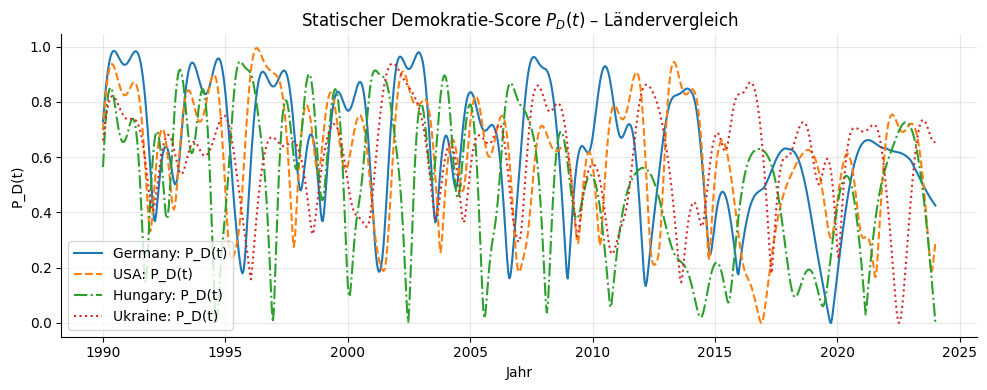

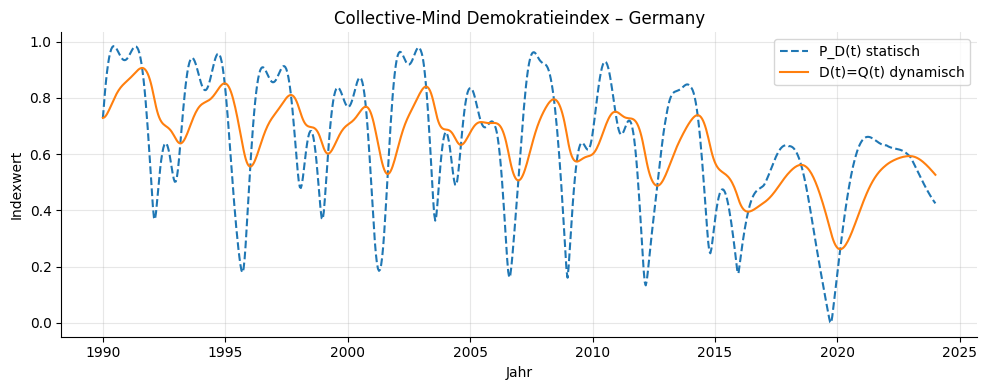

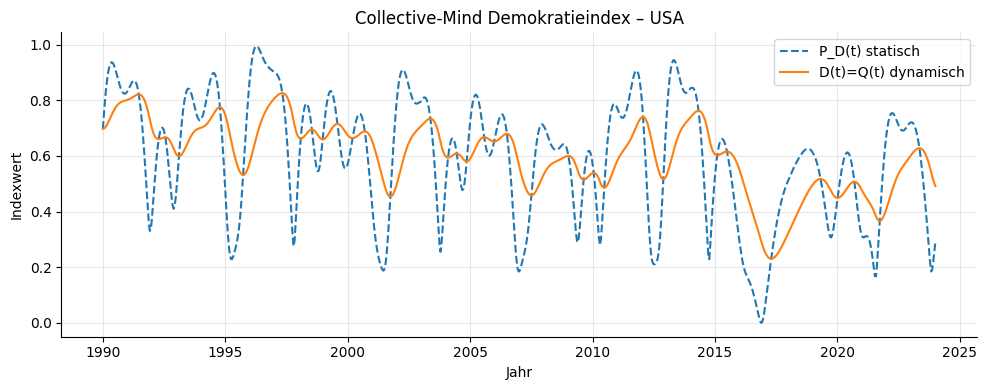

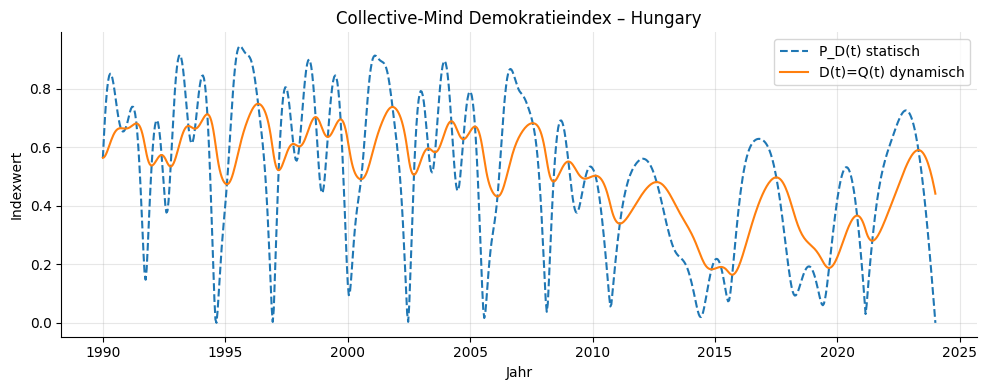

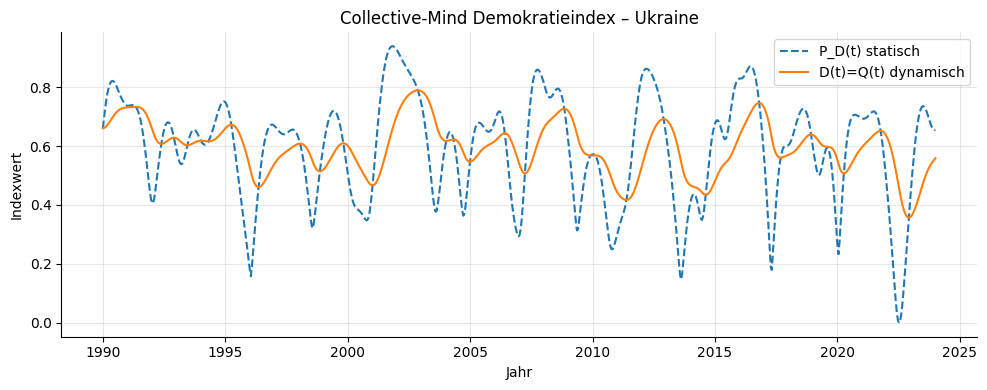

✅ Demokratieindizes berechnet und geplottet.


In [8]:
# ============================================================
# QSD – Demokratieindizes (statisch/dynamisch) für 4 Länder
# Konsistente Zeitachsen: alles auf dem dichten t_eval der Pfade
# Formeln unverändert:
#   KH(t) = C_{l1}(t) * R(t)
#   V(t)  = normierte Entropie aus p_mean
#   S(t)  = F_eff(t) / max(F_eff) (global)
#   P_D(t)= KH_norm(t) * V(t) / (1+S(t))
#   dQ/dt = kappa*(P_D - Q),  D(t)=Q(t),  Q(t0)=P_D(t0)
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.integrate import solve_ivp

# ---- Verfügbarkeitschecks (wir greifen nur auf vorhandene Strukturen zu) ----
if "results_qsd_countries" not in globals():
    if "results" in globals():
        results_qsd_countries = results
    else:
        raise RuntimeError("results_qsd_countries / results nicht gefunden. Bitte vorher das A1/A0+Schrödinger-Add-on ausführen.")

if "A_STORE" not in globals() or not A_STORE:
    raise RuntimeError("A_STORE fehlt/leer. Bitte vorher das A1/A0-Add-on ausführen (A1/A0 pro Land).")

if "LAM" not in globals():
    raise RuntimeError("SU(3)-Generatoren LAM fehlen (kommen aus dem vorgeschalteten Add-on).")

ALPHA_A1 = globals().get("ALPHA_A1", 1.0)
BETA_A0  = globals().get("BETA_A0", 0.6)
AGENT_WEIGHTS = globals().get("AGENT_WEIGHTS", np.array([0.5,0.3,0.2], float))

try:
    countries
except NameError:
    countries = list(results_qsd_countries.keys())

# -----------------------------
# Hilfsfunktionen (unverändert)
# -----------------------------
def apply_year_ticks(ax, years, every=2):
    yi = years.astype(int)
    ticks = yi[::every]
    ax.set_xticks(ticks)
    ax.set_xticklabels([str(y) for y in ticks])
    ax.tick_params(axis='x', labelrotation=0)

def compute_R_Cl1_Coh_V_from_paths(psi_t, weights=None):
    """
    psi_t: (3, T, 3) – drei Agenten (Blau/Orange/Grün), T Zeitpunkte, 3 Komponenten
    weights: (wA,wB,wC); default = AGENT_WEIGHTS
    Rückgabe: dict(R, Cl1, Coh, V) je Länge T
    """
    if weights is None:
        weights = AGENT_WEIGHTS
    w = np.asarray(weights, float); w = w / (np.sum(w) + 1e-15)

    N, T, _ = psi_t.shape
    # Mean-field Zeiger μ(t)
    mu = (w[0]*psi_t[0] + w[1]*psi_t[1] + w[2]*psi_t[2])  # (T,3)
    R  = np.linalg.norm(mu, axis=1)

    # C_{l1}(t) gemäß Referenz
    mu_hat = mu / (R[:,None] + 1e-15)
    Cl1 = (R**2) * ((np.sum(np.abs(mu_hat), axis=1)**2) - 1.0)
    Cl1 = np.clip(Cl1, 0.0, 2.0)

    # Kohäsion: Mittel der Paar-Overlaps |<ψ_i|ψ_j>|
    Coh = np.zeros(T, float)
    for t in range(T):
        a, b, c = psi_t[0,t], psi_t[1,t], psi_t[2,t]
        ab = np.abs(np.vdot(a,b)); ac = np.abs(np.vdot(a,c)); bc = np.abs(np.vdot(b,c))
        Coh[t] = (ab + ac + bc) / 3.0

    # Vielfalt (normierte Entropie) aus gemittelter Verteilung
    pA = np.abs(psi_t[0])**2
    pB = np.abs(psi_t[1])**2
    pC = np.abs(psi_t[2])**2
    p_mean = (pA + pB + pC)/3.0  # (T,3)

    eps = 1e-12
    H = -np.sum(p_mean * np.log(p_mean + eps), axis=1)
    V = H / np.log(3.0)
    V = np.clip(V, 0.0, 1.0)

    return dict(R=R, Cl1=Cl1, Coh=Coh, V=V)

def interpolate_A_to_dense(years_coarse, A_coarse, t_dense):
    """
    years_coarse: (Tc,)
    A_coarse:     (8, Tc)
    t_dense:      (T,)
    -> A_dense:   (8, T)
    """
    years_coarse = np.asarray(years_coarse, float)
    t_dense = np.asarray(t_dense, float)
    A_dense = np.zeros((8, len(t_dense)), float)
    for a in range(8):
        f = interp1d(years_coarse, A_coarse[a],
                     kind="linear", bounds_error=False,
                     fill_value=(A_coarse[a,0], A_coarse[a,-1]))
        A_dense[a] = f(t_dense)
    return A_dense

def field_strength_on_dense_grid(t_dense, A1_dense, A0_dense, alpha, beta):
    """
    F_eff(t) = || i [A0(t), A1(t)] ||_F (Frobenius), auf t_dense.
    A1_dense/A0_dense: (8, T)
    """
    T = len(t_dense)
    S_raw = np.zeros(T, float)
    for k in range(T):
        M1 = np.zeros((3,3), complex)
        M0 = np.zeros((3,3), complex)
        for a in range(8):
            M1 += alpha * A1_dense[a, k] * LAM[a]
            M0 += beta  * A0_dense[a, k] * LAM[a]
        Feff = 1j * (M0@M1 - M1@M0)
        S_raw[k] = np.linalg.norm(Feff, ord="fro")
    return S_raw

# -----------------------------
# Haupt: je Land berechnen
# -----------------------------
per_country = {}  # temporär: speichert KH, V, Feff_raw usw. vor Normalisierung

for country in countries:
    if country not in results_qsd_countries or country not in A_STORE:
        print(f"⚠️ {country}: fehlende Daten – übersprungen.")
        continue

    # dichte Zeitachse & Pfade aus dem vorgeschalteten Add-on
    t_dense = np.asarray(results_qsd_countries[country]["years"], float)  # (T,)
    psi_t   = np.asarray(results_qsd_countries[country]["psi_t"])        # (3, T, 3)

    # A1/A0 vom jährlichen Grid → dichte Zeitachse
    years_coarse = np.asarray(A_STORE[country]["years"], float)           # (Tc,)
    A1_coarse    = np.asarray(A_STORE[country]["A1"], float)              # (8, Tc)
    A0_coarse    = np.asarray(A_STORE[country]["A0"], float)              # (8, Tc)

    A1_dense = interpolate_A_to_dense(years_coarse, A1_coarse, t_dense)   # (8, T)
    A0_dense = interpolate_A_to_dense(years_coarse, A0_coarse, t_dense)   # (8, T)

    # R, C_l1, Cohesion, Vielfalt – auf t_dense
    mf = compute_R_Cl1_Coh_V_from_paths(psi_t, weights=AGENT_WEIGHTS)
    R, Cl1, Coh, V = mf["R"], mf["Cl1"], mf["Coh"], mf["V"]

    # KH und (per-Land) Normierung von KH
    KH = Cl1 * R
    KH_min, KH_max = KH.min(), KH.max()
    KHn = (KH - KH_min) / (KH_max - KH_min + 1e-12)

    # Spannung S(t): erst roh (dichtes Grid), globale Normierung später
    Feff_raw = field_strength_on_dense_grid(t_dense, A1_dense, A0_dense, ALPHA_A1, BETA_A0)

    per_country[country] = dict(
        t=t_dense,
        KH=KH, KHn=KHn,
        V=V,
        Feff_raw=Feff_raw
    )

# -----------------------------
# Globale Normierung der Spannung S(t)
# -----------------------------
if not per_country:
    raise RuntimeError("Keine Länder mit kompletten Daten gefunden.")

global_max = np.max(np.concatenate([per_country[c]["Feff_raw"] for c in per_country]))
if global_max <= 0:
    global_max = 1.0

# -----------------------------
# P_D(t) und D(t)=Q(t) pro Land
# -----------------------------
KAPPA_Q = 1.0  # unverändert, wie gewünscht

democracy_results = {}
for country, d in per_country.items():
    t = d["t"]; KHn = d["KHn"]; V = np.clip(d["V"], 0.0, 1.0)
    S = np.clip(d["Feff_raw"]/global_max, 0.0, 1.0)

    P_D = KHn * V / (1.0 + S)

    # Dynamik: dQ/dt = kappa*(P_D - Q), Q(t0)=P_D(t0)
    t0, t1 = float(t[0]), float(t[-1])
    Q0 = float(P_D[0])

    def rhs(ti, Qi):
        # P_D(t) auf t auswerten (linear)
        Pd = np.interp(ti, t, P_D)
        return KAPPA_Q * (Pd - Qi)

    sol = solve_ivp(rhs, (t0, t1), [Q0], t_eval=t, rtol=1e-8, atol=1e-9, method="RK45")
    Q = sol.y[0]

    democracy_results[country] = dict(
        years=t,
        P_D=P_D,
        D=Q,
        KHn=KHn,
        V=V,
        S=S
    )

# -----------------------------
# Plots wie im ursprünglichen Add-on
# -----------------------------
# 1) Statischer Demokratie-Score P_D(t) – alle Länder
plt.figure(figsize=(10,4))
for country, sty in zip(democracy_results.keys(), ["-","--","-.",":"]):
    d = democracy_results[country]
    plt.plot(d["years"], d["P_D"], sty, label=f"{country}: P_D(t)")
plt.title("Statischer Demokratie-Score $P_D(t)$ – Ländervergleich")
plt.xlabel("Jahr"); plt.ylabel("P_D(t)"); plt.grid(True, alpha=0.3)
plt.legend(loc="best"); plt.tight_layout(); plt.show()

# 2) Dynamischer Demokratieindex D(t) je Land
for country in democracy_results:
    d = democracy_results[country]
    t = d["years"]
    plt.figure(figsize=(10,4))
    plt.plot(t, d["P_D"], "--", label="P_D(t) statisch")
    plt.plot(t, d["D"],  "-", label="D(t)=Q(t) dynamisch")
    plt.title(f"Collective-Mind Demokratieindex – {country}")
    plt.xlabel("Jahr"); plt.ylabel("Indexwert"); plt.grid(True, alpha=0.3)
    plt.legend(loc="best"); plt.tight_layout(); plt.show()

print("✅ Demokratieindizes berechnet und geplottet.")


=== Demokratieindex-Diagnose je Land ===
Germany | len(t,KHn,V,S,P_D,D) = (800, 800, 800, 800, 800, 800)  | NaNs(t,KHn,V,S,P_D,D) = (np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0))  | same_len=True
USA     | len(t,KHn,V,S,P_D,D) = (800, 800, 800, 800, 800, 800)  | NaNs(t,KHn,V,S,P_D,D) = (np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0))  | same_len=True
Hungary | len(t,KHn,V,S,P_D,D) = (800, 800, 800, 800, 800, 800)  | NaNs(t,KHn,V,S,P_D,D) = (np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0))  | same_len=True
Ukraine | len(t,KHn,V,S,P_D,D) = (800, 800, 800, 800, 800, 800)  | NaNs(t,KHn,V,S,P_D,D) = (np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0))  | same_len=True

✅ Alle Längen sind je Land konsistent.


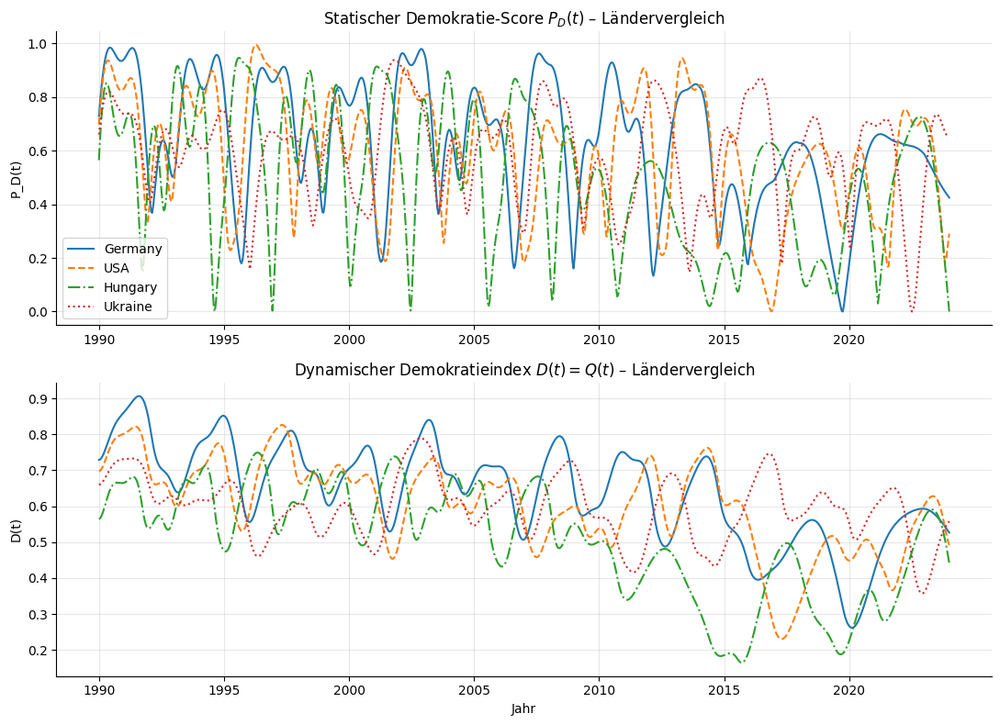

In [9]:
# ============================================================
# Diagnose + Sammelplots über alle vier Länder (P_D und D)
# mit x-Achsen-Ticks in 5-Jahres-Intervallen
# (nutzt 'democracy_results' aus der vorigen Zelle)
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

# --- Verfügbarkeit prüfen
if "democracy_results" not in globals() or not democracy_results:
    raise RuntimeError("❌ 'democracy_results' fehlt. Bitte zuerst die Demokratie-Index-Zelle ausführen.")

# --- Helfer: 5-Jahres-Ticks erzwingen (z.B. 1990, 1995, 2000, ...)
def _apply_year_ticks_5(ax, years):
    years = np.asarray(years, float)
    y0 = int(np.floor(years.min()))
    y1 = int(np.ceil(years.max()))
    # Starte auf der nächsten vollen 5er-Marke
    start = y0 - (y0 % 5) + (0 if y0 % 5 == 0 else (5 - (y0 % 5)))
    ticks = list(range(start, y1 + 1, 5))
    ax.set_xticks(ticks)
    ax.set_xticklabels([str(y) for y in ticks])
    ax.tick_params(axis='x', labelrotation=0)

# =========================
# 1) DIAGNOSE
# =========================
print("=== Demokratieindex-Diagnose je Land ===")
max_name_len = max(len(k) for k in democracy_results.keys())
all_lengths_equal = True

for country, d in democracy_results.items():
    t   = np.asarray(d["years"])
    KHn = np.asarray(d["KHn"])
    V   = np.asarray(d["V"])
    S   = np.asarray(d["S"])
    PD  = np.asarray(d["P_D"])
    D   = np.asarray(d["D"])

    lens = (len(t), len(KHn), len(V), len(S), len(PD), len(D))
    nans = (
        np.isnan(t).sum(),
        np.isnan(KHn).sum(),
        np.isnan(V).sum(),
        np.isnan(S).sum(),
        np.isnan(PD).sum(),
        np.isnan(D).sum()
    )

    ok_lengths = (len(set(lens)) == 1)
    all_lengths_equal &= ok_lengths

    print(f"{country:<{max_name_len}} | len(t,KHn,V,S,P_D,D) = {lens}  "
          f"| NaNs(t,KHn,V,S,P_D,D) = {nans}  "
          f"| same_len={ok_lengths}")

if not all_lengths_equal:
    print("\n⚠️ Hinweis: Nicht alle Längen sind identisch. "
          "Bitte prüfe die vorgelagerte Berechnung (Zeitgitter je Land).")
else:
    print("\n✅ Alle Längen sind je Land konsistent.")

# =========================
# 2) Sammel-Plots (alle Länder)
#    Oben: P_D(t) pro Land
#    Unten: D(t) pro Land
# =========================
styles = ["-", "--", "-.", ":"]
plt.figure(figsize=(11, 8))

# (a) P_D(t) oben
ax1 = plt.subplot(2, 1, 1)
for (country, d), sty in zip(democracy_results.items(), styles * 2):
    ax1.plot(d["years"], d["P_D"], sty, label=f"{country}")
ax1.set_title("Statischer Demokratie-Score $P_D(t)$ – Ländervergleich")
ax1.set_ylabel("P_D(t)")
ax1.grid(True, alpha=0.3)
ax1.legend(loc="best")
# 5-Jahres-Ticks
_apply_year_ticks_5(ax1, list(democracy_results.values())[0]["years"])

# (b) D(t) unten
ax2 = plt.subplot(2, 1, 2, sharex=ax1)
for (country, d), sty in zip(democracy_results.items(), styles * 2):
    ax2.plot(d["years"], d["D"], sty, label=f"{country}")
ax2.set_title("Dynamischer Demokratieindex $D(t)=Q(t)$ – Ländervergleich")
ax2.set_xlabel("Jahr")
ax2.set_ylabel("D(t)")
ax2.grid(True, alpha=0.3)
# 5-Jahres-Ticks
_apply_year_ticks_5(ax2, list(democracy_results.values())[0]["years"])

plt.tight_layout()
plt.show()


In [10]:
# ============================================================
# FIX-ADD-ON (minimal & nicht-invasiv):
# 1) Schrödinger-Pfade je Land erzeugen und in results_qsd_countries speichern
# 2) Sofort auf Jahresachse resamplen + R, C_l1, V, Feff_raw konsistent ablegen
# Voraussetzungen:
#   - A_STORE[country] mit keys: years(1D), A1(8xT), A0(8xT)
#   - make_H_of_t(years, A1, A0, alpha, beta) -> callable H(t) (3x3 complex)
#   - ALPHA_A1, BETA_A0 optional global vorhanden (sonst Defaults)
# Keine Formeländerungen, nur Datenfluss & Resampling.
# ============================================================

import numpy as np
from scipy.integrate import solve_ivp

# ---- Guards ----
if "A_STORE" not in globals() or not isinstance(A_STORE, dict) or not A_STORE:
    raise RuntimeError("A_STORE fehlt/leer. Bitte zuerst das A1/A0-Add-on laufen lassen.")

if "make_H_of_t" not in globals() or not callable(make_H_of_t):
    raise RuntimeError("make_H_of_t fehlt. Bitte zuerst das A1/A0-Add-on (mit make_H_of_t) ausführen.")

try:
    countries
except NameError:
    countries = list(A_STORE.keys())

ALPHA_A1 = float(globals().get("ALPHA_A1", 1.0))
BETA_A0  = float(globals().get("BETA_A0", 0.6))
AGENT_WEIGHTS = np.asarray(globals().get("AGENT_WEIGHTS", [0.5,0.3,0.2]), float)

# ---- SU(3) Generatoren (nur falls nicht bereits vorhanden) ----
if "LAM" not in globals():
    def _gell_mann():
        l1 = np.array([[0,1,0],[1,0,0],[0,0,0]], complex)
        l2 = np.array([[0,-1j,0],[1j,0,0],[0,0,0]], complex)
        l3 = np.array([[1,0,0],[0,-1,0],[0,0,0]], complex)
        l4 = np.array([[0,0,1],[0,0,0],[1,0,0]], complex)
        l5 = np.array([[0,0,-1j],[0,0,0],[1j,0,0]], complex)
        l6 = np.array([[0,0,0],[0,0,1],[0,1,0]], complex)
        l7 = np.array([[0,0,0],[0,0,-1j],[0,1j,0]], complex)
        l8 = (1/np.sqrt(3))*np.array([[1,0,0],[0,1,0],[0,0,-2]], complex)
        return [l1,l2,l3,l4,l5,l6,l7,l8]
    LAM = _gell_mann()

def _compute_feff_raw(years, A1, A0, alpha=ALPHA_A1, beta=BETA_A0):
    T = A1.shape[1]
    S_raw = np.zeros(T, float)
    for t in range(T):
        M1 = np.zeros((3,3), complex)
        M0 = np.zeros((3,3), complex)
        for a in range(8):
            M1 += alpha * A1[a, t] * LAM[a]
            M0 += beta  * A0[a, t] * LAM[a]
        Feff = 1j*(M0 @ M1 - M1 @ M0)
        S_raw[t] = np.linalg.norm(Feff, ord="fro")
    return S_raw

# ---------- 1) Schrödinger je Land (dichtes Gitter) ----------
def _schrodinger_rhs(t, y, H_func):
    psi = y[:3] + 1j*y[3:]
    dpsi = -1j * (H_func(t) @ psi)
    return np.concatenate([dpsi.real, dpsi.imag])

def _evolve_country_dense(years, A1, A0, alpha, beta, n_eval_min=800):
    t0, t1 = float(years[0]), float(years[-1])
    n_eval = max(n_eval_min, int((t1 - t0 + 1) * 20))
    t_eval = np.linspace(t0, t1, n_eval)
    H_t = make_H_of_t(years, A1, A0, alpha=alpha, beta=beta)

    e1 = np.array([1,0,0], complex)  # Blau
    e2 = np.array([0,1,0], complex)  # Orange
    e3 = np.array([0,0,1], complex)  # Grün

    out = {}
    for name, psi0 in [("pathA", e1), ("pathB", e2), ("pathC", e3)]:
        y0 = np.concatenate([psi0.real, psi0.imag])
        sol = solve_ivp(lambda t,y: _schrodinger_rhs(t,y,H_t),
                        (t0,t1), y0, t_eval=t_eval,
                        method="DOP853", rtol=1e-8, atol=1e-10)
        psi = sol.y[:3,:].T + 1j*sol.y[3:,:].T
        psi = psi / (np.linalg.norm(psi, axis=1, keepdims=True) + 1e-15)
        out[name] = psi
    out["t_eval"] = t_eval
    return out

# ---------- 2) Resampling auf Jahresachse + R, C_l1, V, Feff_raw ----------
def _resample_complex_path(t_src, path_src, t_dst):
    t_src = np.asarray(t_src, float); t_dst = np.asarray(t_dst, float)
    path_src = np.asarray(path_src, complex)
    out = np.empty((t_dst.size, 3), complex)
    for k in range(3):
        re = np.interp(t_dst, t_src, np.real(path_src[:,k]))
        im = np.interp(t_dst, t_src, np.imag(path_src[:,k]))
        out[:,k] = re + 1j*im
    out = out / (np.linalg.norm(out, axis=1, keepdims=True) + 1e-15)
    return out

def _derive_R_Cl1_V(psiA, psiB, psiC, weights):
    w = weights/np.sum(weights)
    T = psiA.shape[0]
    R = np.empty(T); Cl1 = np.empty(T)
    for i in range(T):
        mu = w[0]*psiA[i] + w[1]*psiB[i] + w[2]*psiC[i]
        r  = np.linalg.norm(mu); R[i] = r
        mu_hat = mu/(r+1e-15)
        Cl1[i] = np.clip(r*r*((np.sum(np.abs(mu_hat)))**2 - 1.0), 0.0, 2.0)
    pA = np.abs(psiA)**2; pB = np.abs(psiB)**2; pC = np.abs(psiC)**2
    p_mean = (pA+pB+pC)/3.0
    H = -np.sum(p_mean*np.log(p_mean+1e-12), axis=1)
    V = np.clip(H/np.log(3.0), 0.0, 1.0)
    return R, Cl1, V

# ---------- Ausführung: alles zusammenstecken ----------
if "results_qsd_countries" not in globals():
    results_qsd_countries = {}

for c in countries:
    if c not in A_STORE:
        print(f"⚠️ {c}: fehlt in A_STORE – übersprungen.")
        continue
    years = np.asarray(A_STORE[c]["years"], float)
    A1    = np.asarray(A_STORE[c]["A1"], float)
    A0    = np.asarray(A_STORE[c]["A0"], float)

    # 1) Schrödinger (dicht)
    sch = _evolve_country_dense(years, A1, A0, ALPHA_A1, BETA_A0, n_eval_min=800)

    # 2) Resampling auf die Jahresachse
    pathA_rs = _resample_complex_path(sch["t_eval"], sch["pathA"], years)
    pathB_rs = _resample_complex_path(sch["t_eval"], sch["pathB"], years)
    pathC_rs = _resample_complex_path(sch["t_eval"], sch["pathC"], years)

    # 3) Ableitungen + Feff_raw
    R, Cl1, V = _derive_R_Cl1_V(pathA_rs, pathB_rs, pathC_rs, AGENT_WEIGHTS)
    Feff_raw  = _compute_feff_raw(years, A1, A0, ALPHA_A1, BETA_A0)

    # 4) In results_qsd_countries konsolidieren
    d = results_qsd_countries.get(c, {})
    d["years"]      = years
    d["A1"]         = A1
    d["A0"]         = A0
    d["Feff_raw"]   = Feff_raw
    d["schrodinger"] = {  # dichte Pfade behalten wir zusätzlich
        "t_eval": sch["t_eval"],
        "pathA":  sch["pathA"],
        "pathB":  sch["pathB"],
        "pathC":  sch["pathC"],
    }
    d["psi_paths"]  = {   # auf years resampled
        "Blau":   pathA_rs,
        "Orange": pathB_rs,
        "Grün":   pathC_rs
    }
    d["R"], d["Cl1"], d["V"] = R, Cl1, V
    results_qsd_countries[c] = d

    print(f"✅ {c}: Schrödinger gespeichert & auf years resampled – T_years={years.size}, "
          f"psi(Blau) shape={pathA_rs.shape}, Feff_raw shape={Feff_raw.shape}")

print("🎯 Fertig: results_qsd_countries ist jetzt vollständig und konsistent aufgebaut.")


✅ Germany: Schrödinger gespeichert & auf years resampled – T_years=35, psi(Blau) shape=(35, 3), Feff_raw shape=(35,)
✅ USA: Schrödinger gespeichert & auf years resampled – T_years=35, psi(Blau) shape=(35, 3), Feff_raw shape=(35,)
✅ Hungary: Schrödinger gespeichert & auf years resampled – T_years=35, psi(Blau) shape=(35, 3), Feff_raw shape=(35,)
✅ Ukraine: Schrödinger gespeichert & auf years resampled – T_years=35, psi(Blau) shape=(35, 3), Feff_raw shape=(35,)
🎯 Fertig: results_qsd_countries ist jetzt vollständig und konsistent aufgebaut.


In [11]:
# ============================================================
# QSD SANITY HARNESS (nicht-invasiv, keine Formeländerungen)
# - Baut/vereinheitlicht results_qsd_countries aus A_STORE (A1/A0/years)
# - Berechnet Feff_raw exakt wie bisher
# - Leitet R, C_l1, V nur dann ab, wenn psi_paths vorhanden sind
# - Gibt klare, kurze Diagnosen aus
# ============================================================

import numpy as np

# ---- Helper: SU(3) Gell-Mann (nur falls nicht vorhanden) -------------------
if "LAM" not in globals():
    def _gell_mann():
        l1 = np.array([[0,1,0],[1,0,0],[0,0,0]], complex)
        l2 = np.array([[0,-1j,0],[1j,0,0],[0,0,0]], complex)
        l3 = np.array([[1,0,0],[0,-1,0],[0,0,0]], complex)
        l4 = np.array([[0,0,1],[0,0,0],[1,0,0]], complex)
        l5 = np.array([[0,0,-1j],[0,0,0],[1j,0,0]], complex)
        l6 = np.array([[0,0,0],[0,0,1],[0,1,0]], complex)
        l7 = np.array([[0,0,0],[0,0,-1j],[0,1j,0]], complex)
        l8 = (1/np.sqrt(3))*np.array([[1,0,0],[0,0,0]], complex)
        l8[2,2] = -2/np.sqrt(3)
        return [l1,l2,l3,l4,l5,l6,l7,l8]
    LAM = _gell_mann()

ALPHA_A1 = float(globals().get("ALPHA_A1", 1.0))
BETA_A0  = float(globals().get("BETA_A0", 0.6))
AGENT_WEIGHTS = np.asarray(globals().get("AGENT_WEIGHTS", [0.5,0.3,0.2]), float)

def _check_series(name, arr, ndim=None, shape0=None):
    if arr is None:
        raise RuntimeError(f"{name} fehlt.")
    a = np.asarray(arr)
    if ndim is not None and a.ndim != ndim:
        raise RuntimeError(f"{name}: erwartete ndim={ndim}, ist {a.ndim}.")
    if shape0 is not None and a.shape[0] != shape0:
        raise RuntimeError(f"{name}: erwartete shape[0]={shape0}, ist {a.shape[0]}.")
    if not np.all(np.isfinite(a)):
        raise RuntimeError(f"{name}: enthält NaN/Inf.")
    return a

def _compute_feff_raw(years, A1, A0, alpha=ALPHA_A1, beta=BETA_A0):
    T = A1.shape[1]
    S_raw = np.zeros(T, float)
    for t in range(T):
        M1 = np.zeros((3,3), complex)
        M0 = np.zeros((3,3), complex)
        for a in range(8):
            M1 += alpha * A1[a, t] * LAM[a]
            M0 += beta  * A0[a, t] * LAM[a]
        Feff = 1j*(M0 @ M1 - M1 @ M0)
        S_raw[t] = np.linalg.norm(Feff, ord="fro")
    return S_raw

def _R_Cl1_from_paths(psiA, psiB, psiC, weights):
    w = weights/np.sum(weights)
    T = psiA.shape[0]
    R = np.empty(T); Cl1 = np.empty(T)
    for k in range(T):
        mu = w[0]*psiA[k] + w[1]*psiB[k] + w[2]*psiC[k]
        r  = np.linalg.norm(mu)
        R[k] = r
        mu_hat = mu/(r+1e-15)
        Cl1[k] = np.clip(r*r*((np.sum(np.abs(mu_hat)))**2 - 1.0), 0.0, 2.0)
    return R, Cl1

def _variety_from_psi(psiA, psiB, psiC):
    pA = np.abs(psiA)**2; pB = np.abs(psiB)**2; pC = np.abs(psiC)**2
    p_mean = (pA+pB+pC)/3.0
    eps = 1e-12
    H = -np.sum(p_mean*np.log(p_mean+eps), axis=1)
    return np.clip(H/np.log(3.0), 0.0, 1.0)

# ---- Quelle wählen: vorhandenes results_qsd_countries respektieren --------------
if "results_qsd_countries" not in globals():
    results_qsd_countries = {}

# Falls A_STORE vorhanden ist, ziehe daraus A1/A0/years je Land
if "A_STORE" in globals() and isinstance(A_STORE, dict) and A_STORE:
    for c, dd in A_STORE.items():
        years = np.asarray(dd["years"], float)
        A1    = np.asarray(dd["A1"], float)
        A0    = np.asarray(dd["A0"], float)
        # Grund-Checks
        _check_series(f"{c}.years", years, ndim=1)
        if not np.all(np.diff(years) >= 0):
            raise RuntimeError(f"{c}.years ist nicht monoton steigend.")
        _check_series(f"{c}.A1", A1, ndim=2); _check_series(f"{c}.A0", A0, ndim=2)
        if A1.shape[0] != 8 or A0.shape[0] != 8:
            raise RuntimeError(f"{c}: A1/A0 müssen (8,T) sein.")
        if A1.shape[1] != years.size or A0.shape[1] != years.size:
            raise RuntimeError(f"{c}: A1/A0 T-Länge passt nicht zu years.")

        # Bestehenden Eintrag sanft ergänzen/vereinheitlichen
        d = results_qsd_countries.get(c, {})
        d["years"] = years
        d["A1"]    = A1
        d["A0"]    = A0

        # Feff_raw berechnen, wenn fehlt
        if "Feff_raw" not in d or d["Feff_raw"] is None or len(d["Feff_raw"]) != years.size:
            d["Feff_raw"] = _compute_feff_raw(years, A1, A0)

        # Falls bereits Pfade existieren, R/Cl1/V aktualisieren (nur daraus abgeleitet)
        if "psi_paths" in d and all(k in d["psi_paths"] for k in ("Blau","Orange","Grün")):
            psiA = _check_series(f"{c}.psi_paths[Blau]",  d["psi_paths"]["Blau"],  ndim=2, shape0=years.size)
            psiB = _check_series(f"{c}.psi_paths[Orange]",d["psi_paths"]["Orange"],ndim=2, shape0=years.size)
            psiC = _check_series(f"{c}.psi_paths[Grün]",  d["psi_paths"]["Grün"],  ndim=2, shape0=years.size)
            R, Cl1 = _R_Cl1_from_paths(psiA, psiB, psiC, AGENT_WEIGHTS)
            V = _variety_from_psi(psiA, psiB, psiC)
            d["R"], d["Cl1"], d["V"] = R, Cl1, V

        results_qsd_countries[c] = d

# ---- Diagnose kurz & knapp ---------------------------------------------------
if not results_qsd_countries:
    raise RuntimeError("Weder A_STORE noch bestehende results_qsd_countries verfügbar.")

print("=== QSD Sanity – Kurzdiagnose ===")
for c, d in results_qsd_countries.items():
    yrs = d.get("years", d.get("t_eval", None))
    if yrs is None:
        print(f"  • {c}: FEHLT years/t_eval")
        continue
    T = len(yrs)
    a1_ok = ("A1" in d) and isinstance(d["A1"], np.ndarray) and d["A1"].shape == (8,T)
    a0_ok = ("A0" in d) and isinstance(d["A0"], np.ndarray) and d["A0"].shape == (8,T)
    fe_ok = ("Feff_raw" in d) and isinstance(d["Feff_raw"], np.ndarray) and d["Feff_raw"].size == T
    psi_ok = ("psi_paths" in d) and all(k in d["psi_paths"] for k in ("Blau","Orange","Grün"))
    r_ok = ("R" in d) and isinstance(d["R"], np.ndarray) and d["R"].size == T
    cl_ok = ("Cl1" in d) and isinstance(d["Cl1"], np.ndarray) and d["Cl1"].size == T
    v_ok = ("V" in d) and isinstance(d["V"], np.ndarray) and d["V"].size == T
    print(f"  • {c}: T={T:3d} | A1/0={a1_ok}/{a0_ok} | Feff={fe_ok} | psi={psi_ok} | R/Cl1/V={r_ok}/{cl_ok}/{v_ok}")

print("✅ Sanity-Harness fertig. Ergebnisse in 'results_qsd_countries'.")


=== QSD Sanity – Kurzdiagnose ===
  • Germany: T= 35 | A1/0=True/True | Feff=True | psi=True | R/Cl1/V=True/True/True
  • USA: T= 35 | A1/0=True/True | Feff=True | psi=True | R/Cl1/V=True/True/True
  • Hungary: T= 35 | A1/0=True/True | Feff=True | psi=True | R/Cl1/V=True/True/True
  • Ukraine: T= 35 | A1/0=True/True | Feff=True | psi=True | R/Cl1/V=True/True/True
✅ Sanity-Harness fertig. Ergebnisse in 'results_qsd_countries'.


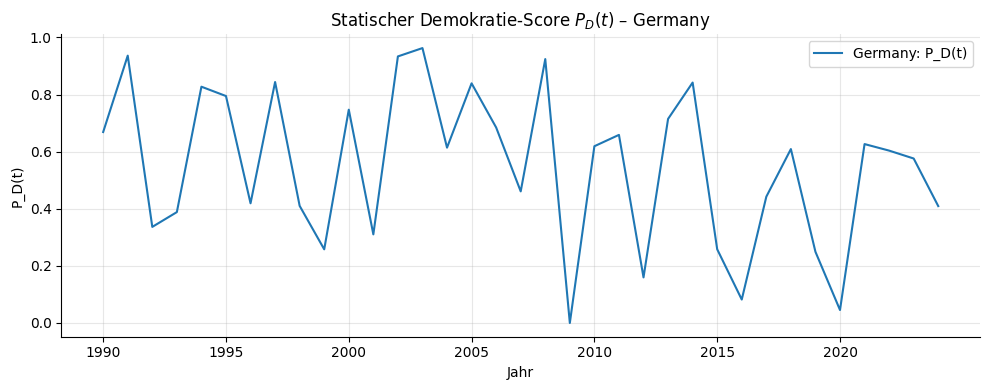

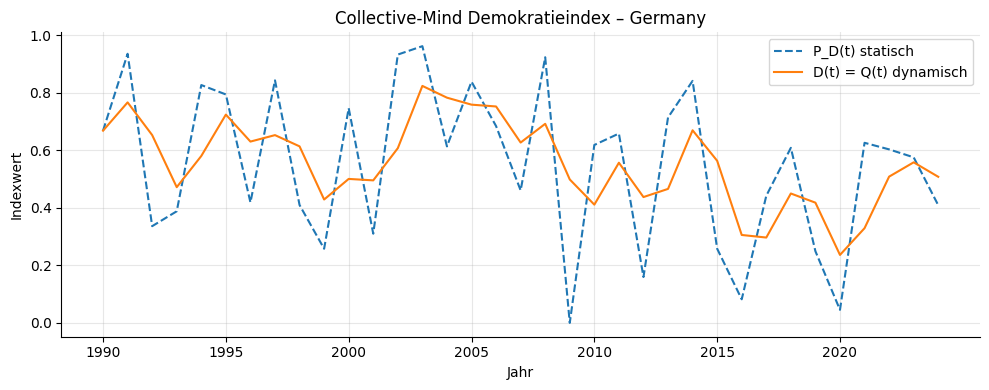

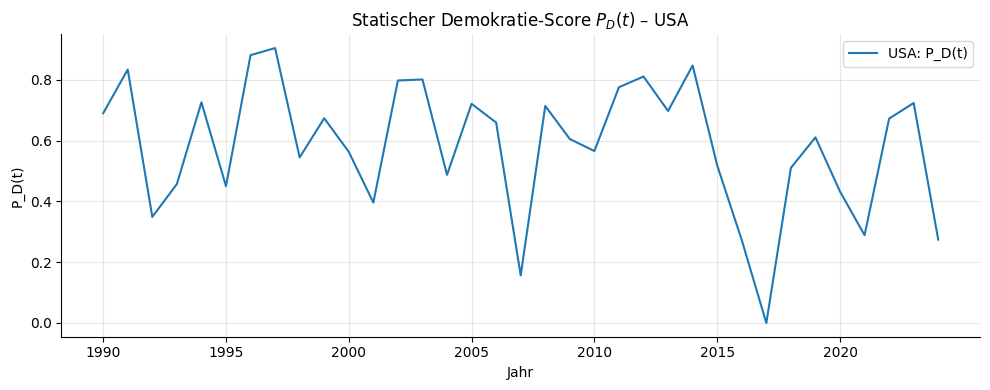

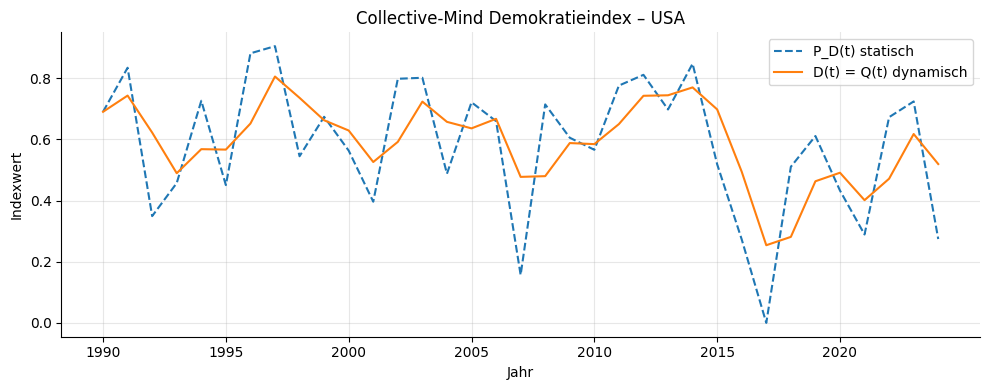

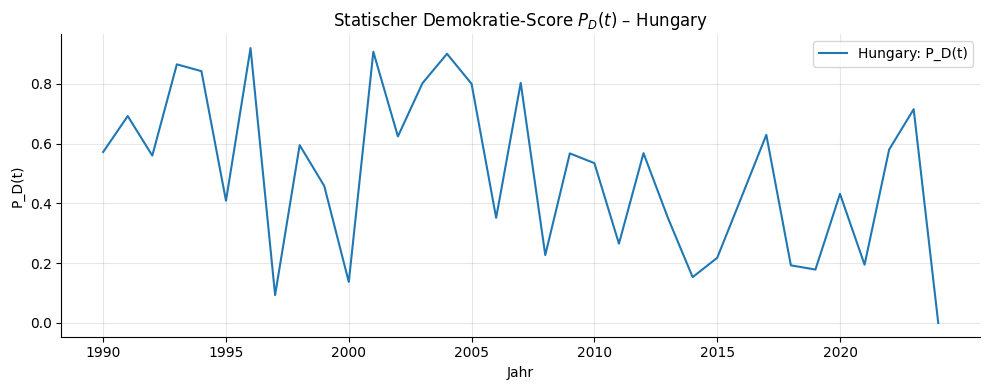

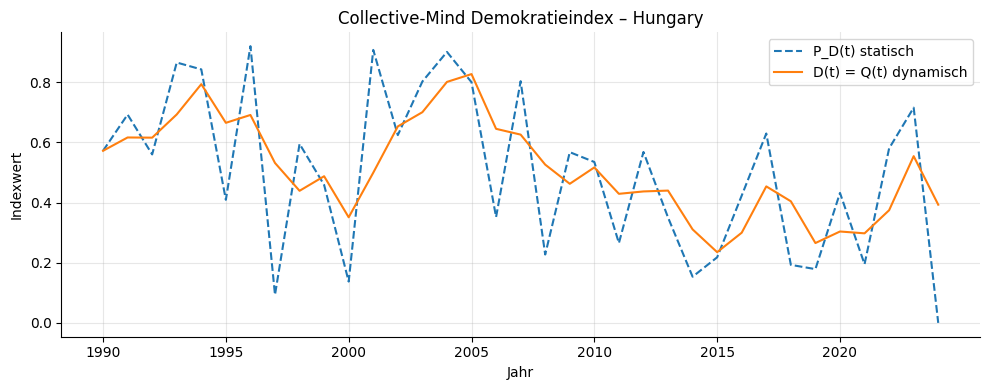

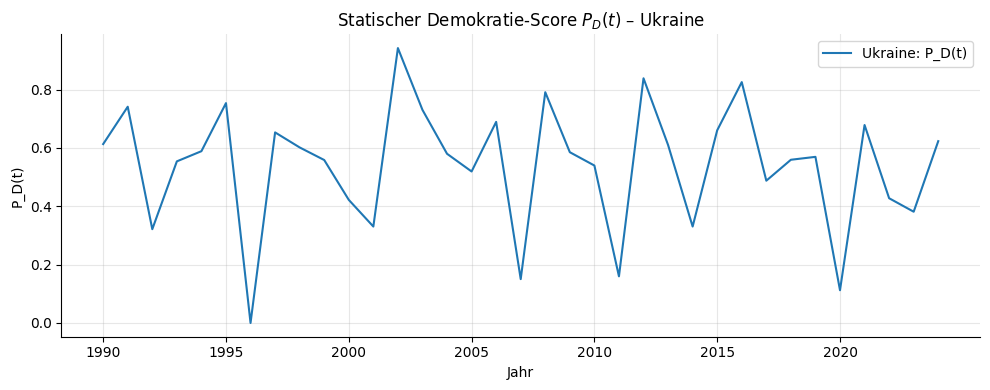

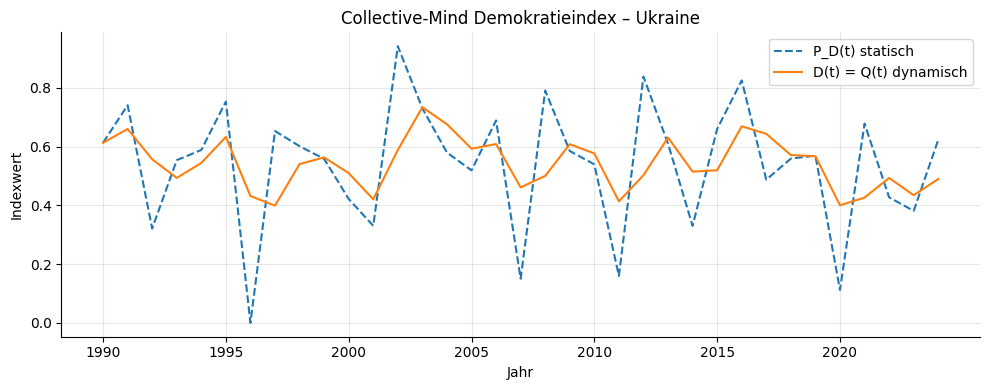

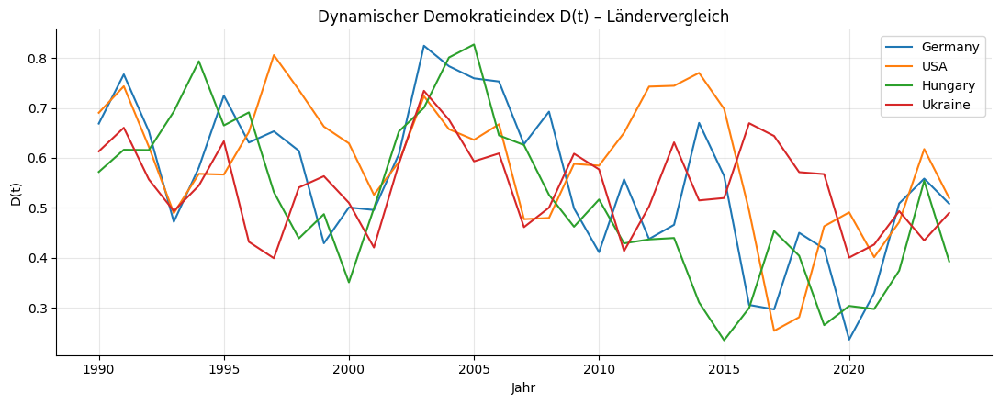

In [12]:
# ============================================================
# ADD-ON: Demokratieindex P_D(t) & D(t) für alle vier Länder
# - Keine Formeländerungen (wie Original):
#   KH(t) = C_l1(t) * R(t)
#   V(t)  = bereits berechnet (norm. Entropie der |psi|^2)
#   S(t)  = Feff_raw / max_all (globale Normierung über alle Länder)
#   P_D(t)= KH_norm(t) * V(t) / (1 + S(t))
#   dQ/dt = κ (P_D - Q), D(t)=Q(t), mit κ=1.0
# - Nutzt: results_qsd_countries (years, R, Cl1, V, Feff_raw)
# - Plots pro Land + Sammelplot
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# ---- Guards ----
if "results_qsd_countries" not in globals() or not results_qsd_countries:
    raise RuntimeError("results_qsd_countries fehlt/leer – bitte vorher das Schrödinger/Mean-Field-Add-on ausführen.")

try:
    countries
except NameError:
    countries = list(results_qsd_countries.keys())

KAPPA_Q = 1.0  # exakt wie im Original
YEAR_TICK_STEP = 5

def _year_ticks(ax, years, step=5):
    yi = years.astype(int)
    ticks = yi[::step]
    ax.set_xticks(ticks)
    ax.set_xticklabels([str(t) for t in ticks])

def _ode_rhs(t, Q, t_eval, P_D):
    P = np.interp(t, t_eval, P_D)
    return KAPPA_Q * (P - Q)

# ---- 1) Globale S-Norm (über alle Länder) vorbereiten ----
feff_all = []
for c in countries:
    if c in results_qsd_countries and "Feff_raw" in results_qsd_countries[c]:
        feff_all.append(np.asarray(results_qsd_countries[c]["Feff_raw"], float))
if not feff_all:
    raise RuntimeError("Feff_raw fehlt in results_qsd_countries.")
Feff_max_global = float(np.max(np.concatenate(feff_all)))
if Feff_max_global <= 0:
    Feff_max_global = 1.0

# ---- 2) Rechnen & Plotten pro Land ----
democracy_out = {}

for c in countries:
    d = results_qsd_countries[c]
    years = np.asarray(d["years"], float)
    R     = np.asarray(d["R"], float)
    Cl1   = np.asarray(d["Cl1"], float)
    V     = np.asarray(d["V"], float)
    S_raw = np.asarray(d["Feff_raw"], float)

    # KH, KH_norm (min-max je Land, wie im Original)
    KH = Cl1 * R
    KH_min, KH_max = float(KH.min()), float(KH.max())
    KH_norm = (KH - KH_min) / (KH_max - KH_min + 1e-12)

    # Vielfalt (liegt bereits in [0,1]), Spannung global normiert
    V = np.clip(V, 0.0, 1.0)
    S = np.clip(S_raw / Feff_max_global, 0.0, 1.0)

    # P_D
    P_D = KH_norm * V / (1.0 + S)

    # Dynamik D(t)=Q(t) via dQ/dt = κ (P_D - Q), Q0 = P_D(t0)
    Q0 = float(P_D[0])
    sol = solve_ivp(lambda t, Q: _ode_rhs(t, Q, years, P_D),
                    (float(years[0]), float(years[-1])),
                    [Q0], t_eval=years, rtol=1e-8, atol=1e-9, method="RK45")
    Q = sol.y[0]

    democracy_out[c] = dict(years=years, P_D=P_D, D=Q, KH_norm=KH_norm, V=V, S=S)

    # ---- Plots wie im Original ----
    # (1) Statischer P_D(t)
    plt.figure(figsize=(10,4))
    plt.plot(years, P_D, label=f"{c}: P_D(t)")
    plt.title(f"Statischer Demokratie-Score $P_D(t)$ – {c}")
    plt.xlabel("Jahr"); plt.ylabel("P_D(t)")
    _year_ticks(plt.gca(), years, YEAR_TICK_STEP)
    plt.grid(True, alpha=0.3); plt.legend(); plt.tight_layout(); plt.show()

    # (2) Dynamischer Index D(t) vs. P_D(t)
    plt.figure(figsize=(10,4))
    plt.plot(years, P_D, "--", label="P_D(t) statisch")
    plt.plot(years, Q,  "-", label="D(t) = Q(t) dynamisch")
    plt.title(f"Collective-Mind Demokratieindex – {c}")
    plt.xlabel("Jahr"); plt.ylabel("Indexwert")
    _year_ticks(plt.gca(), years, YEAR_TICK_STEP)
    plt.grid(True, alpha=0.3); plt.legend(); plt.tight_layout(); plt.show()

# ---- 3) Sammelplot über alle Länder (Dynamik) ----
plt.figure(figsize=(11,4.5))
for c in countries:
    yy = democracy_out[c]["years"]; DD = democracy_out[c]["D"]
    plt.plot(yy, DD, label=c)
plt.title("Dynamischer Demokratieindex D(t) – Ländervergleich")
plt.xlabel("Jahr"); plt.ylabel("D(t)")
_year_ticks(plt.gca(), democracy_out[countries[0]]["years"], YEAR_TICK_STEP)
plt.grid(True, alpha=0.3); plt.legend(); plt.tight_layout(); plt.show()


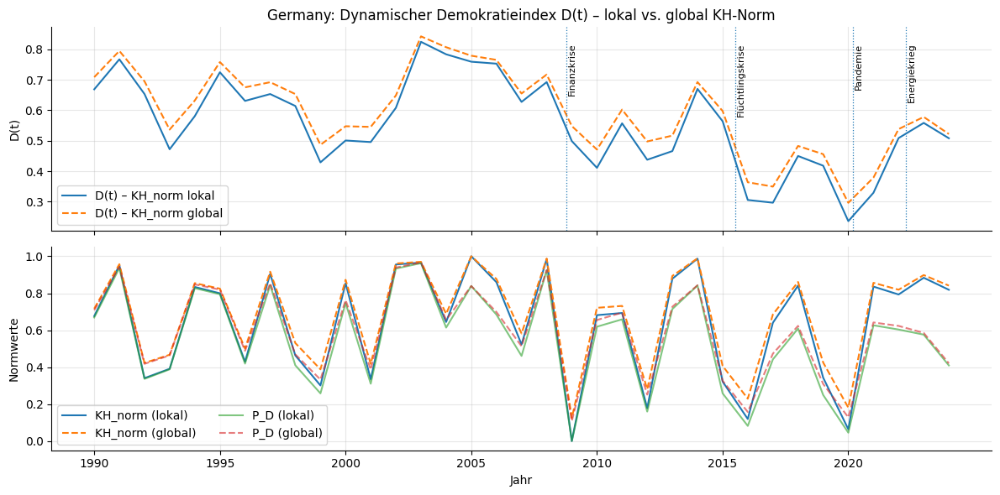

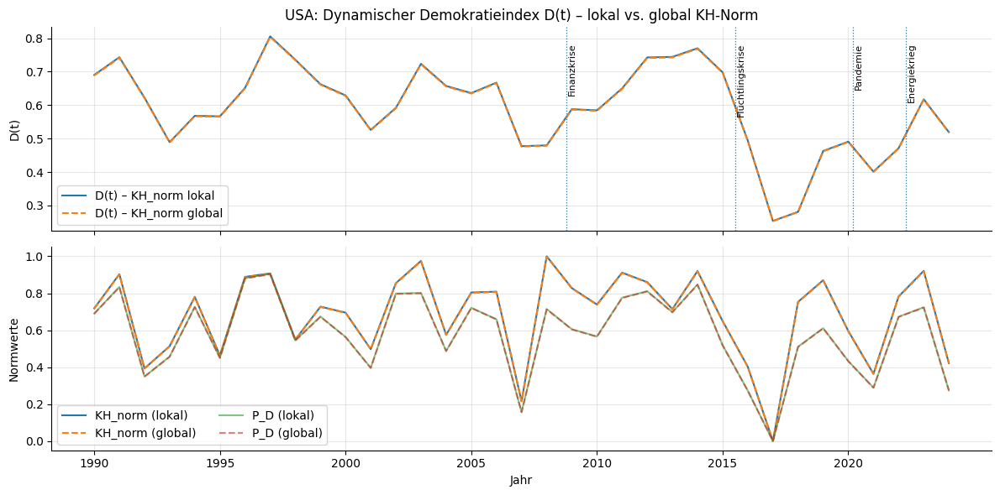

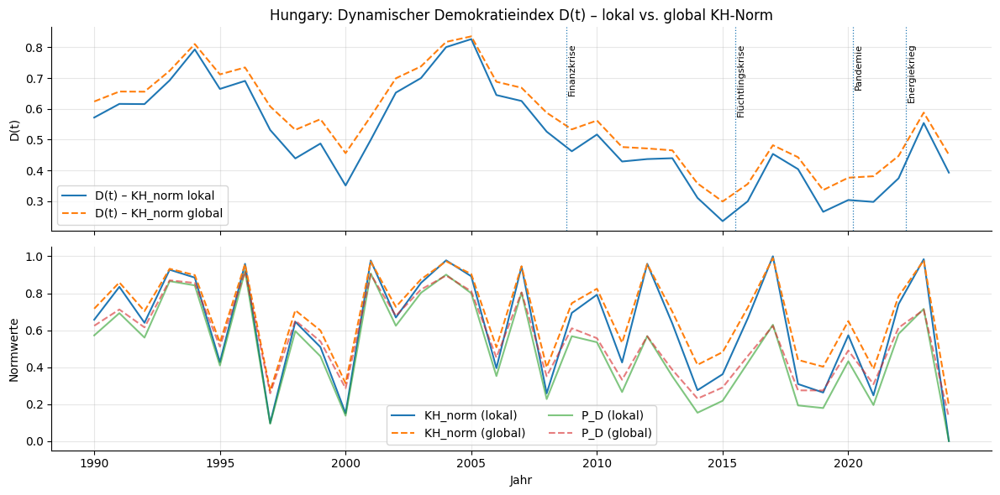

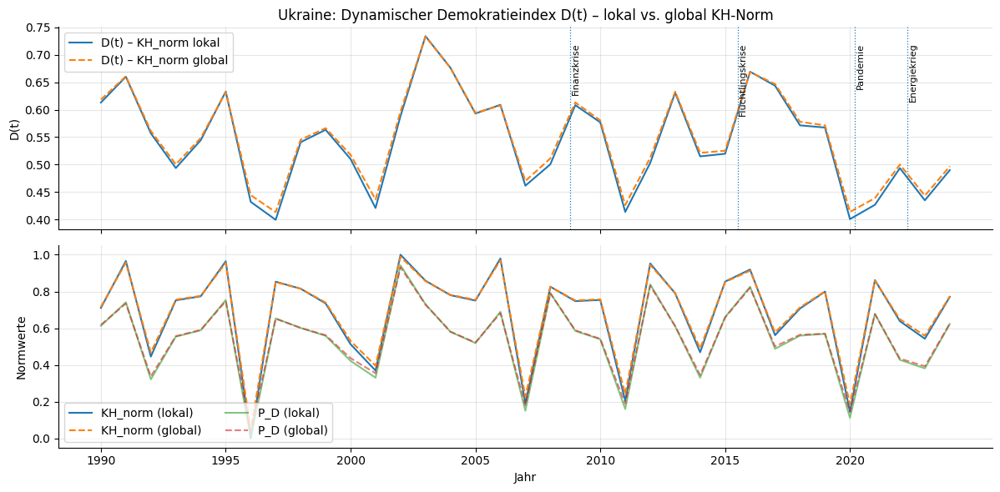

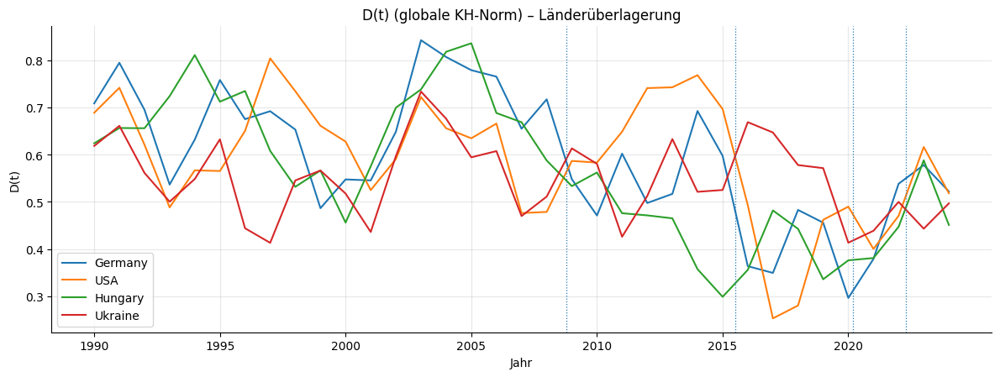

✅ Add-on fertig: D(t) mit Event-Overlays + KH_norm/P_D lokal vs global geplottet.


In [13]:
# ============================================================
# ADD-ON: Ereignis-Overlays + KH-Norm (lokal vs global)
# Formeln unverändert:
#   P_D = KH_norm * V / (1 + S_global)
#   dQ/dt = κ (P_D - Q)
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# ---------- Inputs prüfen / bereitstellen ----------
if "results_qsd_countries" not in globals() or not results_qsd_countries:
    raise RuntimeError("results_qsd_countries fehlt. Bitte zuvor A1/A0+Schrödinger/Mean-Field laufen lassen.")

countries = list(results_qsd_countries.keys())

# Globale Spannungsskala: S_global = Feff_raw / max_all
feff_all = []
KH_all   = []
for c in countries:
    d = results_qsd_countries[c]
    for key in ("years","R","Cl1","V","Feff_raw"):
        if key not in d:
            raise RuntimeError(f"{c}: '{key}' fehlt in results_qsd_countries.")
    feff_all.append(np.asarray(d["Feff_raw"], float))
    KH_all.append(np.asarray(d["R"], float) * np.asarray(d["Cl1"], float))

Feff_max_global = float(np.max(np.concatenate(feff_all)))
if Feff_max_global <= 0: Feff_max_global = 1.0

KH_concat = np.concatenate(KH_all)
KH_g_min  = float(np.min(KH_concat))
KH_g_max  = float(np.max(KH_concat))
KH_g_span = KH_g_max - KH_g_min if KH_g_max > KH_g_min else 1.0

# Ereignisse für Overlays
EVENTS = {
    2008.8: "Finanzkrise",
    2015.5: "Flüchtlingskrise",
    2020.2: "Pandemie",
    2022.3: "Energiekrieg"
}

KAPPA_Q = 1.0  # exakt wie im Original

def integrate_Q(years, P_D, kappa=1.0):
    years = np.asarray(years, float)
    P_D   = np.asarray(P_D, float)
    def rhs(t, y):
        return kappa * (np.interp(t, years, P_D) - y[0])
    Q0 = P_D[0]
    sol = solve_ivp(rhs, (years[0], years[-1]), [Q0], t_eval=years,
                    rtol=1e-8, atol=1e-9, method="RK45")
    return sol.y[0]

def _year_ticks(ax, years, every=5):
    yi = years.astype(int)
    ticks = yi[::every if len(yi) >= every else 1]
    ax.set_xticks(ticks)
    ax.set_xticklabels([str(t) for t in ticks])

# ---------- Haupt: pro Land rechnen & plotten ----------
for c in countries:
    d = results_qsd_countries[c]
    years = np.asarray(d["years"], float)
    R     = np.asarray(d["R"], float)
    Cl1   = np.asarray(d["Cl1"], float)
    V     = np.clip(np.asarray(d["V"], float), 0.0, 1.0)
    Sg    = np.clip(np.asarray(d["Feff_raw"], float) / Feff_max_global, 0.0, 1.0)

    KH = R * Cl1

    # KH-Norm lokal
    KH_l_min, KH_l_max = float(KH.min()), float(KH.max())
    KH_l_span = KH_l_max - KH_l_min if KH_l_max > KH_l_min else 1.0
    KHn_local  = (KH - KH_l_min) / KH_l_span

    # KH-Norm global
    KHn_global = (KH - KH_g_min) / KH_g_span

    # P_D
    P_D_local  = KHn_local  * V / (1.0 + Sg)
    P_D_global = KHn_global * V / (1.0 + Sg)

    # D(t) = Q(t) via ODE
    D_local  = integrate_Q(years, P_D_local,  kappa=KAPPA_Q)
    D_global = integrate_Q(years, P_D_global, kappa=KAPPA_Q)

    # zurückspeichern (zur späteren Weiterverwendung)
    d.setdefault("diagnostics", {})
    d["diagnostics"].update(dict(
        KH=KH, KHn_local=KHn_local, KHn_global=KHn_global,
        P_D_local=P_D_local, P_D_global=P_D_global,
        D_local=D_local, D_global=D_global, S_global=Sg
    ))

    # ---- Plot 1: D(t) lokal vs global + Events ----
    fig, axes = plt.subplots(2,1, figsize=(12,6), sharex=True)
    axes[0].plot(years, D_local,  label="D(t) – KH_norm lokal")
    axes[0].plot(years, D_global, "--", label="D(t) – KH_norm global")
    axes[0].set_title(f"{c}: Dynamischer Demokratieindex D(t) – lokal vs. global KH-Norm")
    axes[0].set_ylabel("D(t)"); axes[0].grid(True, alpha=.3); axes[0].legend()
    ymin, ymax = axes[0].get_ylim()
    for x, lab in EVENTS.items():
        axes[0].axvline(x, linestyle=":", linewidth=0.9)
        axes[0].text(x+0.05, ymax-(ymax-ymin)*0.08, lab, rotation=90, fontsize=8, va="top")

    # ---- Plot 2: KHn lokal vs global + P_D lokal/global ----
    axes[1].plot(years, KHn_local,  label="KH_norm (lokal)")
    axes[1].plot(years, KHn_global, "--", label="KH_norm (global)")
    axes[1].plot(years, P_D_local,  alpha=0.6, label="P_D (lokal)")
    axes[1].plot(years, P_D_global, "--", alpha=0.6, label="P_D (global)")
    axes[1].set_ylabel("Normwerte"); axes[1].grid(True, alpha=.3); axes[1].legend(ncol=2)
    _year_ticks(axes[1], years, every=5); axes[1].set_xlabel("Jahr")
    plt.tight_layout(); plt.show()

# ---------- Sammelplot: D_global aller Länder ----------
plt.figure(figsize=(12,4.6))
for c in countries:
    d = results_qsd_countries[c]
    years = np.asarray(d["years"], float)
    Dg    = np.asarray(d["diagnostics"]["D_global"], float)
    plt.plot(years, Dg, label=c)
for x, lab in EVENTS.items():
    plt.axvline(x, linestyle=":", linewidth=0.9)
plt.title("D(t) (globale KH-Norm) – Länderüberlagerung")
plt.xlabel("Jahr"); plt.ylabel("D(t)"); plt.grid(True, alpha=.3); plt.legend()
_year_ticks(plt.gca(), years, every=5)
plt.tight_layout(); plt.show()

print("✅ Add-on fertig: D(t) mit Event-Overlays + KH_norm/P_D lokal vs global geplottet.")


/tmp/ipython-input-1350526663.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


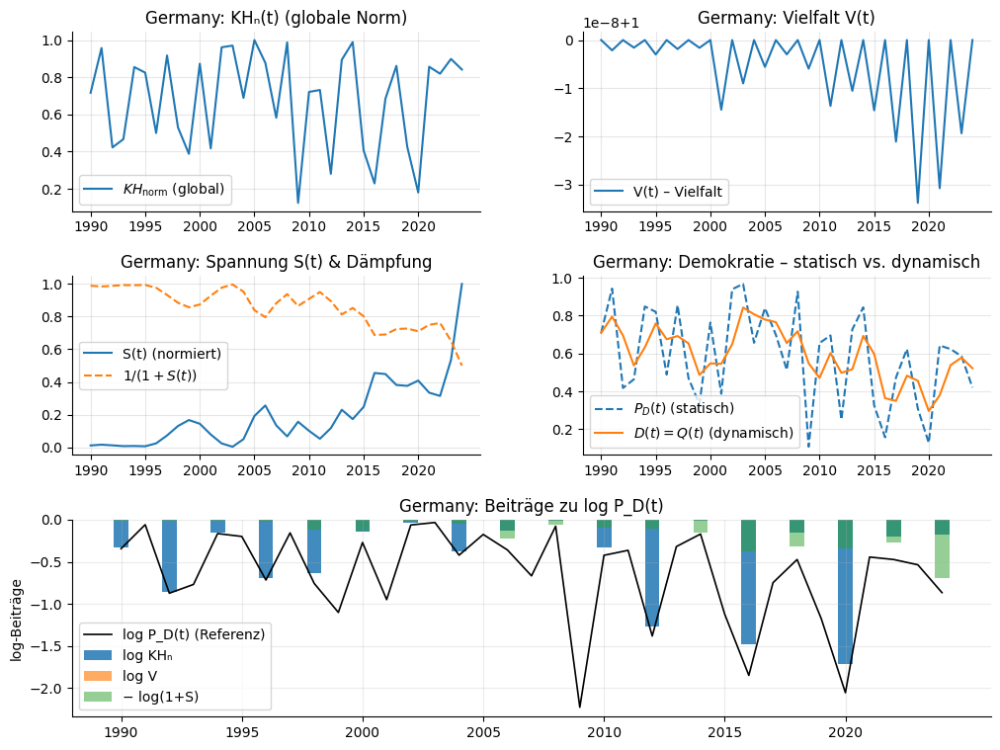

/tmp/ipython-input-1350526663.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


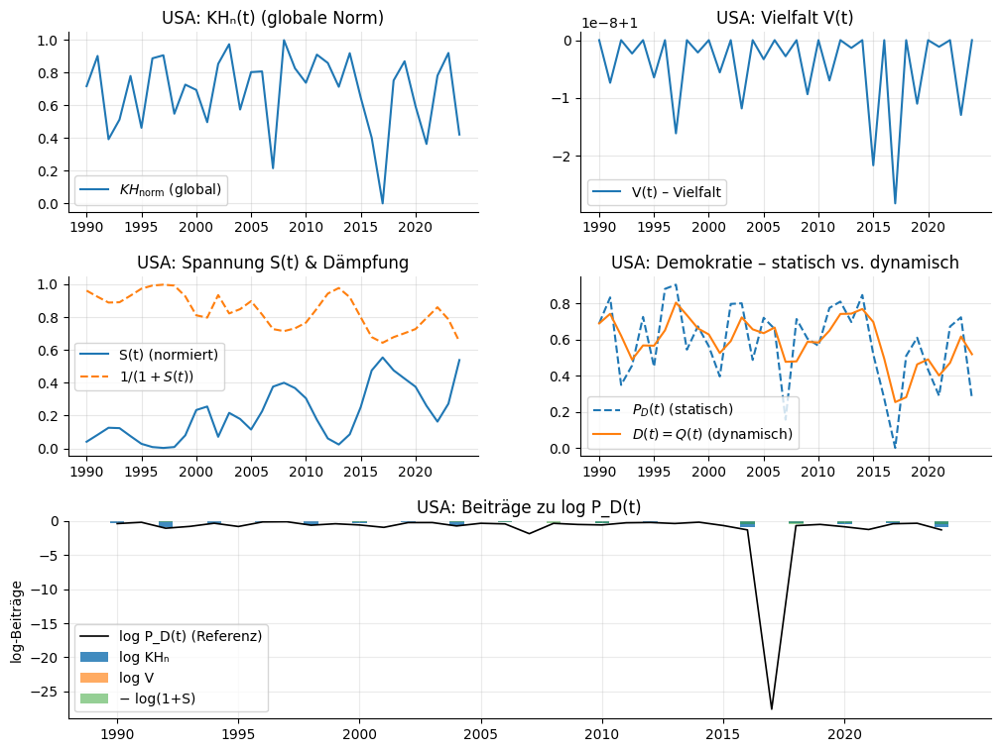

/tmp/ipython-input-1350526663.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


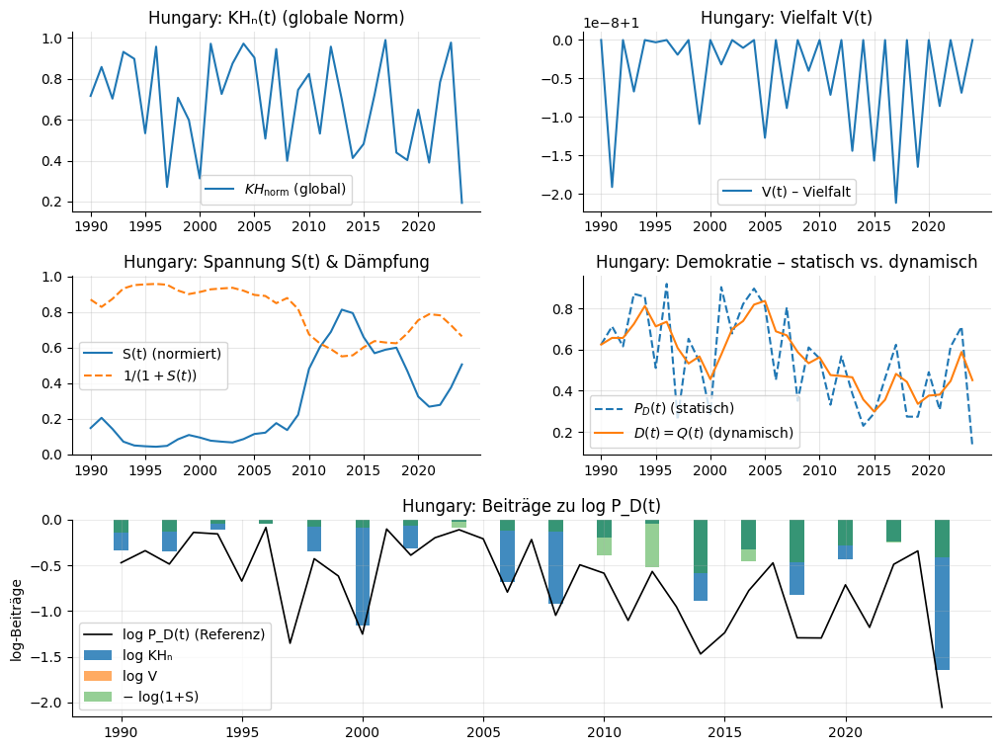

/tmp/ipython-input-1350526663.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


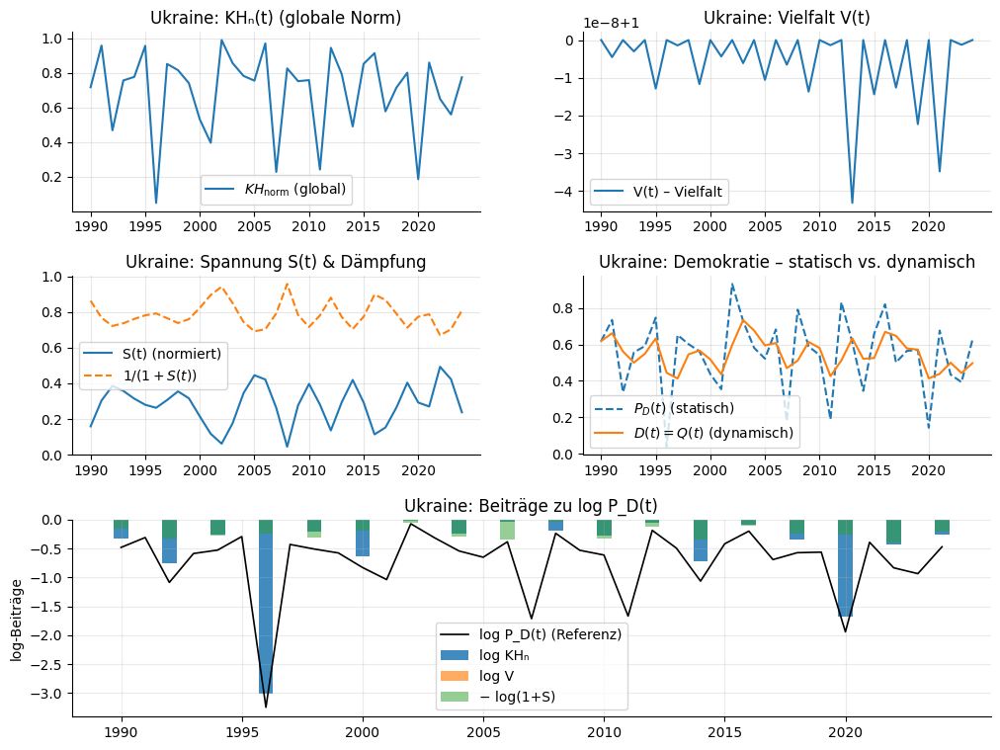

In [14]:
# ============================================================
# ADD-ON: Decompose-Plots für Demokratieindex (ohne Formeländerung)
# Nutzt vorhandene results_qsd_countries (R, Cl1, V, Feff_raw, years)
# Zeigt je Land: KH_n (global), V, S & 1/(1+S), P_D, D sowie log-Beitragsbalken
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# ---- Erwartungen prüfen
if "results_qsd_countries" not in globals() or not results_qsd_countries:
    raise RuntimeError("results_qsd_countries fehlt/leer. Bitte erst QSD + Sanity-Harness laufen lassen.")

# Länder-Liste
try:
    countries
except NameError:
    countries = list(results_qsd_countries.keys())

# ODE-Parameter (Formel unverändert)
KAPPA_Q = float(globals().get("KAPPA_Q", 1.0))

# ---------- Hilfsfunktionen ----------
def _year_ticks(ax, years, every=5):
    yi = years.astype(int)
    ticks = yi[::every]
    ax.set_xticks(ticks)
    ax.set_xticklabels([str(y) for y in ticks])
    ax.tick_params(axis='x', labelrotation=0)

def _solve_Q(years, P_D, kappa=1.0):
    """dQ/dt = κ (P_D - Q), Q(t0) = P_D(t0)"""
    t = np.asarray(years, float)
    P = np.asarray(P_D, float)
    Q0 = float(P[0])

    def rhs(t_, Q_):
        # lineare Interp. von P_D(t)
        P_t = np.interp(t_, t, P)
        return kappa * (P_t - Q_[0])

    sol = solve_ivp(rhs, (t[0], t[-1]), [Q0], t_eval=t, rtol=1e-8, atol=1e-9)
    return sol.y[0]

# ---------- Globale KH-Norm bestimmen (aus allen Ländern) ----------
KH_all = []
for c in countries:
    d = results_qsd_countries.get(c, {})
    if not all(k in d for k in ("years","R","Cl1")):
        continue
    KH_all.append(np.asarray(d["R"], float) * np.asarray(d["Cl1"], float))

if not KH_all:
    raise RuntimeError("Keine KH-Quellen gefunden (R*Cl1). Fehlen R/Cl1 in results_qsd_countries?")

KH_concat = np.concatenate(KH_all)
KH_min_glob = np.min(KH_concat)
KH_max_glob = np.max(KH_concat)
denom = KH_max_glob - KH_min_glob if KH_max_glob > KH_min_glob else 1.0

def KH_norm_global(KH):
    return (KH - KH_min_glob) / denom

# ---------- Pro Land: Decompose-Plot ----------
EPS = 1e-12

for c in countries:
    d = results_qsd_countries.get(c, {})
    if not all(k in d for k in ("years","R","Cl1","V","Feff_raw")):
        print(f"⚠️ {c}: fehlende Größen (benötigt: years, R, Cl1, V, Feff_raw) – übersprungen.")
        continue

    years = np.asarray(d["years"], float)
    R     = np.asarray(d["R"], float)
    Cl1   = np.asarray(d["Cl1"], float)
    V     = np.clip(np.asarray(d["V"], float), 0.0, 1.0)
    S_raw = np.asarray(d["Feff_raw"], float)

    # Spannung global normieren (wie zuvor vereinbart)
    # -> wir nehmen das globale Maximum über alle Länder, damit Dämpfungsskala vergleichbar bleibt
    # Falls noch nicht vorhanden, sammeln wir globales Max on-the-fly
    # (Cache in globaler Variable für Konsistenz über alle Länderläufe)
    if "_GLOBAL_SMAX_" not in globals():
        _GLOBAL_SMAX_ = np.max(np.concatenate([np.asarray(results_qsd_countries[x]["Feff_raw"], float)
                                               for x in results_qsd_countries if "Feff_raw" in results_qsd_countries[x]]))
        if _GLOBAL_SMAX_ <= 0: _GLOBAL_SMAX_ = 1.0

    S = np.clip(S_raw / _GLOBAL_SMAX_, 0.0, 1.0)

    # KH & KH_norm (global)
    KH    = R * Cl1
    KH_n  = KH_norm_global(KH)

    # P_D & D
    P_D = (KH_n * V) / (1.0 + S)
    D   = _solve_Q(years, P_D, kappa=KAPPA_Q)

    # --- Figurenlayout ---
    fig = plt.figure(figsize=(12, 9))
    gs = fig.add_gridspec(3, 2, height_ratios=[1,1,1.1], hspace=0.35, wspace=0.25)

    ax1 = fig.add_subplot(gs[0, 0])  # KH_n
    ax2 = fig.add_subplot(gs[0, 1])  # V
    ax3 = fig.add_subplot(gs[1, 0])  # S & 1/(1+S)
    ax4 = fig.add_subplot(gs[1, 1])  # P_D & D
    ax5 = fig.add_subplot(gs[2, :])  # log-Beiträge (Barchart)

    # 1) KH_n (global)
    ax1.plot(years, KH_n, label=r"$KH_{\mathrm{norm}}$ (global)")
    ax1.set_title(f"{c}: KHₙ(t) (globale Norm)"); ax1.grid(True, alpha=.3); ax1.legend()
    _year_ticks(ax1, years, every=5)

    # 2) Vielfalt V
    ax2.plot(years, V, label="V(t) – Vielfalt")
    ax2.set_title(f"{c}: Vielfalt V(t)"); ax2.grid(True, alpha=.3); ax2.legend()
    _year_ticks(ax2, years, every=5)

    # 3) Spannung
    ax3.plot(years, S, label="S(t) (normiert)")
    ax3.plot(years, 1.0/(1.0+S+EPS), linestyle="--", label=r"$1/(1+S(t))$")
    ax3.set_title(f"{c}: Spannung S(t) & Dämpfung"); ax3.grid(True, alpha=.3); ax3.legend()
    _year_ticks(ax3, years, every=5)

    # 4) P_D & D
    ax4.plot(years, P_D, "--", label=r"$P_D(t)$ (statisch)")
    ax4.plot(years, D,  "-", label=r"$D(t)=Q(t)$ (dynamisch)")
    ax4.set_title(f"{c}: Demokratie – statisch vs. dynamisch"); ax4.grid(True, alpha=.3); ax4.legend()
    _year_ticks(ax4, years, every=5)

    # 5) Log-Beiträge als Balken: log P_D = log KH_n + log V − log(1+S)
    #    Zur Lesbarkeit balkenweise nur jedes 2.–3. Jahr plotten
    step = 2 if years.size <= 40 else 3
    y_sel = years[::step]
    KHc   = np.maximum(KH_n[::step], EPS)
    Vc    = np.maximum(V[::step],    EPS)
    Sc    = np.maximum(S[::step],    0.0)
    comp1 = np.log(KHc)                    # ≥ log(EPS)
    comp2 = np.log(Vc)
    comp3 = -np.log(1.0 + Sc)              # ≤ 0

    # Gestapelte Darstellung: pos = comp1 + comp2 (>=?) und neg = comp3
    # Wir zeichnen drei Balken pro Jahr als übereinanderliegende Segmentblöcke
    width = 0.6
    base  = np.zeros_like(comp1)
    ax5.bar(y_sel, comp1, width=width, label="log KHₙ", alpha=0.85)
    ax5.bar(y_sel, comp2, bottom=comp1, width=width, label="log V", alpha=0.65)
    # Für den negativen Anteil zeichnen wir separat (unten)
    ax5.bar(y_sel, comp3, width=width, label="− log(1+S)", alpha=0.5)

    # Referenz: log P_D als Linie
    log_PD = np.log(np.maximum(P_D, EPS))
    ax5.plot(years, log_PD, color="k", linewidth=1.2, label="log P_D(t) (Referenz)")

    ax5.set_title(f"{c}: Beiträge zu log P_D(t)")
    ax5.set_ylabel("log-Beiträge")
    ax5.grid(True, alpha=.25)
    ax5.legend(loc="best")
    _year_ticks(ax5, years, every=5)

    plt.tight_layout()
    plt.show()


In [15]:
# Off-diagonal vs. diagonal Power im kombinierten Feld (nur Diagnostik)
import numpy as np

OFF = [0,1,3,4,5,6]   # λ1,2,4,5,6,7 -> Off-Diagonal
DIAG = [2,7]          # λ3, λ8       -> Diagonal

def offdiag_share(A1, A0, alpha, beta):
    # A1,A0: shape (8,T)
    W = alpha*np.abs(A1) + beta*np.abs(A0)    # Betrag als einfache “Power”-Proxy
    off = W[OFF].sum(axis=0)
    dia = W[DIAG].sum(axis=0)
    return off / (off+dia + 1e-15)

for c,d in results_qsd_countries.items():
    A1 = d["A1"]; A0 = d["A0"]
    share = offdiag_share(A1, A0, ALPHA_A1, BETA_A0)
    print(f"{c}: mittlerer Off-Diagonal-Anteil = {share.mean():.2f}")


Germany: mittlerer Off-Diagonal-Anteil = 0.76
USA: mittlerer Off-Diagonal-Anteil = 0.75
Hungary: mittlerer Off-Diagonal-Anteil = 0.75
Ukraine: mittlerer Off-Diagonal-Anteil = 0.75


In [16]:
# ============================================================
# QSD CORE ADD-ON (konsistent, ohne Resampling/Patches)
# - Erwartet: A_STORE[country] mit "years"(T,), "A1"(8,T), "A0"(8,T)
# - Baut H(t)=αA1+βA0, löst Schrödinger auf 'years' (DOP853),
#   berechnet psi_paths, R, C_l1, V, Feff_raw
# - Speichert alles in results_qsd_countries[country]
# ============================================================

import numpy as np
from scipy.integrate import solve_ivp

# ---------- Voraussetzungen prüfen ----------
if "A_STORE" not in globals() or not isinstance(A_STORE, dict) or not A_STORE:
    raise RuntimeError("A_STORE fehlt/leer. Bitte zuerst das A1/A0-Add-on ausführen.")

try:
    countries
except NameError:
    countries = list(A_STORE.keys())

# ============================================================
# >>>>>>> T U N I N G  (keine Formeländerungen) <<<<<<<<
# ============================================================
ALPHA_A1  = globals().get("ALPHA_A1", 1.0)   # Gewicht vor A1 in H
BETA_A0   = globals().get("BETA_A0",  0.6)   # Gewicht vor A0 in H
AGENT_WEIGHTS = np.array(globals().get("AGENT_WEIGHTS", [0.5, 0.3, 0.2]), float)

ODESOLVER_METHOD = "DOP853"  # wie Referenz
RTOL, ATOL = 1e-8, 1e-10
# ============================================================

# ---------- SU(3) Generatoren ----------
def _gell_mann():
    l1 = np.array([[0,1,0],[1,0,0],[0,0,0]], complex)
    l2 = np.array([[0,-1j,0],[1j,0,0],[0,0,0]], complex)
    l3 = np.array([[1,0,0],[0,-1,0],[0,0,0]], complex)
    l4 = np.array([[0,0,1],[0,0,0],[1,0,0]], complex)
    l5 = np.array([[0,0,-1j],[0,0,0],[1j,0,0]], complex)
    l6 = np.array([[0,0,0],[0,0,1],[0,1,0]], complex)
    l7 = np.array([[0,0,0],[0,0,-1j],[0,1j,0]], complex)
    l8 = (1/np.sqrt(3))*np.array([[1,0,0],[0,1,0],[0,0,-2]], complex)
    return [l1,l2,l3,l4,l5,l6,l7,l8]
LAM = _gell_mann()

# ---------- Hamilton-Fabrik auf years ----------
def make_H_of_years(years, A1, A0, alpha=ALPHA_A1, beta=BETA_A0):
    years = np.asarray(years, float)
    A1 = np.asarray(A1, float)
    A0 = np.asarray(A0, float)
    if A1.shape != A0.shape or A1.shape[0] != 8:
        raise ValueError("A1/A0 müssen Shape (8,T) besitzen.")

    # Precompute H(t_k) auf den diskreten Jahren und lineare Interpolation dazwischen
    H_list = []
    for k in range(years.size):
        M = np.zeros((3,3), complex)
        for a in range(8):
            M += alpha * A1[a, k] * LAM[a] + beta * A0[a, k] * LAM[a]
        H_list.append(M)

    def H_func(t):
        # linear zwischen Jahren interpolieren (Matrixelement-weise)
        if t <= years[0]: return H_list[0]
        if t >= years[-1]: return H_list[-1]
        i = np.searchsorted(years, t) - 1
        t0, t1 = years[i], years[i+1]
        w = (t - t0) / (t1 - t0 + 1e-15)
        return (1.0 - w) * H_list[i] + w * H_list[i+1]

    return H_func

# ---------- Schrödingerdynamik auf years ----------
def _schrod_rhs(t, y, H_func):
    psi = y[:3] + 1j*y[3:]
    dpsi = -1j * (H_func(t) @ psi)
    return np.concatenate([np.real(dpsi), np.imag(dpsi)])

def evolve_on_years(H_func, years):
    t0, t1 = float(years[0]), float(years[-1])
    t_eval = years.astype(float)
    def _evolve_from(psi0):
        y0 = np.concatenate([np.real(psi0), np.imag(psi0)])
        sol = solve_ivp(lambda tt,yy: _schrod_rhs(tt,yy,H_func),
                        (t0, t1), y0, t_eval=t_eval,
                        method=ODESOLVER_METHOD, rtol=RTOL, atol=ATOL)
        psi = sol.y[:3,:].T + 1j*sol.y[3:,:].T   # (T,3)
        psi /= (np.linalg.norm(psi, axis=1, keepdims=True) + 1e-15)
        return psi
    e1 = np.array([1,0,0], complex)
    e2 = np.array([0,1,0], complex)
    e3 = np.array([0,0,1], complex)
    return t_eval, _evolve_from(e1), _evolve_from(e2), _evolve_from(e3)

# ---------- Mean-Field & Vielfalt ----------
def mean_field_R_Cl1(psiA, psiB, psiC, weights):
    w = weights/np.sum(weights)
    T = psiA.shape[0]
    R = np.empty(T); Cl1 = np.empty(T)
    for k in range(T):
        mu = w[0]*psiA[k] + w[1]*psiB[k] + w[2]*psiC[k]
        r  = np.linalg.norm(mu)
        R[k] = r
        mu_hat = mu/(r+1e-15)
        Cl1[k] = np.clip(r*r*((np.sum(np.abs(mu_hat)))**2 - 1.0), 0.0, 2.0)
    return R, Cl1

def variety_from_paths(psiA, psiB, psiC):
    pA = np.abs(psiA)**2; pB = np.abs(psiB)**2; pC = np.abs(psiC)**2
    p_mean = (pA + pB + pC) / 3.0
    eps = 1e-12
    H = -np.sum(p_mean*np.log(p_mean + eps), axis=1)
    return np.clip(H/np.log(3.0), 0.0, 1.0)

# ---------- Feldstärke (roh) ----------
def feff_raw(years, A1, A0, alpha=ALPHA_A1, beta=BETA_A0):
    T = years.size
    S = np.zeros(T, float)
    for k in range(T):
        M1 = np.zeros((3,3), complex); M0 = np.zeros((3,3), complex)
        for a in range(8):
            M1 += alpha * A1[a,k] * LAM[a]
            M0 += beta  * A0[a,k] * LAM[a]
        Feff = 1j*(M0 @ M1 - M1 @ M0)
        S[k] = np.linalg.norm(Feff, ord="fro")
    return S

# ---------- Orthonormalitäts-Diagnose (optional) ----------
def gram_error(psiA, psiB, psiC):
    T = psiA.shape[0]
    errs = np.empty(T)
    for k in range(T):
        M = np.stack([psiA[k], psiB[k], psiC[k]], axis=1)  # 3x3
        G = M.conj().T @ M
        errs[k] = np.linalg.norm(G - np.eye(3), ord='fro')
    return errs

# ---------- Hauptlauf ----------
results_qsd_countries = {}

for c in countries:
    dA = A_STORE[c]
    years = np.asarray(dA["years"], float)
    A1    = np.asarray(dA["A1"], float)
    A0    = np.asarray(dA["A0"], float)
    # Hamilton
    H_t = make_H_of_years(years, A1, A0, alpha=ALPHA_A1, beta=BETA_A0)
    # Schrödinger exakt auf years
    t_eval, pathA, pathB, pathC = evolve_on_years(H_t, years)
    # Kennzahlen
    R, Cl1 = mean_field_R_Cl1(pathA, pathB, pathC, AGENT_WEIGHTS)
    V      = variety_from_paths(pathA, pathB, pathC)
    S_raw  = feff_raw(years, A1, A0)

    # Diagnose (max ||G-I||) – sollte ~1e-12…1e-8 sein
    ge = gram_error(pathA, pathB, pathC).max()
    print(f"{c}: max Gram-Error = {ge:.2e}")

    results_qsd_countries[c] = dict(
        years=years, A1=A1, A0=A0,
        schrodinger=dict(t_eval=t_eval, pathA=pathA, pathB=pathB, pathC=pathC),
        psi_paths=dict(Blau=pathA, Orange=pathB, Grün=pathC),
        R=R, Cl1=Cl1, V=V, Feff_raw=S_raw
    )

print("✅ Fertig: results_qsd_countries aufgebaut (ohne Resampling/Patches).")


Germany: max Gram-Error = 5.62e-07
USA: max Gram-Error = 5.28e-07
Hungary: max Gram-Error = 5.66e-07
Ukraine: max Gram-Error = 3.13e-07
✅ Fertig: results_qsd_countries aufgebaut (ohne Resampling/Patches).


AB hier angepasste Vielfalt mit Opition B Dichtematrix

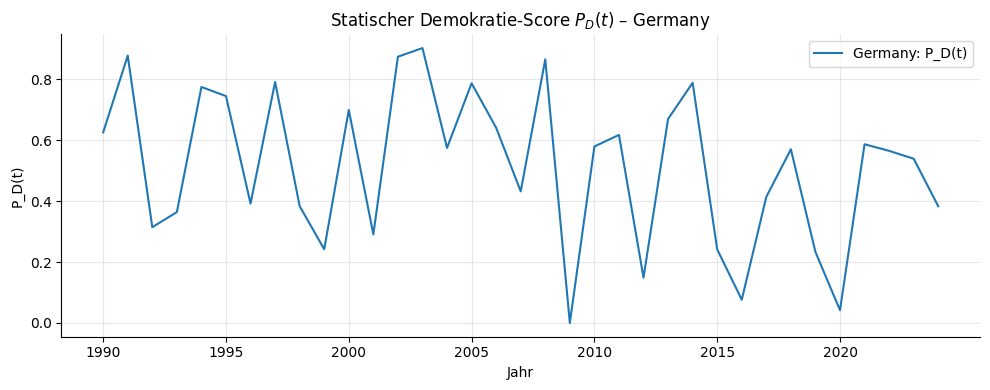

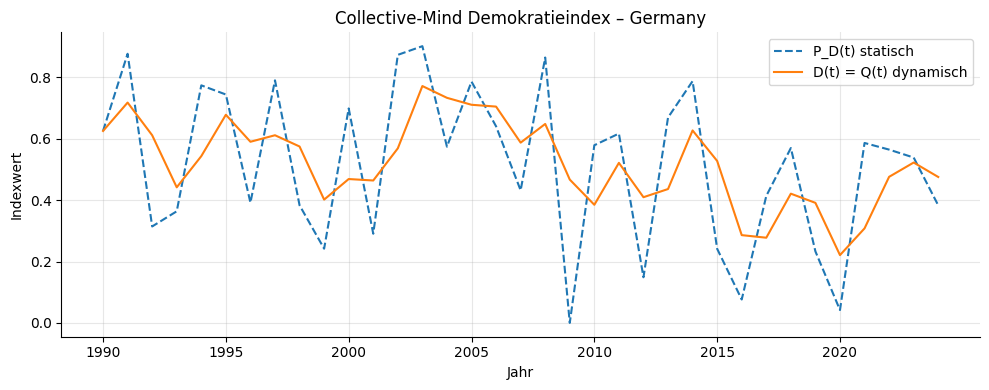

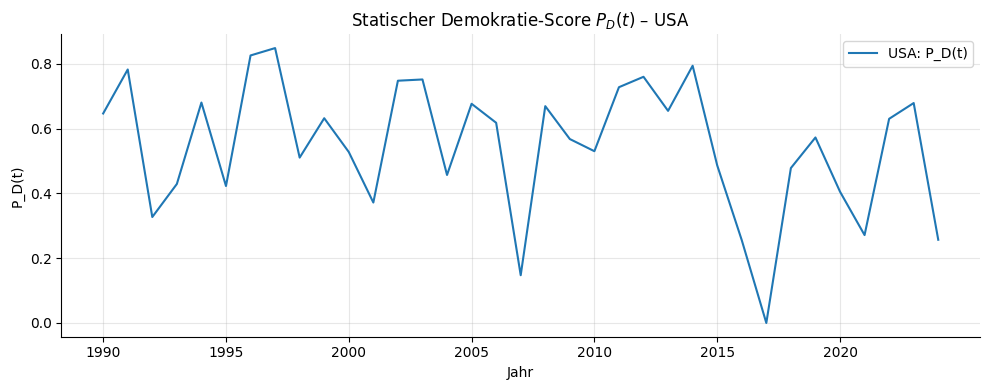

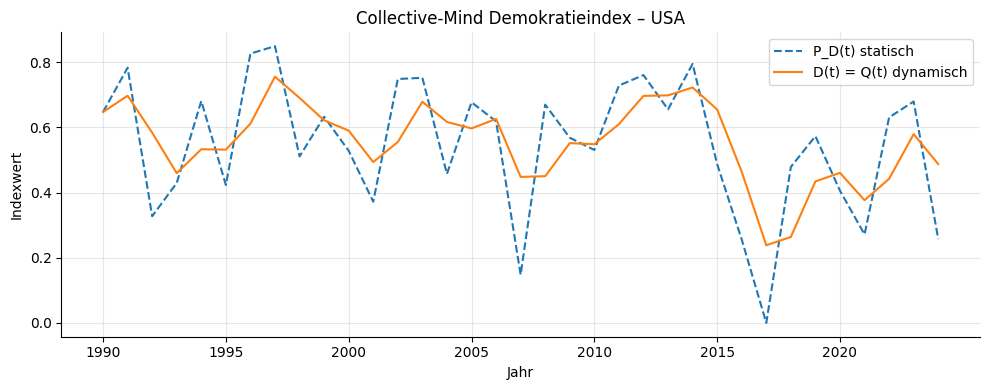

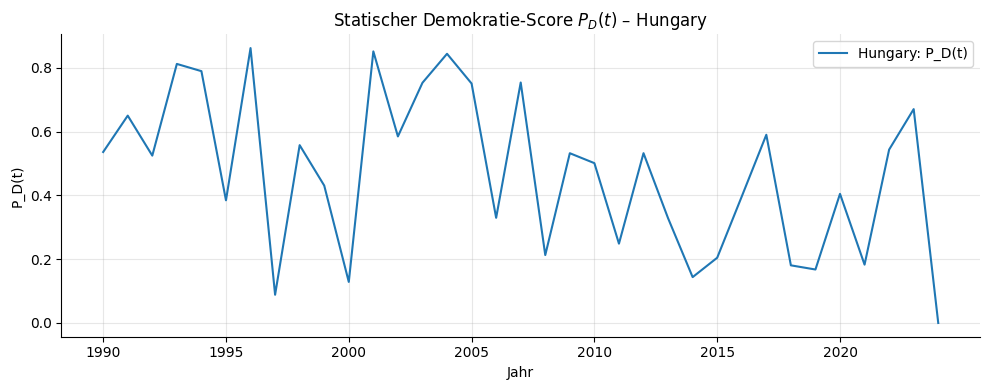

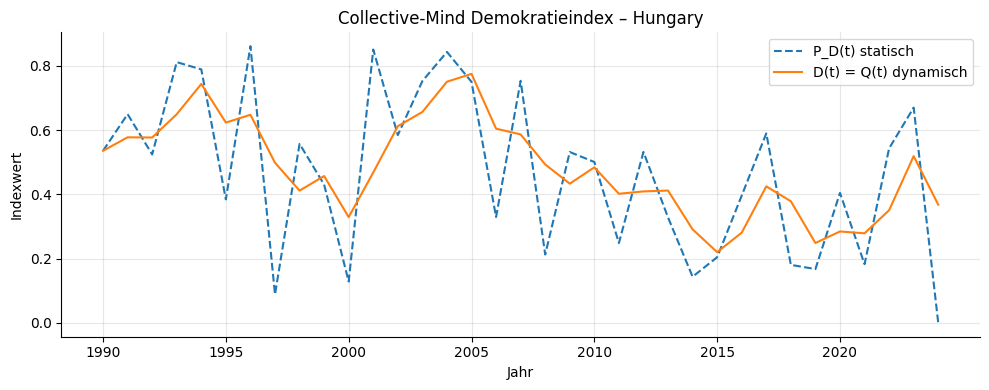

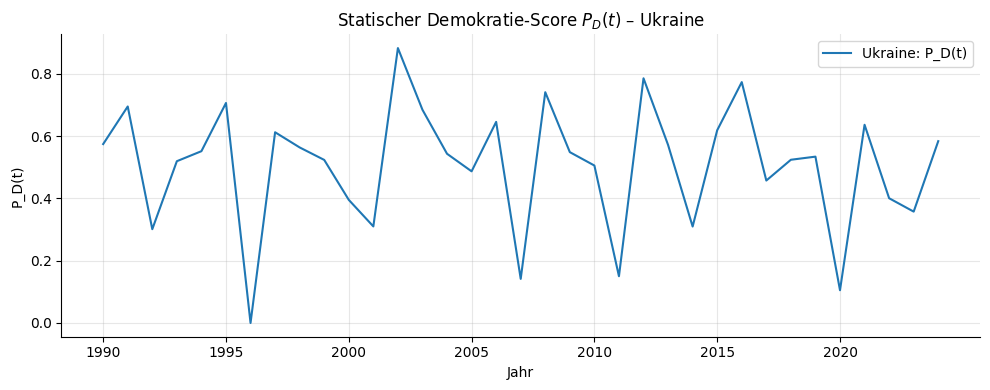

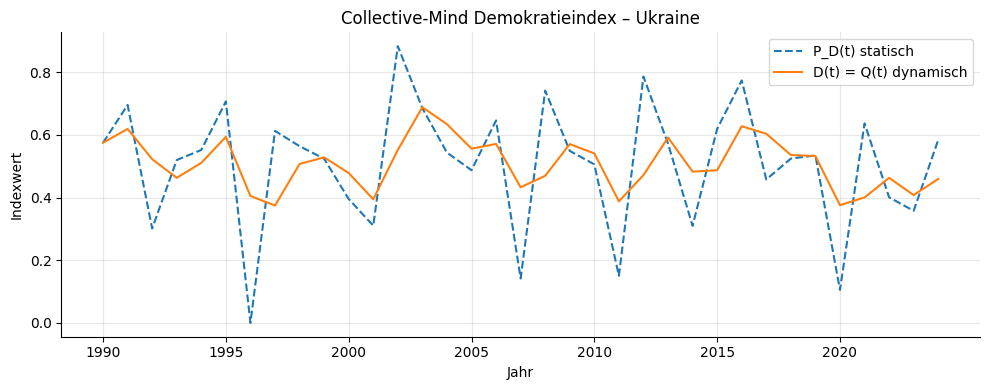

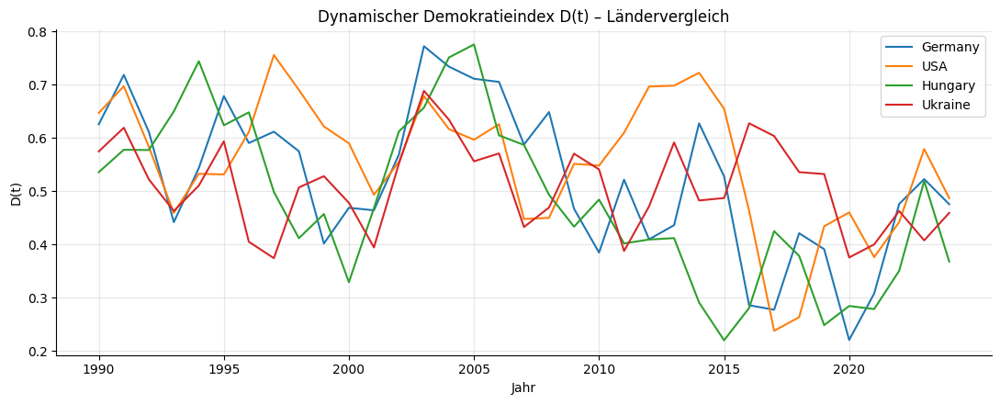

In [17]:
# ============================================================
# ADD-ON: Demokratieindex P_D(t) & D(t) für alle vier Länder
# - Formeln unverändert (wie Original):
#   KH(t) = C_l1(t) * R(t)
#   S(t)  = Feff_raw / max_all (globale Normierung über alle Länder)
#   P_D(t)= KH_norm(t) * V(t) / (1 + S(t))
#   dQ/dt = κ (P_D - Q), D(t)=Q(t), mit κ=1.0
# - NEU: Vielfalt V(t) optional als Dichte-Matrix-Entropie (Option B),
#        wenn psi_paths vorhanden sind:
#        V_rho(t) = -Tr[rho(t) ln rho(t)] / ln(3),
#        rho(t) = Σ_k w_k |psi_k><psi_k|
# - Nutzt: results_qsd_countries (years, R, Cl1, Feff_raw, psi_paths?)
# - Plots pro Land + Sammelplot, x-Achse in 5-Jahres-Schritten
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# ---- Guards ----
if "results_qsd_countries" not in globals() or not results_qsd_countries:
    raise RuntimeError("results_qsd_countries fehlt/leer – bitte vorher das Schrödinger/Mean-Field-Add-on ausführen.")

try:
    countries
except NameError:
    countries = list(results_qsd_countries.keys())

# Gewichte (wie im Projekt genutzt)
AGENT_WEIGHTS = np.asarray(globals().get("AGENT_WEIGHTS", [0.5, 0.3, 0.2]), float)
AGENT_WEIGHTS = AGENT_WEIGHTS / np.sum(AGENT_WEIGHTS)

KAPPA_Q = 1.0
YEAR_TICK_STEP = 5

def _year_ticks(ax, years, step=5):
    yi = years.astype(int)
    # sichere, gleichmäßige Label: alle ~step Jahre
    ticks = np.arange(int(yi[0] - (yi[0] % step)), int(yi[-1]) + 1, step)
    ticks = ticks[(ticks >= yi[0]) & (ticks <= yi[-1])]
    ax.set_xticks(ticks)
    ax.set_xticklabels([str(t) for t in ticks])

def _ode_rhs(t, Q, t_eval, P_D):
    P = np.interp(t, t_eval, P_D)
    return KAPPA_Q * (P - Q)

# ---- Option B: Vielfalt aus Dichte-Matrix-Entropie (wenn Pfade vorhanden) ----
def _variety_density_entropy(psiA, psiB, psiC, weights):
    """V_rho(t) = -Tr[rho ln rho] / ln 3, rho = Σ w_k |psi_k><psi_k|."""
    w = np.asarray(weights, float) / np.sum(weights)
    T = psiA.shape[0]
    V = np.empty(T, float)
    for k in range(T):
        rho = (w[0] * np.outer(psiA[k], psiA[k].conj()) +
               w[1] * np.outer(psiB[k], psiB[k].conj()) +
               w[2] * np.outer(psiC[k], psiC[k].conj()))
        evals = np.clip(np.linalg.eigvalsh(rho).real, 1e-15, 1.0)
        S = -np.sum(evals * np.log(evals))
        V[k] = S / np.log(3.0)
    return np.clip(V, 0.0, 1.0)

def _resample_complex_path(t_src, path_src, t_dst):
    """Falls Pfadgitter ≠ years: linear auf years (re/imag separat) resamplen."""
    t_src = np.asarray(t_src, float)
    t_dst = np.asarray(t_dst, float)
    path_src = np.asarray(path_src, complex)
    out = np.empty((t_dst.size, 3), complex)
    for j in range(3):
        re = np.interp(t_dst, t_src, np.real(path_src[:, j]))
        im = np.interp(t_dst, t_src, np.imag(path_src[:, j]))
        out[:, j] = re + 1j*im
    # Sicherheits-Normierung (sollte ~1 sein)
    nrm = np.linalg.norm(out, axis=1, keepdims=True)
    out = out / (nrm + 1e-15)
    return out

def _try_build_V_from_paths(country_entry):
    """Wenn psi_paths vorhanden: V_rho(t) berechnen (Option B).
       Falls Pfade auf anderem t_eval liegen und 'schrodinger' vorhanden,
       wird auf years resampelt.
       Rückgabe: V ndarray oder None.
    """
    d = country_entry
    years = np.asarray(d["years"], float)

    # direkter Fall: psi_paths auf years
    if "psi_paths" in d and all(k in d["psi_paths"] for k in ("Blau","Orange","Grün")):
        psiA = np.asarray(d["psi_paths"]["Blau"],   complex)
        psiB = np.asarray(d["psi_paths"]["Orange"], complex)
        psiC = np.asarray(d["psi_paths"]["Grün"],   complex)
        if psiA.shape[0] == years.size and psiB.shape[0] == years.size and psiC.shape[0] == years.size:
            return _variety_density_entropy(psiA, psiB, psiC, AGENT_WEIGHTS)

    # Fallback: wenn 'schrodinger' Block existiert, auf years resamplen
    if "schrodinger" in d and all(k in d["schrodinger"] for k in ("t_eval","pathA","pathB","pathC")):
        t_src  = np.asarray(d["schrodinger"]["t_eval"], float)
        pathA  = np.asarray(d["schrodinger"]["pathA"], complex)
        pathB  = np.asarray(d["schrodinger"]["pathB"], complex)
        pathC  = np.asarray(d["schrodinger"]["pathC"], complex)
        psiA_rs = _resample_complex_path(t_src, pathA, years)
        psiB_rs = _resample_complex_path(t_src, pathB, years)
        psiC_rs = _resample_complex_path(t_src, pathC, years)
        # optional: wieder abspeichern, damit später verfügbar
        d.setdefault("psi_paths", {})
        d["psi_paths"]["Blau"]   = psiA_rs
        d["psi_paths"]["Orange"] = psiB_rs
        d["psi_paths"]["Grün"]   = psiC_rs
        return _variety_density_entropy(psiA_rs, psiB_rs, psiC_rs, AGENT_WEIGHTS)

    # sonst kein Pfad verfügbar → None
    return None

# ---- 1) Globale S-Norm (über alle Länder) vorbereiten ----
feff_all = []
for c in countries:
    if c in results_qsd_countries and "Feff_raw" in results_qsd_countries[c]:
        feff_all.append(np.asarray(results_qsd_countries[c]["Feff_raw"], float))
if not feff_all:
    raise RuntimeError("Feff_raw fehlt in results_qsd_countries.")
Feff_max_global = float(np.max(np.concatenate(feff_all)))
if Feff_max_global <= 0:
    Feff_max_global = 1.0

# ---- 2) Rechnen & Plotten pro Land ----
democracy_out = {}

for c in countries:
    d = results_qsd_countries[c]
    years = np.asarray(d["years"], float)
    R     = np.asarray(d["R"], float)
    Cl1   = np.asarray(d["Cl1"], float)
    S_raw = np.asarray(d["Feff_raw"], float)

    # Vielfalt V(t): bevorzugt Option B aus Pfaden; sonst vorhandenes V
    V_density = _try_build_V_from_paths(d)
    if V_density is not None:
        V = V_density
    else:
        if "V" not in d:
            raise RuntimeError(f"{c}: weder psi_paths noch gespeichertes V(t) vorhanden.")
        V = np.asarray(d["V"], float)

    # KH, KH_norm (min-max je Land – wie im Original)
    KH = Cl1 * R
    KH_min, KH_max = float(KH.min()), float(KH.max())
    KH_norm = (KH - KH_min) / (KH_max - KH_min + 1e-12)

    # Spannung global normiert
    V = np.clip(V, 0.0, 1.0)
    S = np.clip(S_raw / Feff_max_global, 0.0, 1.0)

    # P_D(t)
    P_D = KH_norm * V / (1.0 + S)

    # Dynamik D(t)=Q(t)
    Q0 = float(P_D[0])
    sol = solve_ivp(lambda t, Q: _ode_rhs(t, Q, years, P_D),
                    (float(years[0]), float(years[-1])),
                    [Q0], t_eval=years, rtol=1e-8, atol=1e-9, method="RK45")
    Q = sol.y[0]

    democracy_out[c] = dict(years=years, P_D=P_D, D=Q, KH_norm=KH_norm, V=V, S=S)

    # ---- Plots (wie im Original) ----
    # (1) Statischer P_D(t)
    plt.figure(figsize=(10,4))
    plt.plot(years, P_D, label=f"{c}: P_D(t)")
    plt.title(f"Statischer Demokratie-Score $P_D(t)$ – {c}")
    plt.xlabel("Jahr"); plt.ylabel("P_D(t)")
    _year_ticks(plt.gca(), years, YEAR_TICK_STEP)
    plt.grid(True, alpha=0.3); plt.legend(); plt.tight_layout(); plt.show()

    # (2) Dynamischer Index D(t) vs. P_D(t)
    plt.figure(figsize=(10,4))
    plt.plot(years, P_D, "--", label="P_D(t) statisch")
    plt.plot(years, Q,  "-", label="D(t) = Q(t) dynamisch")
    plt.title(f"Collective-Mind Demokratieindex – {c}")
    plt.xlabel("Jahr"); plt.ylabel("Indexwert")
    _year_ticks(plt.gca(), years, YEAR_TICK_STEP)
    plt.grid(True, alpha=0.3); plt.legend(); plt.tight_layout(); plt.show()

# ---- 3) Sammelplot über alle Länder (Dynamik) ----
plt.figure(figsize=(11,4.5))
for c in countries:
    yy = democracy_out[c]["years"]; DD = democracy_out[c]["D"]
    plt.plot(yy, DD, label=c)
plt.title("Dynamischer Demokratieindex D(t) – Ländervergleich")
plt.xlabel("Jahr"); plt.ylabel("D(t)")
_year_ticks(plt.gca(), democracy_out[countries[0]]["years"], YEAR_TICK_STEP)
plt.grid(True, alpha=0.3); plt.legend(); plt.tight_layout(); plt.show()


/tmp/ipython-input-294580743.py:227: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


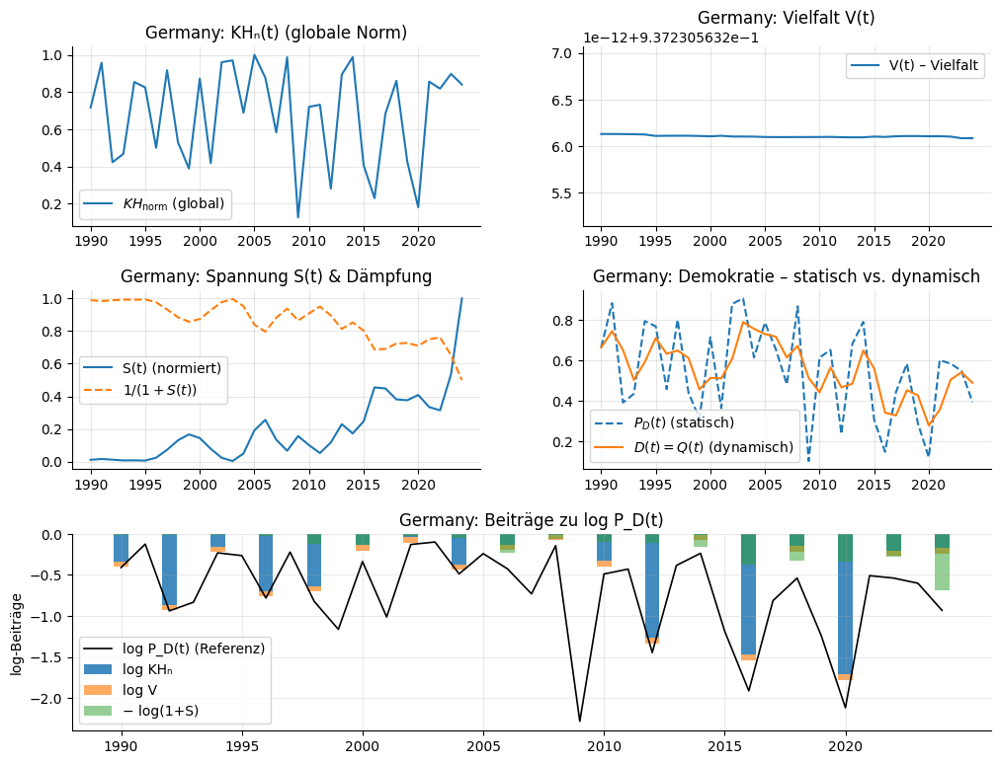

/tmp/ipython-input-294580743.py:227: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


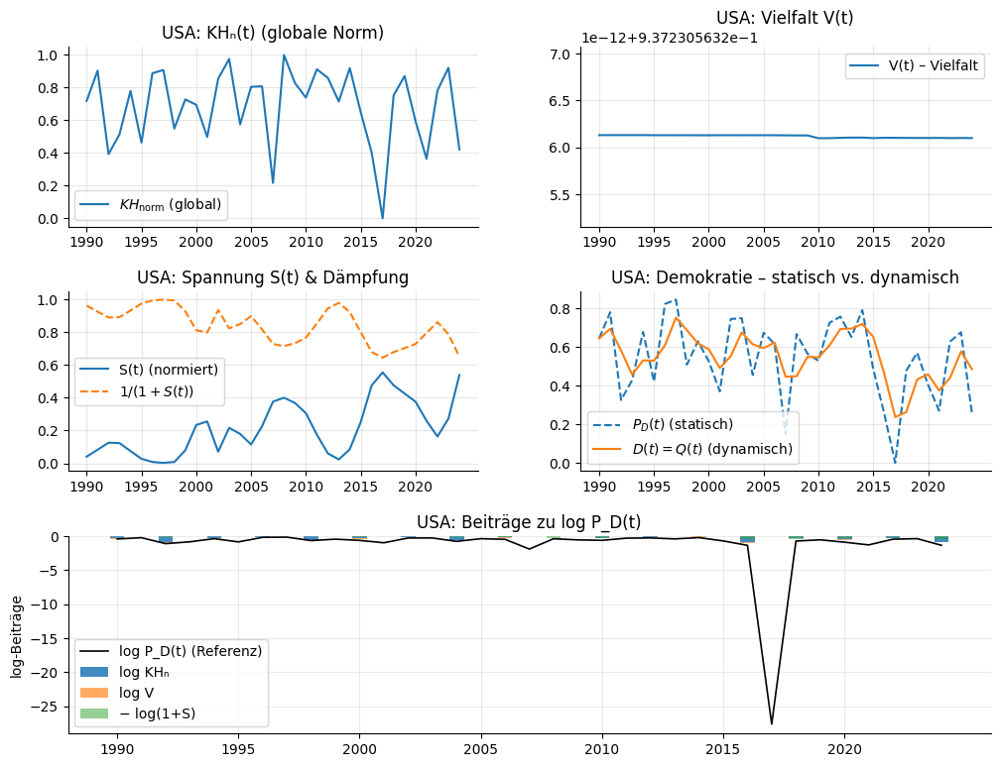

/tmp/ipython-input-294580743.py:227: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


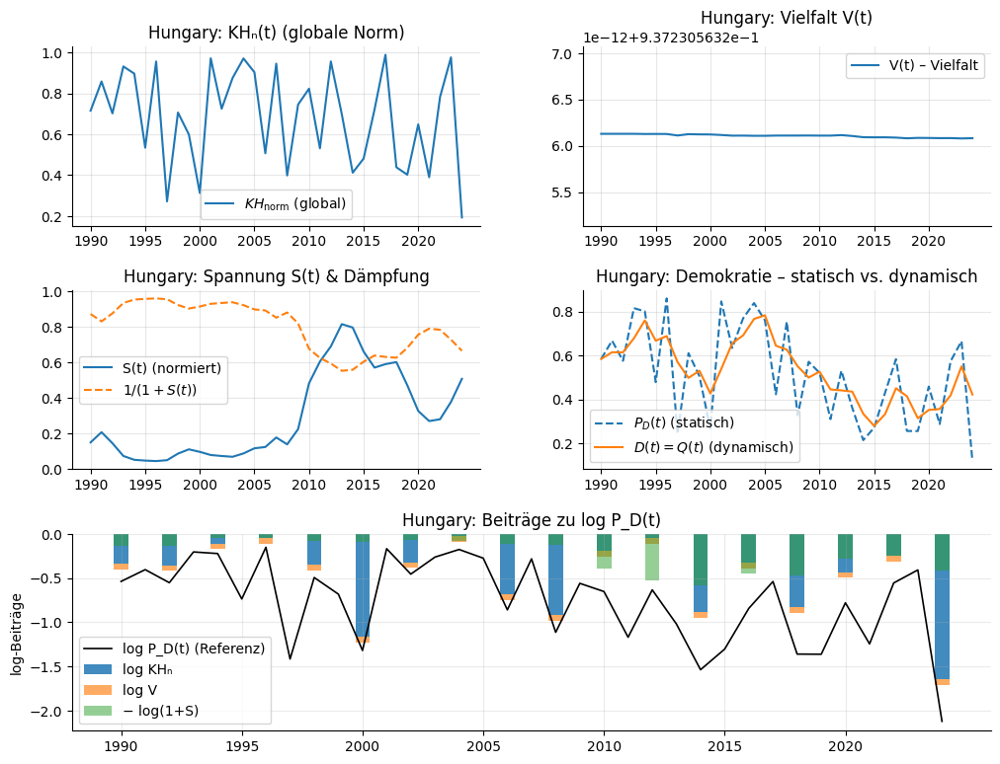

/tmp/ipython-input-294580743.py:227: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


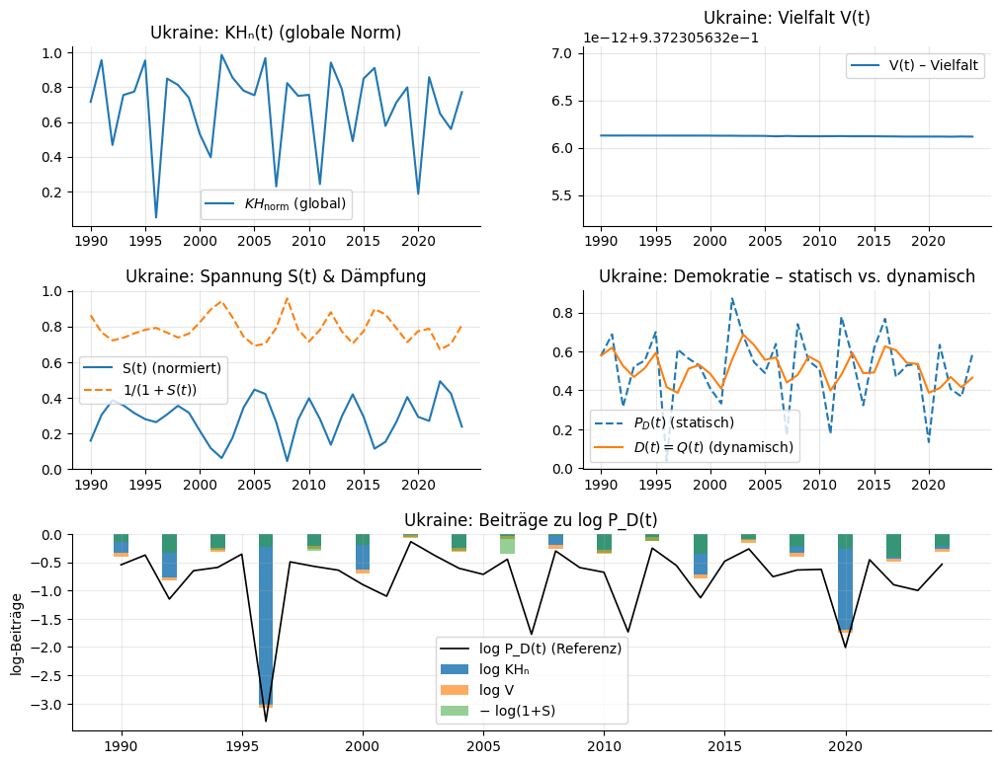

In [18]:
# ============================================================
# ADD-ON: Decompose-Plots für Demokratieindex (ohne Formeländerung)
# Nutzt results_qsd_countries (R, Cl1, V, Feff_raw, years)
# NEU: Vielfalt-Option B (Dichte-Matrix-Entropie) falls psi_paths vorhanden.
# Zeigt je Land: KH_n (global), V, S & 1/(1+S), P_D, D sowie log-Beitragsbalken
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# ---- Erwartungen prüfen
if "results_qsd_countries" not in globals() or not results_qsd_countries:
    raise RuntimeError("results_qsd_countries fehlt/leer. Bitte erst QSD + Sanity-Harness laufen lassen.")

# Länder-Liste
try:
    countries
except NameError:
    countries = list(results_qsd_countries.keys())

# Agenten-Gewichte (für Option B)
AGENT_WEIGHTS = np.asarray(globals().get("AGENT_WEIGHTS", [0.5, 0.3, 0.2]), float)
AGENT_WEIGHTS = AGENT_WEIGHTS / np.sum(AGENT_WEIGHTS)

# ODE-Parameter (Formel unverändert)
KAPPA_Q = float(globals().get("KAPPA_Q", 1.0))

# ---------- Helfer ----------
def _year_ticks(ax, years, every=5):
    yi = years.astype(int)
    ticks = np.arange(int(yi[0] - (yi[0] % every)), int(yi[-1]) + 1, every)
    ticks = ticks[(ticks >= yi[0]) & (ticks <= yi[-1])]
    ax.set_xticks(ticks)
    ax.set_xticklabels([str(y) for y in ticks])
    ax.tick_params(axis='x', labelrotation=0)

def _solve_Q(years, P_D, kappa=1.0):
    """dQ/dt = κ (P_D - Q), Q(t0) = P_D(t0)"""
    t = np.asarray(years, float)
    P = np.asarray(P_D, float)
    Q0 = float(P[0])

    def rhs(t_, Q_):
        P_t = np.interp(t_, t, P)
        return kappa * (P_t - Q_[0])

    sol = solve_ivp(rhs, (t[0], t[-1]), [Q0], t_eval=t, rtol=1e-8, atol=1e-9)
    return sol.y[0]

# ---- Option B: Vielfalt aus Dichte-Matrix-Entropie (wenn Pfade vorhanden) ----
def _variety_density_entropy(psiA, psiB, psiC, weights):
    """V_rho(t) = -Tr[rho ln rho] / ln 3, rho = Σ w_k |psi_k><psi_k|."""
    w = np.asarray(weights, float) / np.sum(weights)
    T = psiA.shape[0]
    V = np.empty(T, float)
    for k in range(T):
        rho = (w[0] * np.outer(psiA[k], psiA[k].conj())
             + w[1] * np.outer(psiB[k], psiB[k].conj())
             + w[2] * np.outer(psiC[k], psiC[k].conj()))
        evals = np.clip(np.linalg.eigvalsh(rho).real, 1e-15, 1.0)
        S = -np.sum(evals * np.log(evals))
        V[k] = S / np.log(3.0)
    return np.clip(V, 0.0, 1.0)

def _resample_complex_path(t_src, path_src, t_dst):
    """Pfad (T_src,3) complex von t_src -> t_dst linear (re/imag getrennt) resamplen."""
    t_src = np.asarray(t_src, float)
    t_dst = np.asarray(t_dst, float)
    path_src = np.asarray(path_src, complex)
    out = np.empty((t_dst.size, 3), complex)
    for j in range(3):
        re = np.interp(t_dst, t_src, np.real(path_src[:, j]))
        im = np.interp(t_dst, t_src, np.imag(path_src[:, j]))
        out[:, j] = re + 1j*im
    nrm = np.linalg.norm(out, axis=1, keepdims=True)
    return out / (nrm + 1e-15)

def _V_optionB_or_fallback(country_entry):
    """Erzeuge V(t) via Option B (rho-Entropie), falls Pfade vorhanden; sonst d['V']."""
    d = country_entry
    years = np.asarray(d["years"], float)

    # Direkter Fall: psi_paths liegen bereits auf years
    if "psi_paths" in d and all(k in d["psi_paths"] for k in ("Blau","Orange","Grün")):
        psiA = np.asarray(d["psi_paths"]["Blau"],   complex)
        psiB = np.asarray(d["psi_paths"]["Orange"], complex)
        psiC = np.asarray(d["psi_paths"]["Grün"],   complex)
        if psiA.shape[0] == years.size and psiB.shape[0] == years.size and psiC.shape[0] == years.size:
            return _variety_density_entropy(psiA, psiB, psiC, AGENT_WEIGHTS)

    # Fallback: Falls schrodinger-Block existiert, Pfade auf years resamplen
    if "schrodinger" in d and all(k in d["schrodinger"] for k in ("t_eval","pathA","pathB","pathC")):
        t_src  = np.asarray(d["schrodinger"]["t_eval"], float)
        pathA  = np.asarray(d["schrodinger"]["pathA"], complex)
        pathB  = np.asarray(d["schrodinger"]["pathB"], complex)
        pathC  = np.asarray(d["schrodinger"]["pathC"], complex)
        psiA_rs = _resample_complex_path(t_src, pathA, years)
        psiB_rs = _resample_complex_path(t_src, pathB, years)
        psiC_rs = _resample_complex_path(t_src, pathC, years)
        # optional: abspeichern
        d.setdefault("psi_paths", {})
        d["psi_paths"]["Blau"]   = psiA_rs
        d["psi_paths"]["Orange"] = psiB_rs
        d["psi_paths"]["Grün"]   = psiC_rs
        return _variety_density_entropy(psiA_rs, psiB_rs, psiC_rs, AGENT_WEIGHTS)

    # Kein Pfad vorhanden -> vorhandenes V verwenden
    if "V" not in d:
        raise RuntimeError("Weder psi_paths noch gespeichertes V(t) vorhanden.")
    return np.asarray(d["V"], float)

# ---------- Globale KH-Norm bestimmen (aus allen Ländern) ----------
KH_all = []
for c in countries:
    d = results_qsd_countries.get(c, {})
    if not all(k in d for k in ("years","R","Cl1")):
        continue
    KH_all.append(np.asarray(d["R"], float) * np.asarray(d["Cl1"], float))

if not KH_all:
    raise RuntimeError("Keine KH-Quellen gefunden (R*Cl1). Fehlen R/Cl1 in results_qsd_countries?")

KH_concat = np.concatenate(KH_all)
KH_min_glob = np.min(KH_concat)
KH_max_glob = np.max(KH_concat)
denom = KH_max_glob - KH_min_glob if KH_max_glob > KH_min_glob else 1.0

def KH_norm_global(KH):
    return (KH - KH_min_glob) / denom

# ---------- Globales S-Max (über alle Länder) ----------
if "_GLOBAL_SMAX_" not in globals():
    all_S = []
    for x in results_qsd_countries:
        if "Feff_raw" in results_qsd_countries[x]:
            all_S.append(np.asarray(results_qsd_countries[x]["Feff_raw"], float))
    if not all_S:
        raise RuntimeError("Feff_raw fehlt global – kann _GLOBAL_SMAX_ nicht bestimmen.")
    _GLOBAL_SMAX_ = float(np.max(np.concatenate(all_S)))
    if _GLOBAL_SMAX_ <= 0:
        _GLOBAL_SMAX_ = 1.0

# ---------- Pro Land: Decompose-Plot ----------
EPS = 1e-12

for c in countries:
    d = results_qsd_countries.get(c, {})
    if not all(k in d for k in ("years","R","Cl1","Feff_raw")):
        print(f"⚠️ {c}: fehlende Größen (benötigt: years, R, Cl1, Feff_raw) – übersprungen.")
        continue

    years = np.asarray(d["years"], float)
    R     = np.asarray(d["R"], float)
    Cl1   = np.asarray(d["Cl1"], float)
    # Vielfalt: Option B (falls möglich), sonst vorhandenes V
    V     = np.clip(_V_optionB_or_fallback(d), 0.0, 1.0)
    S_raw = np.asarray(d["Feff_raw"], float)

    # Spannung global normieren
    S = np.clip(S_raw / _GLOBAL_SMAX_, 0.0, 1.0)

    # KH & KH_norm (global)
    KH    = R * Cl1
    KH_n  = KH_norm_global(KH)

    # P_D & D
    P_D = (KH_n * V) / (1.0 + S)
    D   = _solve_Q(years, P_D, kappa=KAPPA_Q)

    # --- Figurenlayout ---
    fig = plt.figure(figsize=(12, 9))
    gs = fig.add_gridspec(3, 2, height_ratios=[1,1,1.1], hspace=0.35, wspace=0.25)

    ax1 = fig.add_subplot(gs[0, 0])  # KH_n
    ax2 = fig.add_subplot(gs[0, 1])  # V
    ax3 = fig.add_subplot(gs[1, 0])  # S & 1/(1+S)
    ax4 = fig.add_subplot(gs[1, 1])  # P_D & D
    ax5 = fig.add_subplot(gs[2, :])  # log-Beiträge (Barchart)

    # 1) KH_n (global)
    ax1.plot(years, KH_n, label=r"$KH_{\mathrm{norm}}$ (global)")
    ax1.set_title(f"{c}: KHₙ(t) (globale Norm)"); ax1.grid(True, alpha=.3); ax1.legend()
    _year_ticks(ax1, years, every=5)

    # 2) Vielfalt V
    ax2.plot(years, V, label="V(t) – Vielfalt")
    ax2.set_title(f"{c}: Vielfalt V(t)"); ax2.grid(True, alpha=.3); ax2.legend()
    _year_ticks(ax2, years, every=5)

    # 3) Spannung
    ax3.plot(years, S, label="S(t) (normiert)")
    ax3.plot(years, 1.0/(1.0+S+EPS), linestyle="--", label=r"$1/(1+S(t))$")
    ax3.set_title(f"{c}: Spannung S(t) & Dämpfung"); ax3.grid(True, alpha=.3); ax3.legend()
    _year_ticks(ax3, years, every=5)

    # 4) P_D & D
    ax4.plot(years, P_D, "--", label=r"$P_D(t)$ (statisch)")
    ax4.plot(years, D,  "-", label=r"$D(t)=Q(t)$ (dynamisch)")
    ax4.set_title(f"{c}: Demokratie – statisch vs. dynamisch"); ax4.grid(True, alpha=.3); ax4.legend()
    _year_ticks(ax4, years, every=5)

    # 5) Log-Beiträge als Balken: log P_D = log KH_n + log V − log(1+S)
    step = 2 if years.size <= 40 else 3
    y_sel = years[::step]
    KHc   = np.maximum(KH_n[::step], EPS)
    Vc    = np.maximum(V[::step],    EPS)
    Sc    = np.maximum(S[::step],    0.0)
    comp1 = np.log(KHc)
    comp2 = np.log(Vc)
    comp3 = -np.log(1.0 + Sc)

    width = 0.6
    ax5.bar(y_sel, comp1, width=width, label="log KHₙ", alpha=0.85)
    ax5.bar(y_sel, comp2, bottom=comp1, width=width, label="log V", alpha=0.65)
    ax5.bar(y_sel, comp3, width=width, label="− log(1+S)", alpha=0.5)

    log_PD = np.log(np.maximum(P_D, EPS))
    ax5.plot(years, log_PD, color="k", linewidth=1.2, label="log P_D(t) (Referenz)")

    ax5.set_title(f"{c}: Beiträge zu log P_D(t)")
    ax5.set_ylabel("log-Beiträge")
    ax5.grid(True, alpha=.25)
    ax5.legend(loc="best")
    _year_ticks(ax5, years, every=5)

    plt.tight_layout()
    plt.show()


In [19]:
import numpy as np

assert "A_STORE" in globals(), "Bitte zuerst das A1/A0-Add-on ausführen (A_STORE)."
assert "results_qsd_countries" in globals(), "Bitte QSD+Mean-Field Add-on laufen lassen (results_qsd_countries)."

def _resample_complex_path(t_src, path_src, t_dst):
    t_src = np.asarray(t_src, float); t_dst = np.asarray(t_dst, float)
    P = np.asarray(path_src, complex)
    out = np.empty((t_dst.size, 3), complex)
    for k in range(3):
        out[:,k] = np.interp(t_dst, t_src, np.real(P[:,k])) + 1j*np.interp(t_dst, t_src, np.imag(P[:,k]))
    # Sicherheitsnormierung
    out /= (np.linalg.norm(out, axis=1, keepdims=True) + 1e-15)
    return out

countries_run = list(results_qsd_countries.keys())
for c in countries_run:
    d = results_qsd_countries[c]
    years = np.asarray(d.get("years", A_STORE[c]["years"]), float)
    # Quelle 1: schon gespeicherte Schrödinger-Ergebnisse
    sch = d.get("schrodinger", None)
    if sch and all(k in sch for k in ("t_eval","pathA","pathB","pathC")):
        t_src = np.asarray(sch["t_eval"], float)
        A = _resample_complex_path(t_src, np.asarray(sch["pathA"], complex), years)
        B = _resample_complex_path(t_src, np.asarray(sch["pathB"], complex), years)
        G = _resample_complex_path(t_src, np.asarray(sch["pathC"], complex), years)
        d["psi_paths"] = {"Blau":A, "Orange":B, "Grün":G}
        d["years"] = years
        results_qsd_countries[c] = d
        print(f"✅ {c}: psi_paths aus schrodinger → auf years resampled ({A.shape}).")
    elif "psi_paths" in d and all(k in d["psi_paths"] for k in ("Blau","Orange","Grün")):
        # schon vorhanden → nur Achsenlänge prüfen
        P = d["psi_paths"]["Blau"]
        print(f"ℹ️ {c}: psi_paths bereits vorhanden ({np.asarray(P).shape}).")
    else:
        print(f"⚠️ {c}: Keine Pfadquelle gefunden – bitte das Schrödinger-Add-on vorher ausführen.")


✅ Germany: psi_paths aus schrodinger → auf years resampled ((35, 3)).
✅ USA: psi_paths aus schrodinger → auf years resampled ((35, 3)).
✅ Hungary: psi_paths aus schrodinger → auf years resampled ((35, 3)).
✅ Ukraine: psi_paths aus schrodinger → auf years resampled ((35, 3)).


In [20]:
AGENT_WEIGHTS = np.asarray(globals().get("AGENT_WEIGHTS", [0.5,0.3,0.2]), float)

def _V_from_paths(psiA, psiB, psiC, weights):
    w = weights/np.sum(weights)
    T = psiA.shape[0]
    V = np.empty(T)
    for i in range(T):
        a,b,c = psiA[i][:,None], psiB[i][:,None], psiC[i][:,None]  # (3,1)
        rho = (w[0]*(a@a.conj().T) + w[1]*(b@b.conj().T) + w[2]*(c@c.conj().T)).astype(complex)
        lam = np.clip(np.real(np.linalg.eigvalsh(rho)), 1e-15, 1.0)  # stabil
        H = -np.sum(lam*np.log(lam))
        V[i] = H/np.log(3.0)
    return np.clip(V, 0.0, 1.0)

def _overlap_max(psiA, psiB, psiC):
    # max_t max_{i≠j} |<ψ_i|ψ_j>|
    Ps = [psiA, psiB, psiC]
    mx = 0.0
    for i in range(3):
        for j in range(i+1,3):
            ov = np.max(np.abs(np.sum(np.conj(Ps[i])*Ps[j], axis=1)))
            mx = max(mx, float(ov))
    return mx

for c, d in results_qsd_countries.items():
    if "psi_paths" not in d or not all(k in d["psi_paths"] for k in ("Blau","Orange","Grün")):
        print(f"⚠️ {c}: keine psi_paths – Option B nicht möglich (V bleibt unverändert).")
        continue
    A = np.asarray(d["psi_paths"]["Blau"],   complex)
    B = np.asarray(d["psi_paths"]["Orange"], complex)
    G = np.asarray(d["psi_paths"]["Grün"],   complex)
    V_B = _V_from_paths(A,B,G, AGENT_WEIGHTS)
    d["V"] = V_B
    d["V_source"] = "OptionB:rho(psi_paths)"
    d["overlap_max"] = _overlap_max(A,B,G)
    results_qsd_countries[c] = d
    print(f"✅ {c}: V(t) aus rho gesetzt (Option B). max|<ψ_i|ψ_j>| = {d['overlap_max']:.3e}")


✅ Germany: V(t) aus rho gesetzt (Option B). max|<ψ_i|ψ_j>| = 3.576e-07
✅ USA: V(t) aus rho gesetzt (Option B). max|<ψ_i|ψ_j>| = 3.675e-07
✅ Hungary: V(t) aus rho gesetzt (Option B). max|<ψ_i|ψ_j>| = 2.927e-07
✅ Ukraine: V(t) aus rho gesetzt (Option B). max|<ψ_i|ψ_j>| = 1.571e-07


In [21]:
for c in results_qsd_countries:
    src = results_qsd_countries[c].get("V_source","(unbekannt)")
    vmean = float(np.mean(results_qsd_countries[c]["V"]))
    print(f"{c}: V_source = {src} | mean(V) = {vmean:.3f}")


Germany: V_source = OptionB:rho(psi_paths) | mean(V) = 0.937
USA: V_source = OptionB:rho(psi_paths) | mean(V) = 0.937
Hungary: V_source = OptionB:rho(psi_paths) | mean(V) = 0.937
Ukraine: V_source = OptionB:rho(psi_paths) | mean(V) = 0.937


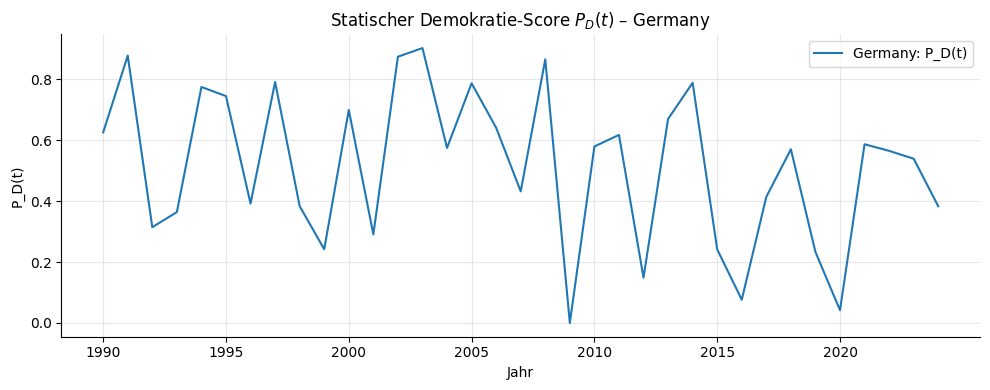

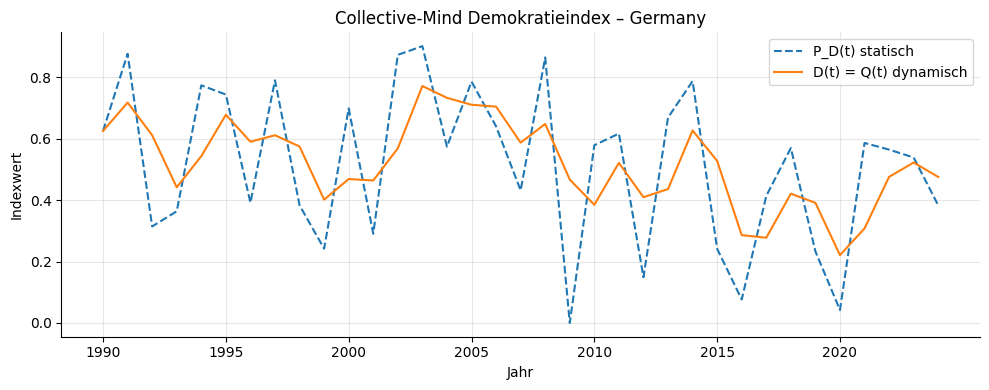

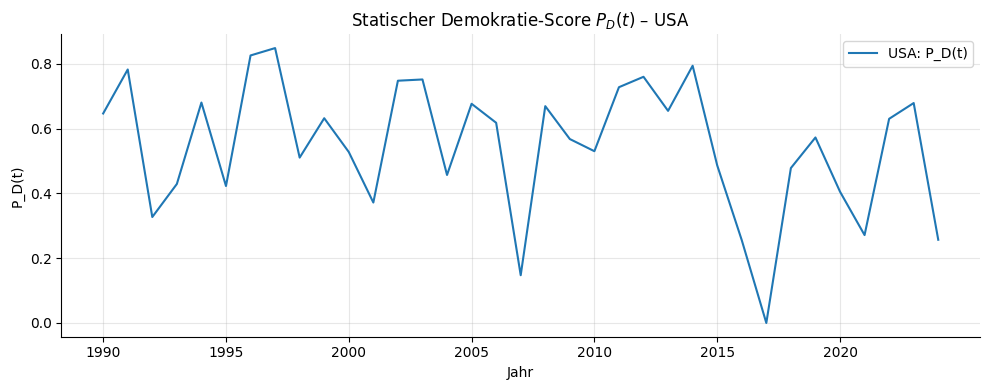

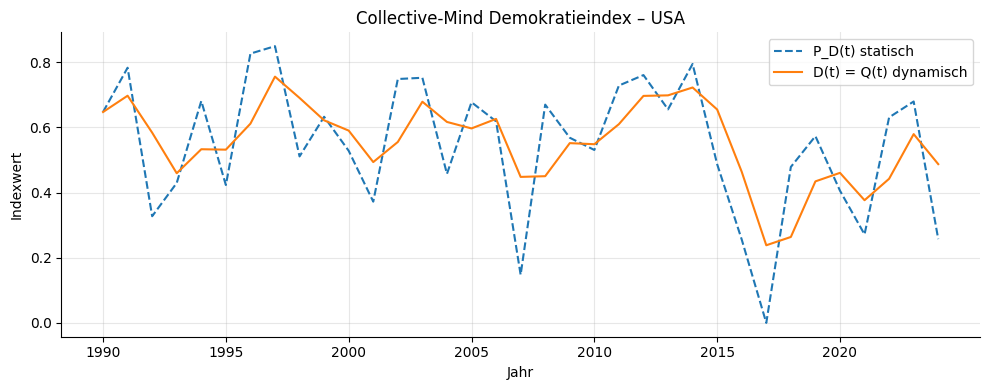

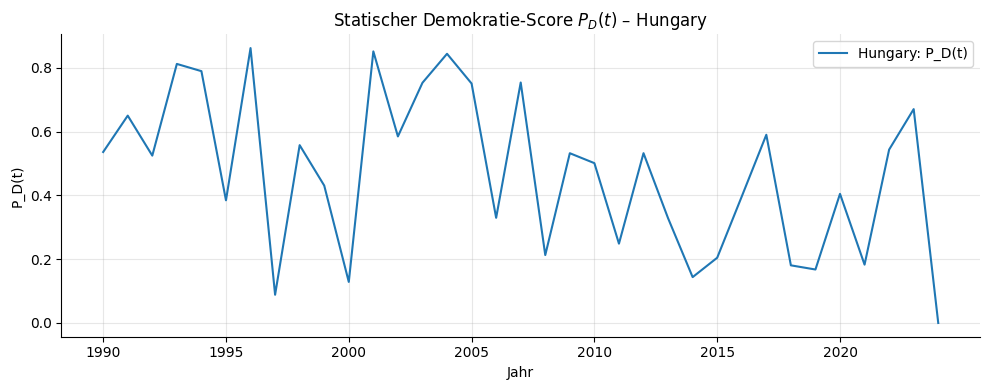

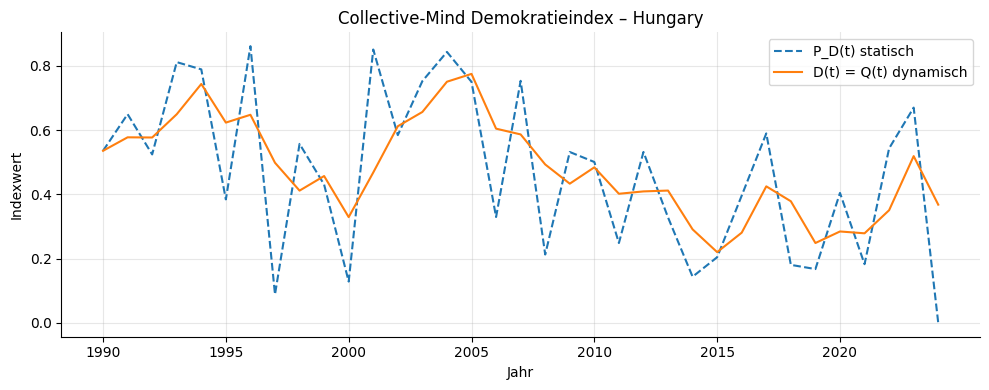

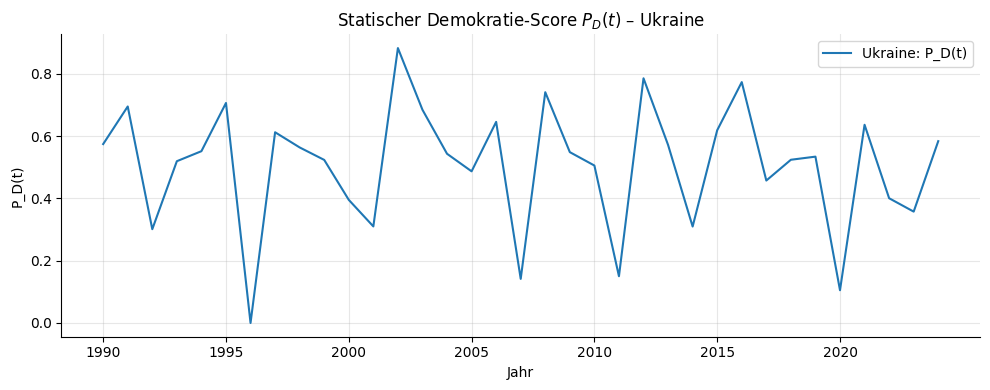

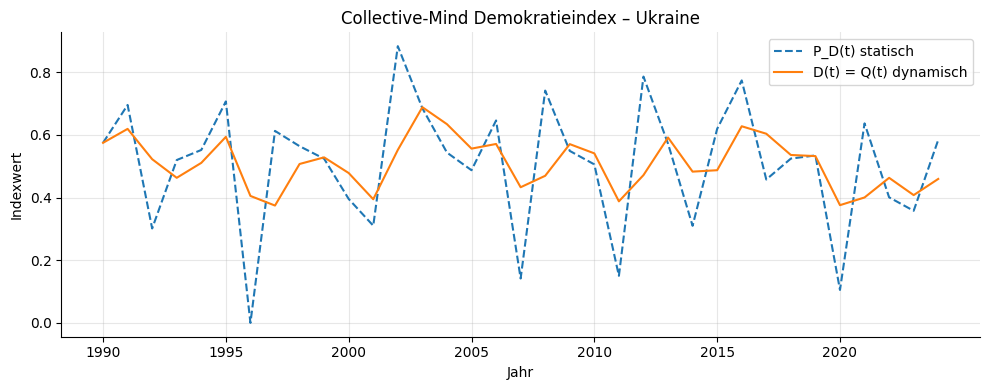

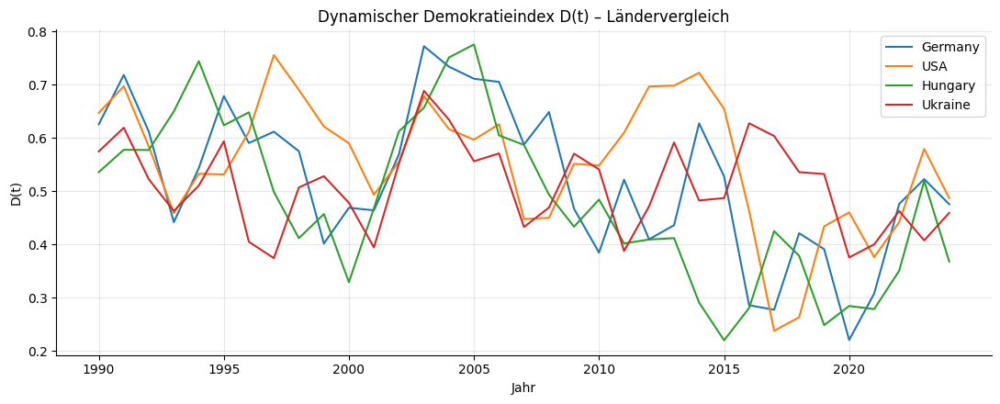

In [22]:
# ============================================================
# ADD-ON: Demokratieindex P_D(t) & D(t) für alle vier Länder
# - Formeln unverändert (wie Original):
#   KH(t) = C_l1(t) * R(t)
#   S(t)  = Feff_raw / max_all (globale Normierung über alle Länder)
#   P_D(t)= KH_norm(t) * V(t) / (1 + S(t))
#   dQ/dt = κ (P_D - Q), D(t)=Q(t), mit κ=1.0
# - NEU: Vielfalt V(t) optional als Dichte-Matrix-Entropie (Option B),
#        wenn psi_paths vorhanden sind:
#        V_rho(t) = -Tr[rho(t) ln rho(t)] / ln(3),
#        rho(t) = Σ_k w_k |psi_k><psi_k|
# - Nutzt: results_qsd_countries (years, R, Cl1, Feff_raw, psi_paths?)
# - Plots pro Land + Sammelplot, x-Achse in 5-Jahres-Schritten
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# ---- Guards ----
if "results_qsd_countries" not in globals() or not results_qsd_countries:
    raise RuntimeError("results_qsd_countries fehlt/leer – bitte vorher das Schrödinger/Mean-Field-Add-on ausführen.")

try:
    countries
except NameError:
    countries = list(results_qsd_countries.keys())

# Gewichte (wie im Projekt genutzt)
AGENT_WEIGHTS = np.asarray(globals().get("AGENT_WEIGHTS", [0.5, 0.3, 0.2]), float)
AGENT_WEIGHTS = AGENT_WEIGHTS / np.sum(AGENT_WEIGHTS)

KAPPA_Q = 1.0
YEAR_TICK_STEP = 5

def _year_ticks(ax, years, step=5):
    yi = years.astype(int)
    # sichere, gleichmäßige Label: alle ~step Jahre
    ticks = np.arange(int(yi[0] - (yi[0] % step)), int(yi[-1]) + 1, step)
    ticks = ticks[(ticks >= yi[0]) & (ticks <= yi[-1])]
    ax.set_xticks(ticks)
    ax.set_xticklabels([str(t) for t in ticks])

def _ode_rhs(t, Q, t_eval, P_D):
    P = np.interp(t, t_eval, P_D)
    return KAPPA_Q * (P - Q)

# ---- Option B: Vielfalt aus Dichte-Matrix-Entropie (wenn Pfade vorhanden) ----
def _variety_density_entropy(psiA, psiB, psiC, weights):
    """V_rho(t) = -Tr[rho ln rho] / ln 3, rho = Σ w_k |psi_k><psi_k|."""
    w = np.asarray(weights, float) / np.sum(weights)
    T = psiA.shape[0]
    V = np.empty(T, float)
    for k in range(T):
        rho = (w[0] * np.outer(psiA[k], psiA[k].conj()) +
               w[1] * np.outer(psiB[k], psiB[k].conj()) +
               w[2] * np.outer(psiC[k], psiC[k].conj()))
        evals = np.clip(np.linalg.eigvalsh(rho).real, 1e-15, 1.0)
        S = -np.sum(evals * np.log(evals))
        V[k] = S / np.log(3.0)
    return np.clip(V, 0.0, 1.0)

def _resample_complex_path(t_src, path_src, t_dst):
    """Falls Pfadgitter ≠ years: linear auf years (re/imag separat) resamplen."""
    t_src = np.asarray(t_src, float)
    t_dst = np.asarray(t_dst, float)
    path_src = np.asarray(path_src, complex)
    out = np.empty((t_dst.size, 3), complex)
    for j in range(3):
        re = np.interp(t_dst, t_src, np.real(path_src[:, j]))
        im = np.interp(t_dst, t_src, np.imag(path_src[:, j]))
        out[:, j] = re + 1j*im
    # Sicherheits-Normierung (sollte ~1 sein)
    nrm = np.linalg.norm(out, axis=1, keepdims=True)
    out = out / (nrm + 1e-15)
    return out

def _try_build_V_from_paths(country_entry):
    """Wenn psi_paths vorhanden: V_rho(t) berechnen (Option B).
       Falls Pfade auf anderem t_eval liegen und 'schrodinger' vorhanden,
       wird auf years resampelt.
       Rückgabe: V ndarray oder None.
    """
    d = country_entry
    years = np.asarray(d["years"], float)

    # direkter Fall: psi_paths auf years
    if "psi_paths" in d and all(k in d["psi_paths"] for k in ("Blau","Orange","Grün")):
        psiA = np.asarray(d["psi_paths"]["Blau"],   complex)
        psiB = np.asarray(d["psi_paths"]["Orange"], complex)
        psiC = np.asarray(d["psi_paths"]["Grün"],   complex)
        if psiA.shape[0] == years.size and psiB.shape[0] == years.size and psiC.shape[0] == years.size:
            return _variety_density_entropy(psiA, psiB, psiC, AGENT_WEIGHTS)

    # Fallback: wenn 'schrodinger' Block existiert, auf years resamplen
    if "schrodinger" in d and all(k in d["schrodinger"] for k in ("t_eval","pathA","pathB","pathC")):
        t_src  = np.asarray(d["schrodinger"]["t_eval"], float)
        pathA  = np.asarray(d["schrodinger"]["pathA"], complex)
        pathB  = np.asarray(d["schrodinger"]["pathB"], complex)
        pathC  = np.asarray(d["schrodinger"]["pathC"], complex)
        psiA_rs = _resample_complex_path(t_src, pathA, years)
        psiB_rs = _resample_complex_path(t_src, pathB, years)
        psiC_rs = _resample_complex_path(t_src, pathC, years)
        # optional: wieder abspeichern, damit später verfügbar
        d.setdefault("psi_paths", {})
        d["psi_paths"]["Blau"]   = psiA_rs
        d["psi_paths"]["Orange"] = psiB_rs
        d["psi_paths"]["Grün"]   = psiC_rs
        return _variety_density_entropy(psiA_rs, psiB_rs, psiC_rs, AGENT_WEIGHTS)

    # sonst kein Pfad verfügbar → None
    return None

# ---- 1) Globale S-Norm (über alle Länder) vorbereiten ----
feff_all = []
for c in countries:
    if c in results_qsd_countries and "Feff_raw" in results_qsd_countries[c]:
        feff_all.append(np.asarray(results_qsd_countries[c]["Feff_raw"], float))
if not feff_all:
    raise RuntimeError("Feff_raw fehlt in results_qsd_countries.")
Feff_max_global = float(np.max(np.concatenate(feff_all)))
if Feff_max_global <= 0:
    Feff_max_global = 1.0

# ---- 2) Rechnen & Plotten pro Land ----
democracy_out = {}

for c in countries:
    d = results_qsd_countries[c]
    years = np.asarray(d["years"], float)
    R     = np.asarray(d["R"], float)
    Cl1   = np.asarray(d["Cl1"], float)
    S_raw = np.asarray(d["Feff_raw"], float)

    # Vielfalt V(t): bevorzugt Option B aus Pfaden; sonst vorhandenes V
    V_density = _try_build_V_from_paths(d)
    if V_density is not None:
        V = V_density
    else:
        if "V" not in d:
            raise RuntimeError(f"{c}: weder psi_paths noch gespeichertes V(t) vorhanden.")
        V = np.asarray(d["V"], float)

    # KH, KH_norm (min-max je Land – wie im Original)
    KH = Cl1 * R
    KH_min, KH_max = float(KH.min()), float(KH.max())
    KH_norm = (KH - KH_min) / (KH_max - KH_min + 1e-12)

    # Spannung global normiert
    V = np.clip(V, 0.0, 1.0)
    S = np.clip(S_raw / Feff_max_global, 0.0, 1.0)

    # P_D(t)
    P_D = KH_norm * V / (1.0 + S)

    # Dynamik D(t)=Q(t)
    Q0 = float(P_D[0])
    sol = solve_ivp(lambda t, Q: _ode_rhs(t, Q, years, P_D),
                    (float(years[0]), float(years[-1])),
                    [Q0], t_eval=years, rtol=1e-8, atol=1e-9, method="RK45")
    Q = sol.y[0]

    democracy_out[c] = dict(years=years, P_D=P_D, D=Q, KH_norm=KH_norm, V=V, S=S)

    # ---- Plots (wie im Original) ----
    # (1) Statischer P_D(t)
    plt.figure(figsize=(10,4))
    plt.plot(years, P_D, label=f"{c}: P_D(t)")
    plt.title(f"Statischer Demokratie-Score $P_D(t)$ – {c}")
    plt.xlabel("Jahr"); plt.ylabel("P_D(t)")
    _year_ticks(plt.gca(), years, YEAR_TICK_STEP)
    plt.grid(True, alpha=0.3); plt.legend(); plt.tight_layout(); plt.show()

    # (2) Dynamischer Index D(t) vs. P_D(t)
    plt.figure(figsize=(10,4))
    plt.plot(years, P_D, "--", label="P_D(t) statisch")
    plt.plot(years, Q,  "-", label="D(t) = Q(t) dynamisch")
    plt.title(f"Collective-Mind Demokratieindex – {c}")
    plt.xlabel("Jahr"); plt.ylabel("Indexwert")
    _year_ticks(plt.gca(), years, YEAR_TICK_STEP)
    plt.grid(True, alpha=0.3); plt.legend(); plt.tight_layout(); plt.show()

# ---- 3) Sammelplot über alle Länder (Dynamik) ----
plt.figure(figsize=(11,4.5))
for c in countries:
    yy = democracy_out[c]["years"]; DD = democracy_out[c]["D"]
    plt.plot(yy, DD, label=c)
plt.title("Dynamischer Demokratieindex D(t) – Ländervergleich")
plt.xlabel("Jahr"); plt.ylabel("D(t)")
_year_ticks(plt.gca(), democracy_out[countries[0]]["years"], YEAR_TICK_STEP)
plt.grid(True, alpha=0.3); plt.legend(); plt.tight_layout(); plt.show()


/tmp/ipython-input-294580743.py:227: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


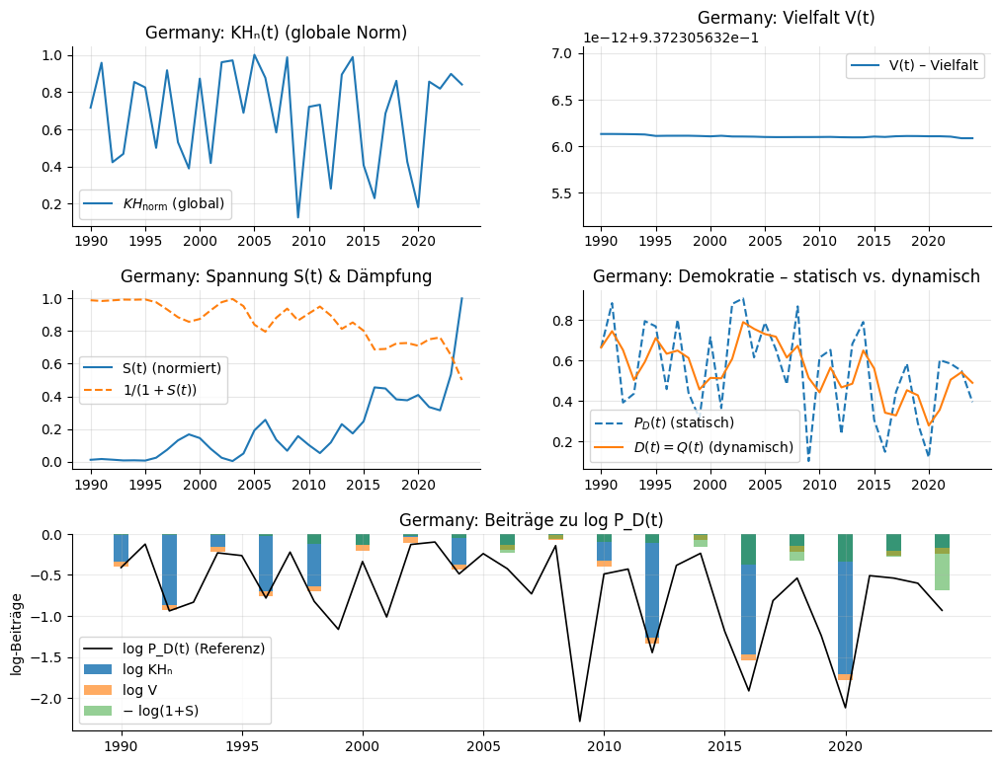

/tmp/ipython-input-294580743.py:227: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


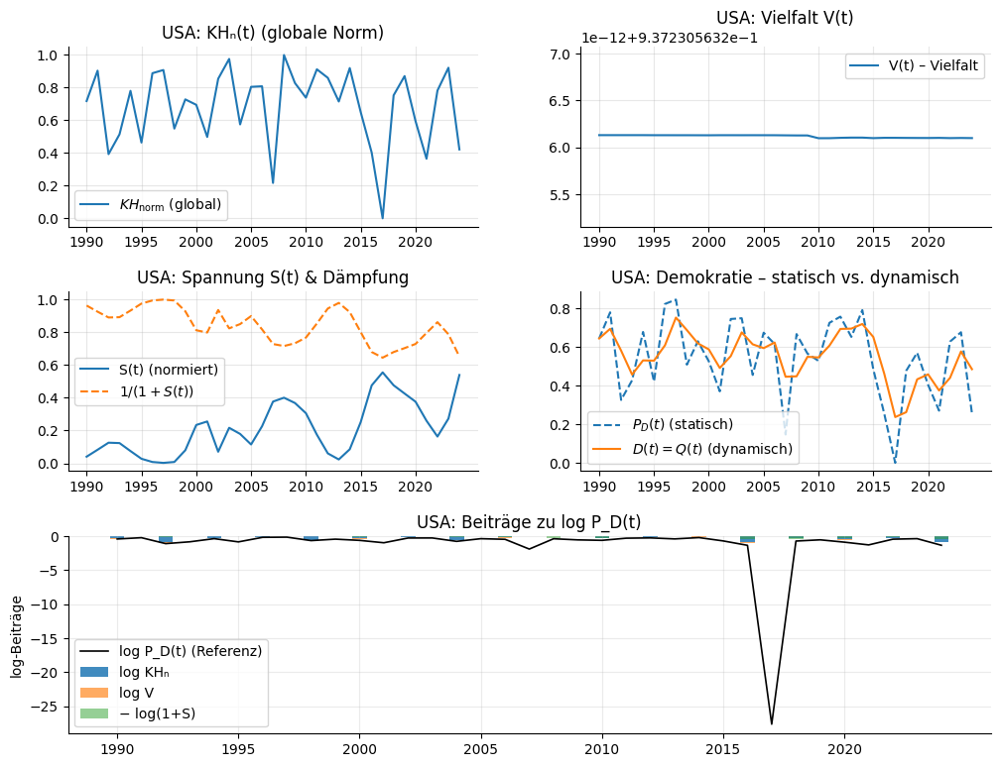

/tmp/ipython-input-294580743.py:227: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


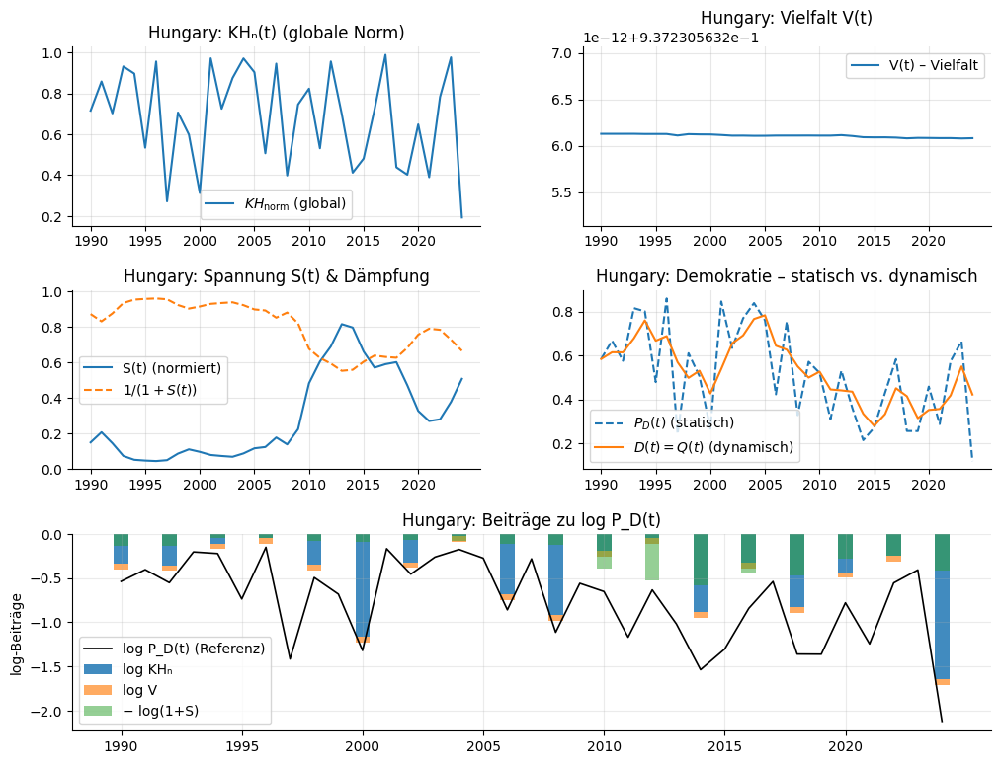

/tmp/ipython-input-294580743.py:227: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


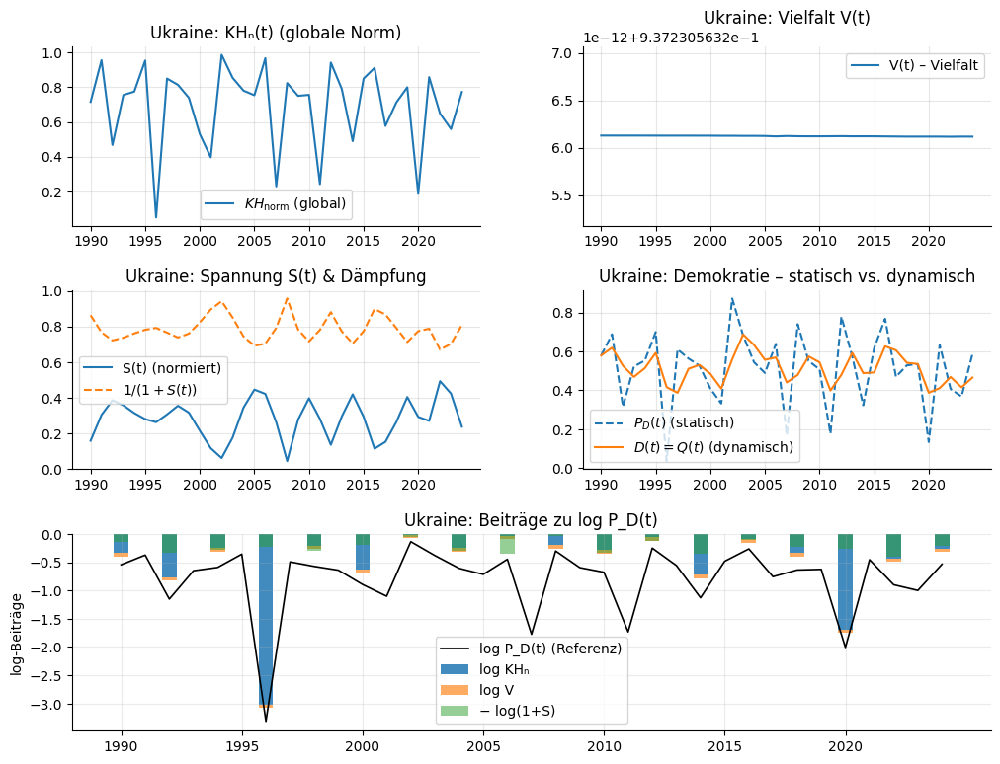

In [23]:
# ============================================================
# ADD-ON: Decompose-Plots für Demokratieindex (ohne Formeländerung)
# Nutzt results_qsd_countries (R, Cl1, V, Feff_raw, years)
# NEU: Vielfalt-Option B (Dichte-Matrix-Entropie) falls psi_paths vorhanden.
# Zeigt je Land: KH_n (global), V, S & 1/(1+S), P_D, D sowie log-Beitragsbalken
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# ---- Erwartungen prüfen
if "results_qsd_countries" not in globals() or not results_qsd_countries:
    raise RuntimeError("results_qsd_countries fehlt/leer. Bitte erst QSD + Sanity-Harness laufen lassen.")

# Länder-Liste
try:
    countries
except NameError:
    countries = list(results_qsd_countries.keys())

# Agenten-Gewichte (für Option B)
AGENT_WEIGHTS = np.asarray(globals().get("AGENT_WEIGHTS", [0.5, 0.3, 0.2]), float)
AGENT_WEIGHTS = AGENT_WEIGHTS / np.sum(AGENT_WEIGHTS)

# ODE-Parameter (Formel unverändert)
KAPPA_Q = float(globals().get("KAPPA_Q", 1.0))

# ---------- Helfer ----------
def _year_ticks(ax, years, every=5):
    yi = years.astype(int)
    ticks = np.arange(int(yi[0] - (yi[0] % every)), int(yi[-1]) + 1, every)
    ticks = ticks[(ticks >= yi[0]) & (ticks <= yi[-1])]
    ax.set_xticks(ticks)
    ax.set_xticklabels([str(y) for y in ticks])
    ax.tick_params(axis='x', labelrotation=0)

def _solve_Q(years, P_D, kappa=1.0):
    """dQ/dt = κ (P_D - Q), Q(t0) = P_D(t0)"""
    t = np.asarray(years, float)
    P = np.asarray(P_D, float)
    Q0 = float(P[0])

    def rhs(t_, Q_):
        P_t = np.interp(t_, t, P)
        return kappa * (P_t - Q_[0])

    sol = solve_ivp(rhs, (t[0], t[-1]), [Q0], t_eval=t, rtol=1e-8, atol=1e-9)
    return sol.y[0]

# ---- Option B: Vielfalt aus Dichte-Matrix-Entropie (wenn Pfade vorhanden) ----
def _variety_density_entropy(psiA, psiB, psiC, weights):
    """V_rho(t) = -Tr[rho ln rho] / ln 3, rho = Σ w_k |psi_k><psi_k|."""
    w = np.asarray(weights, float) / np.sum(weights)
    T = psiA.shape[0]
    V = np.empty(T, float)
    for k in range(T):
        rho = (w[0] * np.outer(psiA[k], psiA[k].conj())
             + w[1] * np.outer(psiB[k], psiB[k].conj())
             + w[2] * np.outer(psiC[k], psiC[k].conj()))
        evals = np.clip(np.linalg.eigvalsh(rho).real, 1e-15, 1.0)
        S = -np.sum(evals * np.log(evals))
        V[k] = S / np.log(3.0)
    return np.clip(V, 0.0, 1.0)

def _resample_complex_path(t_src, path_src, t_dst):
    """Pfad (T_src,3) complex von t_src -> t_dst linear (re/imag getrennt) resamplen."""
    t_src = np.asarray(t_src, float)
    t_dst = np.asarray(t_dst, float)
    path_src = np.asarray(path_src, complex)
    out = np.empty((t_dst.size, 3), complex)
    for j in range(3):
        re = np.interp(t_dst, t_src, np.real(path_src[:, j]))
        im = np.interp(t_dst, t_src, np.imag(path_src[:, j]))
        out[:, j] = re + 1j*im
    nrm = np.linalg.norm(out, axis=1, keepdims=True)
    return out / (nrm + 1e-15)

def _V_optionB_or_fallback(country_entry):
    """Erzeuge V(t) via Option B (rho-Entropie), falls Pfade vorhanden; sonst d['V']."""
    d = country_entry
    years = np.asarray(d["years"], float)

    # Direkter Fall: psi_paths liegen bereits auf years
    if "psi_paths" in d and all(k in d["psi_paths"] for k in ("Blau","Orange","Grün")):
        psiA = np.asarray(d["psi_paths"]["Blau"],   complex)
        psiB = np.asarray(d["psi_paths"]["Orange"], complex)
        psiC = np.asarray(d["psi_paths"]["Grün"],   complex)
        if psiA.shape[0] == years.size and psiB.shape[0] == years.size and psiC.shape[0] == years.size:
            return _variety_density_entropy(psiA, psiB, psiC, AGENT_WEIGHTS)

    # Fallback: Falls schrodinger-Block existiert, Pfade auf years resamplen
    if "schrodinger" in d and all(k in d["schrodinger"] for k in ("t_eval","pathA","pathB","pathC")):
        t_src  = np.asarray(d["schrodinger"]["t_eval"], float)
        pathA  = np.asarray(d["schrodinger"]["pathA"], complex)
        pathB  = np.asarray(d["schrodinger"]["pathB"], complex)
        pathC  = np.asarray(d["schrodinger"]["pathC"], complex)
        psiA_rs = _resample_complex_path(t_src, pathA, years)
        psiB_rs = _resample_complex_path(t_src, pathB, years)
        psiC_rs = _resample_complex_path(t_src, pathC, years)
        # optional: abspeichern
        d.setdefault("psi_paths", {})
        d["psi_paths"]["Blau"]   = psiA_rs
        d["psi_paths"]["Orange"] = psiB_rs
        d["psi_paths"]["Grün"]   = psiC_rs
        return _variety_density_entropy(psiA_rs, psiB_rs, psiC_rs, AGENT_WEIGHTS)

    # Kein Pfad vorhanden -> vorhandenes V verwenden
    if "V" not in d:
        raise RuntimeError("Weder psi_paths noch gespeichertes V(t) vorhanden.")
    return np.asarray(d["V"], float)

# ---------- Globale KH-Norm bestimmen (aus allen Ländern) ----------
KH_all = []
for c in countries:
    d = results_qsd_countries.get(c, {})
    if not all(k in d for k in ("years","R","Cl1")):
        continue
    KH_all.append(np.asarray(d["R"], float) * np.asarray(d["Cl1"], float))

if not KH_all:
    raise RuntimeError("Keine KH-Quellen gefunden (R*Cl1). Fehlen R/Cl1 in results_qsd_countries?")

KH_concat = np.concatenate(KH_all)
KH_min_glob = np.min(KH_concat)
KH_max_glob = np.max(KH_concat)
denom = KH_max_glob - KH_min_glob if KH_max_glob > KH_min_glob else 1.0

def KH_norm_global(KH):
    return (KH - KH_min_glob) / denom

# ---------- Globales S-Max (über alle Länder) ----------
if "_GLOBAL_SMAX_" not in globals():
    all_S = []
    for x in results_qsd_countries:
        if "Feff_raw" in results_qsd_countries[x]:
            all_S.append(np.asarray(results_qsd_countries[x]["Feff_raw"], float))
    if not all_S:
        raise RuntimeError("Feff_raw fehlt global – kann _GLOBAL_SMAX_ nicht bestimmen.")
    _GLOBAL_SMAX_ = float(np.max(np.concatenate(all_S)))
    if _GLOBAL_SMAX_ <= 0:
        _GLOBAL_SMAX_ = 1.0

# ---------- Pro Land: Decompose-Plot ----------
EPS = 1e-12

for c in countries:
    d = results_qsd_countries.get(c, {})
    if not all(k in d for k in ("years","R","Cl1","Feff_raw")):
        print(f"⚠️ {c}: fehlende Größen (benötigt: years, R, Cl1, Feff_raw) – übersprungen.")
        continue

    years = np.asarray(d["years"], float)
    R     = np.asarray(d["R"], float)
    Cl1   = np.asarray(d["Cl1"], float)
    # Vielfalt: Option B (falls möglich), sonst vorhandenes V
    V     = np.clip(_V_optionB_or_fallback(d), 0.0, 1.0)
    S_raw = np.asarray(d["Feff_raw"], float)

    # Spannung global normieren
    S = np.clip(S_raw / _GLOBAL_SMAX_, 0.0, 1.0)

    # KH & KH_norm (global)
    KH    = R * Cl1
    KH_n  = KH_norm_global(KH)

    # P_D & D
    P_D = (KH_n * V) / (1.0 + S)
    D   = _solve_Q(years, P_D, kappa=KAPPA_Q)

    # --- Figurenlayout ---
    fig = plt.figure(figsize=(12, 9))
    gs = fig.add_gridspec(3, 2, height_ratios=[1,1,1.1], hspace=0.35, wspace=0.25)

    ax1 = fig.add_subplot(gs[0, 0])  # KH_n
    ax2 = fig.add_subplot(gs[0, 1])  # V
    ax3 = fig.add_subplot(gs[1, 0])  # S & 1/(1+S)
    ax4 = fig.add_subplot(gs[1, 1])  # P_D & D
    ax5 = fig.add_subplot(gs[2, :])  # log-Beiträge (Barchart)

    # 1) KH_n (global)
    ax1.plot(years, KH_n, label=r"$KH_{\mathrm{norm}}$ (global)")
    ax1.set_title(f"{c}: KHₙ(t) (globale Norm)"); ax1.grid(True, alpha=.3); ax1.legend()
    _year_ticks(ax1, years, every=5)

    # 2) Vielfalt V
    ax2.plot(years, V, label="V(t) – Vielfalt")
    ax2.set_title(f"{c}: Vielfalt V(t)"); ax2.grid(True, alpha=.3); ax2.legend()
    _year_ticks(ax2, years, every=5)

    # 3) Spannung
    ax3.plot(years, S, label="S(t) (normiert)")
    ax3.plot(years, 1.0/(1.0+S+EPS), linestyle="--", label=r"$1/(1+S(t))$")
    ax3.set_title(f"{c}: Spannung S(t) & Dämpfung"); ax3.grid(True, alpha=.3); ax3.legend()
    _year_ticks(ax3, years, every=5)

    # 4) P_D & D
    ax4.plot(years, P_D, "--", label=r"$P_D(t)$ (statisch)")
    ax4.plot(years, D,  "-", label=r"$D(t)=Q(t)$ (dynamisch)")
    ax4.set_title(f"{c}: Demokratie – statisch vs. dynamisch"); ax4.grid(True, alpha=.3); ax4.legend()
    _year_ticks(ax4, years, every=5)

    # 5) Log-Beiträge als Balken: log P_D = log KH_n + log V − log(1+S)
    step = 2 if years.size <= 40 else 3
    y_sel = years[::step]
    KHc   = np.maximum(KH_n[::step], EPS)
    Vc    = np.maximum(V[::step],    EPS)
    Sc    = np.maximum(S[::step],    0.0)
    comp1 = np.log(KHc)
    comp2 = np.log(Vc)
    comp3 = -np.log(1.0 + Sc)

    width = 0.6
    ax5.bar(y_sel, comp1, width=width, label="log KHₙ", alpha=0.85)
    ax5.bar(y_sel, comp2, bottom=comp1, width=width, label="log V", alpha=0.65)
    ax5.bar(y_sel, comp3, width=width, label="− log(1+S)", alpha=0.5)

    log_PD = np.log(np.maximum(P_D, EPS))
    ax5.plot(years, log_PD, color="k", linewidth=1.2, label="log P_D(t) (Referenz)")

    ax5.set_title(f"{c}: Beiträge zu log P_D(t)")
    ax5.set_ylabel("log-Beiträge")
    ax5.grid(True, alpha=.25)
    ax5.legend(loc="best")
    _year_ticks(ax5, years, every=5)

    plt.tight_layout()
    plt.show()


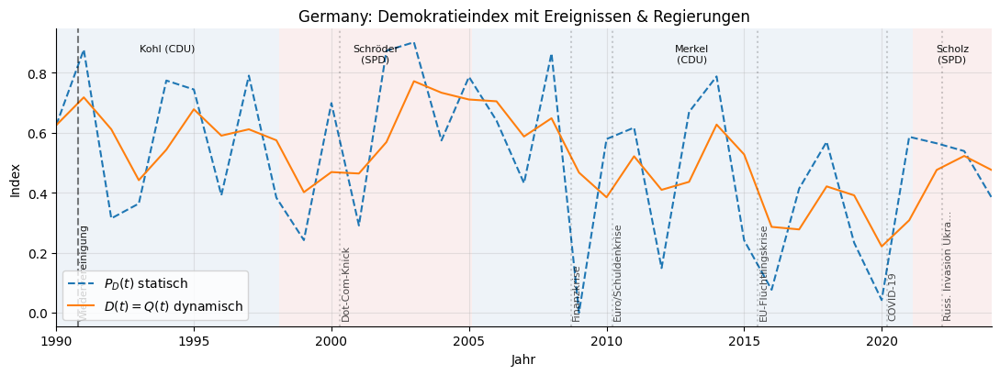

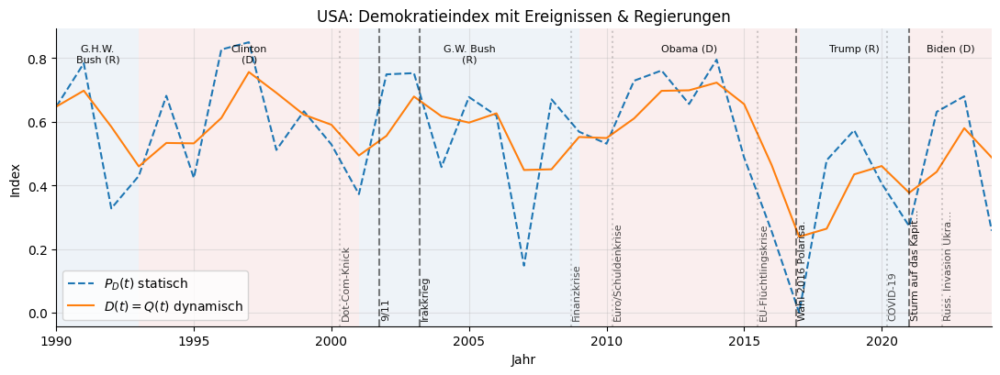

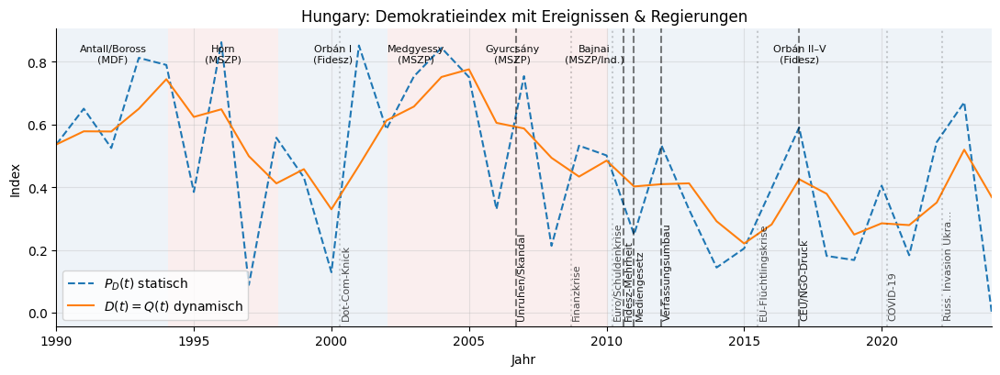

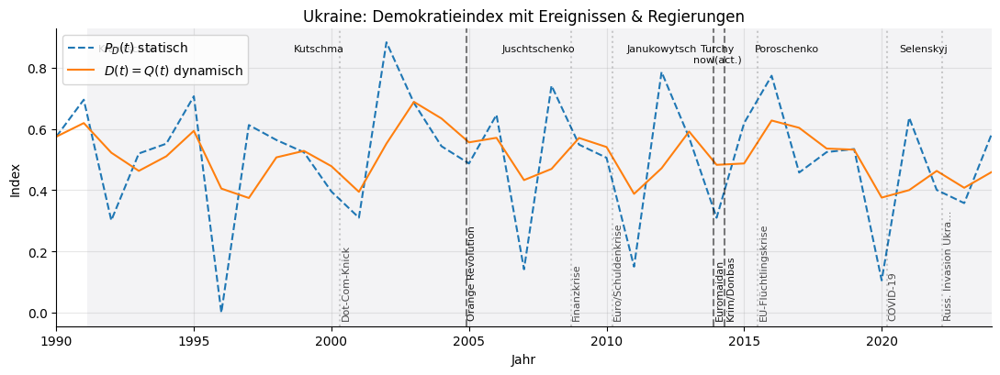

In [24]:
# ============================================================
# ADD-ON (Plot only, clamped spans + truncated event labels)
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import textwrap

def _get_series_for_country(c):
    years = P_D = D = None
    if "democracy_out" in globals() and c in democracy_out:
        d = democracy_out[c]
        years = np.asarray(d.get("years"), float)
        P_D   = d.get("P_D")
        D     = d.get("D")
    if (years is None) and ("results_qsd_countries" in globals() and c in results_qsd_countries):
        d = results_qsd_countries[c]
        years = np.asarray(d.get("years", d.get("t_eval")), float)
        P_D   = d.get("P_D")
        D     = d.get("D")
    if P_D is not None: P_D = np.asarray(P_D, float)
    if D   is not None: D   = np.asarray(D, float)
    return years, P_D, D

def _year_ticks(ax, years, step=5):
    yi = years.astype(int)
    ticks = yi[::step]
    ax.set_xticks(ticks)
    ax.set_xticklabels([str(t) for t in ticks])

def _wrap_leader(text, width=10):
    return "\n".join(textwrap.wrap(text, width=width, break_long_words=False, replace_whitespace=False))

def _truncate_event(text, maxlen=20):
    t = str(text)
    return t if len(t) <= maxlen else t[:maxlen-1] + "…"

PARTY_COLOR = {
    "R": "#2b6cb0", "Right": "#2b6cb0", "C": "#2b6cb0",
    "L": "#c53030", "Left": "#c53030",
    "N": "#6b7280", "Centrist": "#6b7280"
}

LEADERS = {
    "Germany": [
        (1982.10, 1998.10, "Kohl (CDU)", "R"),
        (1998.10, 2005.11, "Schröder (SPD)", "L"),
        (2005.11, 2021.12, "Merkel (CDU)", "R"),
        (2021.12, 2025.00, "Scholz (SPD)", "L"),
    ],
    "USA": [
        (1989.01, 1993.01, "G.H.W. Bush (R)", "R"),
        (1993.01, 2001.01, "Clinton (D)", "L"),
        (2001.01, 2009.01, "G.W. Bush (R)", "R"),
        (2009.01, 2017.01, "Obama (D)", "L"),
        (2017.01, 2021.01, "Trump (R)", "R"),
        (2021.01, 2025.00, "Biden (D)", "L"),
    ],
    "Hungary": [
        (1990.05, 1994.07, "Antall/Boross (MDF)", "R"),
        (1994.07, 1998.07, "Horn (MSZP)", "L"),
        (1998.07, 2002.05, "Orbán I (Fidesz)", "R"),
        (2002.05, 2004.09, "Medgyessy (MSZP)", "L"),
        (2004.09, 2009.04, "Gyurcsány (MSZP)", "L"),
        (2009.04, 2010.05, "Bajnai (MSZP/Ind.)", "L"),
        (2010.05, 2025.00, "Orbán II–V (Fidesz)", "R"),
    ],
    "Ukraine": [
        (1991.12, 1994.07, "Krawtschuk", "N"),
        (1994.07, 2005.01, "Kutschma", "N"),
        (2005.01, 2010.02, "Juschtschenko", "N"),
        (2010.02, 2014.02, "Janukowytsch", "N"),
        (2014.02, 2014.06, "Turchy now(act.)", "N"),
        (2014.06, 2019.05, "Poroschenko", "N"),
        (2019.05, 2025.00, "Selenskyj", "N"),
    ],
}

COMMON_EVENTS = {
    2000.3: "Dot-Com-Knick",
    2008.7: "Finanzkrise",
    2010.2: "Euro/Schuldenkrise",
    2015.5: "EU-Flüchtlingskrise",
    2020.2: "COVID-19",
    2022.2: "Russ. Invasion Ukraine",
}

COUNTRY_EVENTS = {
    "Germany": {
        1990.8: "Wiedervereinigung",
#        2015.5: "Flüchtlingskrise (DE)",
#        2020.2: "Pandemie",
#        2022.2: "Energiekrise/Ukrainekrieg",
    },
    "USA": {
        2001.75: "9/11",
        2003.2: "Irakkrieg",
        2016.9: "Wahl 2016 Polarisa.",
        2021.0: "Sturm auf das Kapitol",
    },
    "Hungary": {
        2006.7: "Unruhen/Skandal",
 #       2010.4: "Fidesz-Mehrheit", weil zu dicht
        2010.6: "Fidesz-Mehrheit",
        2011.0: "Mediengesetz",
        2012.0: "Verfassungsumbau",
        2017.0: "CEU/NGO-Druck",
    },
    "Ukraine": {
        2004.9: "Orange Revolution",
        2013.9: "Euromaidan",
        2014.3: "Krim/Donbas",
#        2022.2: "Großangriff",
    }
}

def plot_country_with_overlays(country, show_PD=True, show_D=True,
                               include_common=True, include_country=True,
                               leader_wrap_width=10, year_step=5):
    years, P_D, D = _get_series_for_country(country)
    if years is None or (P_D is None and D is None):
        print(f"⚠️ {country}: keine Zeitreihen (P_D/D) gefunden – übersprungen.")
        return

    xmin, xmax = float(years[0]), float(years[-1])

    fig, ax = plt.subplots(figsize=(11, 4.2))
    if show_PD and P_D is not None:
        ax.plot(years, P_D, linestyle="--", label=r"$P_D(t)$ statisch")
    if show_D and D is not None:
        ax.plot(years, D,  linestyle="-",  label=r"$D(t)=Q(t)$ dynamisch")

    # Clamp x-limits so the plot always starts at the first data year
    ax.set_xlim(xmin, xmax)

    # Regierungsbänder + Labels (alle auf einer Höhe), CLAMP auf [xmin,xmax]
    if country in LEADERS:
        ymin, ymax = ax.get_ylim()
        y_val = ymin + 0.95 * (ymax - ymin)
        for (t0, t1, label, party) in LEADERS[country]:
            t0c, t1c = max(t0, xmin), min(t1, xmax)
            if t1c <= xmin or t0c >= xmax:
                continue  # liegt komplett außerhalb
            col = PARTY_COLOR.get(party, "#6b7280")
            ax.axvspan(t0c, t1c, color=col, alpha=0.08, linewidth=0)
            xmid = 0.5 * (t0c + t1c)
            ax.text(xmid, y_val, _wrap_leader(label, width=leader_wrap_width),
                    ha="center", va="top", fontsize=8, rotation=0, alpha=0.95, clip_on=True)

    # Ereignisse (keine Umbrüche, auf 20 Zeichen gekürzt)
    y_text = ax.get_ylim()[0] + 0.02*(ax.get_ylim()[1]-ax.get_ylim()[0])
    if include_common:
        for x, lab in COMMON_EVENTS.items():
            if xmin <= x <= xmax:
                ax.axvline(x, color="k", alpha=0.18, linestyle=":")
                ax.text(x + 0.05, y_text, _truncate_event(lab, 20),
                        rotation=90, fontsize=8, va="bottom", ha="left", alpha=0.7, clip_on=True)
    if include_country and country in COUNTRY_EVENTS:
        for x, lab in sorted(COUNTRY_EVENTS[country].items()):
            if xmin <= x <= xmax:
                ax.axvline(x, color="k", alpha=0.5, linestyle="--")
                ax.text(x + 0.05, y_text, _truncate_event(lab, 20),
                        rotation=90, fontsize=8, va="bottom", ha="left", alpha=0.9, clip_on=True)

    ax.set_title(f"{country}: Demokratieindex mit Ereignissen & Regierungen")
    ax.set_xlabel("Jahr"); ax.set_ylabel("Index")
    _year_ticks(ax, years, step=year_step)
    ax.grid(True, alpha=0.3); ax.legend(loc="best")
    plt.tight_layout(); plt.show()

# Batch
try:
    countries
except NameError:
    if "democracy_out" in globals():
        countries = list(democracy_out.keys())
    elif "results_qsd_countries" in globals():
        countries = list(results_qsd_countries.keys())
    else:
        countries = []

for c in countries:
    plot_country_with_overlays(c)


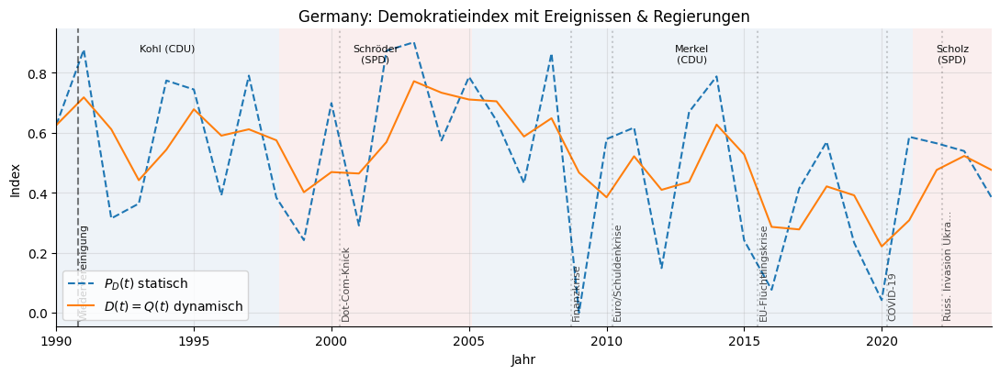

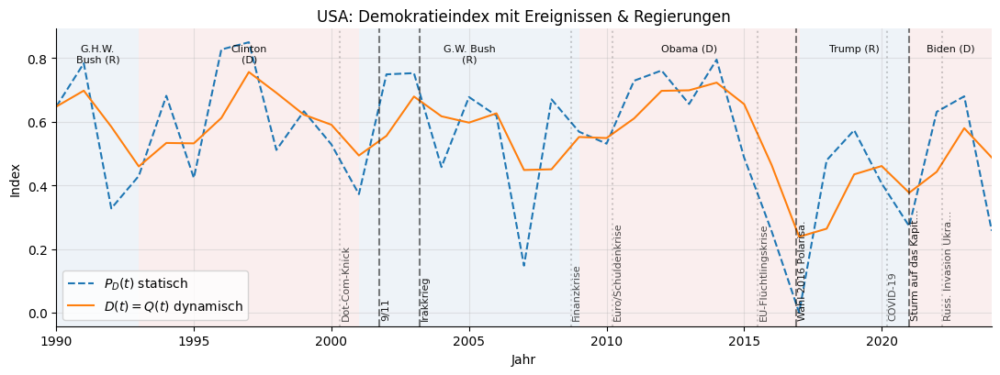

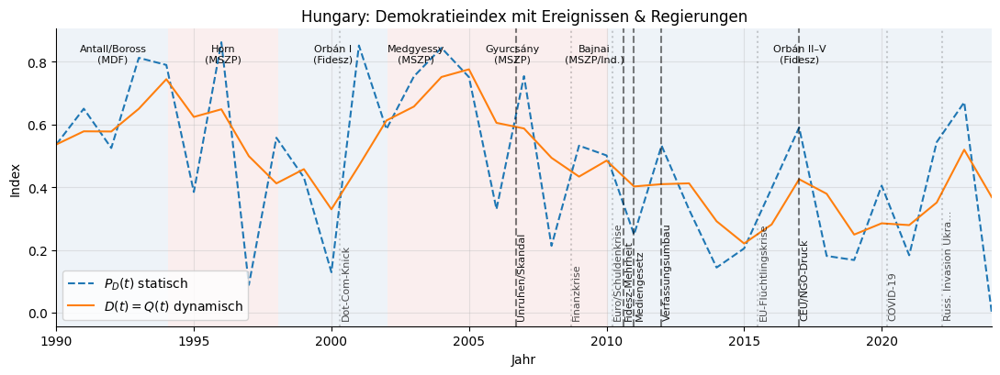

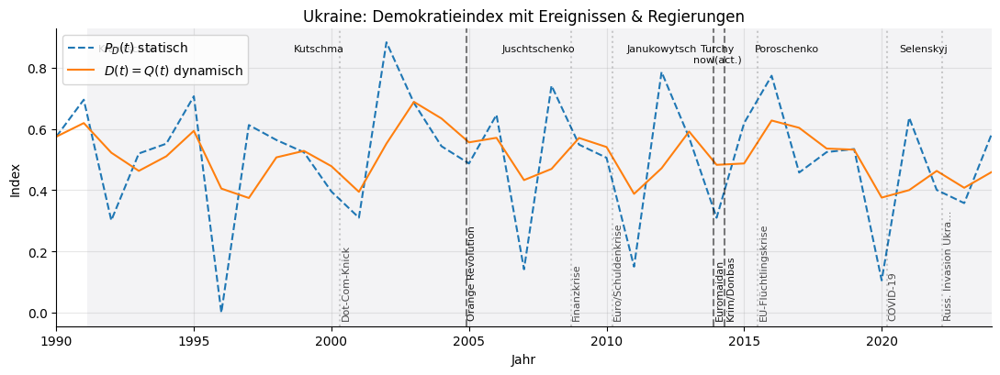

In [25]:
# ============================================================
# ADD-ON (Plot only, clamped spans + truncated event labels)
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import textwrap

def _get_series_for_country(c):
    years = P_D = D = None
    if "democracy_out" in globals() and c in democracy_out:
        d = democracy_out[c]
        years = np.asarray(d.get("years"), float)
        P_D   = d.get("P_D")
        D     = d.get("D")
    if (years is None) and ("results_qsd_countries" in globals() and c in results_qsd_countries):
        d = results_qsd_countries[c]
        years = np.asarray(d.get("years", d.get("t_eval")), float)
        P_D   = d.get("P_D")
        D     = d.get("D")
    if P_D is not None: P_D = np.asarray(P_D, float)
    if D   is not None: D   = np.asarray(D, float)
    return years, P_D, D

def _year_ticks(ax, years, step=5):
    yi = years.astype(int)
    ticks = yi[::step]
    ax.set_xticks(ticks)
    ax.set_xticklabels([str(t) for t in ticks])

def _wrap_leader(text, width=10):
    return "\n".join(textwrap.wrap(text, width=width, break_long_words=False, replace_whitespace=False))

def _truncate_event(text, maxlen=20):
    t = str(text)
    return t if len(t) <= maxlen else t[:maxlen-1] + "…"

PARTY_COLOR = {
    "R": "#2b6cb0", "Right": "#2b6cb0", "C": "#2b6cb0",
    "L": "#c53030", "Left": "#c53030",
    "N": "#6b7280", "Centrist": "#6b7280"
}

LEADERS = {
    "Germany": [
        (1982.10, 1998.10, "Kohl (CDU)", "R"),
        (1998.10, 2005.11, "Schröder (SPD)", "L"),
        (2005.11, 2021.12, "Merkel (CDU)", "R"),
        (2021.12, 2025.00, "Scholz (SPD)", "L"),
    ],
    "USA": [
        (1989.01, 1993.01, "G.H.W. Bush (R)", "R"),
        (1993.01, 2001.01, "Clinton (D)", "L"),
        (2001.01, 2009.01, "G.W. Bush (R)", "R"),
        (2009.01, 2017.01, "Obama (D)", "L"),
        (2017.01, 2021.01, "Trump (R)", "R"),
        (2021.01, 2025.00, "Biden (D)", "L"),
    ],
    "Hungary": [
        (1990.05, 1994.07, "Antall/Boross (MDF)", "R"),
        (1994.07, 1998.07, "Horn (MSZP)", "L"),
        (1998.07, 2002.05, "Orbán I (Fidesz)", "R"),
        (2002.05, 2004.09, "Medgyessy (MSZP)", "L"),
        (2004.09, 2009.04, "Gyurcsány (MSZP)", "L"),
        (2009.04, 2010.05, "Bajnai (MSZP/Ind.)", "L"),
        (2010.05, 2025.00, "Orbán II–V (Fidesz)", "R"),
    ],
    "Ukraine": [
        (1991.12, 1994.07, "Krawtschuk", "N"),
        (1994.07, 2005.01, "Kutschma", "N"),
        (2005.01, 2010.02, "Juschtschenko", "N"),
        (2010.02, 2014.02, "Janukowytsch", "N"),
        (2014.02, 2014.06, "Turchy now(act.)", "N"),
        (2014.06, 2019.05, "Poroschenko", "N"),
        (2019.05, 2025.00, "Selenskyj", "N"),
    ],
}

COMMON_EVENTS = {
    2000.3: "Dot-Com-Knick",
    2008.7: "Finanzkrise",
    2010.2: "Euro/Schuldenkrise",
    2015.5: "EU-Flüchtlingskrise",
    2020.2: "COVID-19",
    2022.2: "Russ. Invasion Ukraine",
}

COUNTRY_EVENTS = {
    "Germany": {
        1990.8: "Wiedervereinigung",
#        2015.5: "Flüchtlingskrise (DE)",
#        2020.2: "Pandemie",
#        2022.2: "Energiekrise/Ukrainekrieg",
    },
    "USA": {
        2001.75: "9/11",
        2003.2: "Irakkrieg",
        2016.9: "Wahl 2016 Polarisa.",
        2021.0: "Sturm auf das Kapitol",
    },
    "Hungary": {
        2006.7: "Unruhen/Skandal",
 #       2010.4: "Fidesz-Mehrheit", weil zu dicht
        2010.6: "Fidesz-Mehrheit",
        2011.0: "Mediengesetz",
        2012.0: "Verfassungsumbau",
        2017.0: "CEU/NGO-Druck",
    },
    "Ukraine": {
        2004.9: "Orange Revolution",
        2013.9: "Euromaidan",
        2014.3: "Krim/Donbas",
#        2022.2: "Großangriff",
    }
}

def plot_country_with_overlays(country, show_PD=True, show_D=True,
                               include_common=True, include_country=True,
                               leader_wrap_width=10, year_step=5):
    years, P_D, D = _get_series_for_country(country)
    if years is None or (P_D is None and D is None):
        print(f"⚠️ {country}: keine Zeitreihen (P_D/D) gefunden – übersprungen.")
        return

    xmin, xmax = float(years[0]), float(years[-1])

    fig, ax = plt.subplots(figsize=(11, 4.2))
    if show_PD and P_D is not None:
        ax.plot(years, P_D, linestyle="--", label=r"$P_D(t)$ statisch")
    if show_D and D is not None:
        ax.plot(years, D,  linestyle="-",  label=r"$D(t)=Q(t)$ dynamisch")

    # Clamp x-limits so the plot always starts at the first data year
    ax.set_xlim(xmin, xmax)

    # Regierungsbänder + Labels (alle auf einer Höhe), CLAMP auf [xmin,xmax]
    if country in LEADERS:
        ymin, ymax = ax.get_ylim()
        y_val = ymin + 0.95 * (ymax - ymin)
        for (t0, t1, label, party) in LEADERS[country]:
            t0c, t1c = max(t0, xmin), min(t1, xmax)
            if t1c <= xmin or t0c >= xmax:
                continue  # liegt komplett außerhalb
            col = PARTY_COLOR.get(party, "#6b7280")
            ax.axvspan(t0c, t1c, color=col, alpha=0.08, linewidth=0)
            xmid = 0.5 * (t0c + t1c)
            ax.text(xmid, y_val, _wrap_leader(label, width=leader_wrap_width),
                    ha="center", va="top", fontsize=8, rotation=0, alpha=0.95, clip_on=True)

    # Ereignisse (keine Umbrüche, auf 20 Zeichen gekürzt)
    y_text = ax.get_ylim()[0] + 0.02*(ax.get_ylim()[1]-ax.get_ylim()[0])
    if include_common:
        for x, lab in COMMON_EVENTS.items():
            if xmin <= x <= xmax:
                ax.axvline(x, color="k", alpha=0.18, linestyle=":")
                ax.text(x + 0.05, y_text, _truncate_event(lab, 20),
                        rotation=90, fontsize=8, va="bottom", ha="left", alpha=0.7, clip_on=True)
    if include_country and country in COUNTRY_EVENTS:
        for x, lab in sorted(COUNTRY_EVENTS[country].items()):
            if xmin <= x <= xmax:
                ax.axvline(x, color="k", alpha=0.5, linestyle="--")
                ax.text(x + 0.05, y_text, _truncate_event(lab, 20),
                        rotation=90, fontsize=8, va="bottom", ha="left", alpha=0.9, clip_on=True)

    ax.set_title(f"{country}: Demokratieindex mit Ereignissen & Regierungen")
    ax.set_xlabel("Jahr"); ax.set_ylabel("Index")
    _year_ticks(ax, years, step=year_step)
    ax.grid(True, alpha=0.3); ax.legend(loc="best")
    plt.tight_layout(); plt.show()

# Batch
try:
    countries
except NameError:
    if "democracy_out" in globals():
        countries = list(democracy_out.keys())
    elif "results_qsd_countries" in globals():
        countries = list(results_qsd_countries.keys())
    else:
        countries = []

for c in countries:
    plot_country_with_overlays(c)


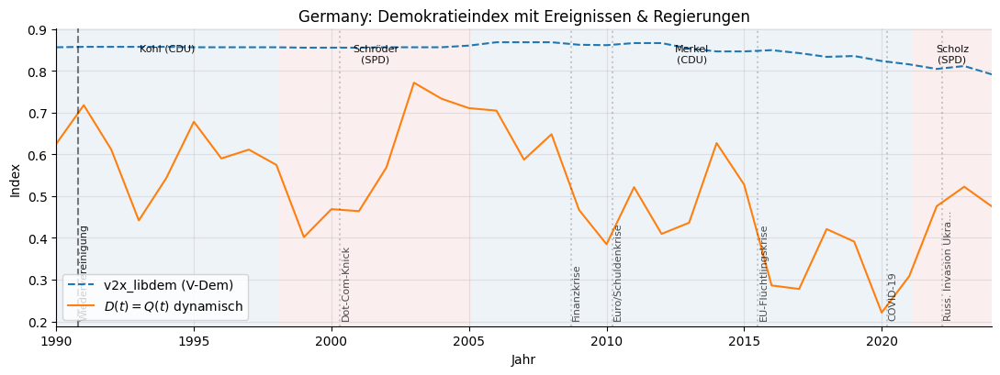

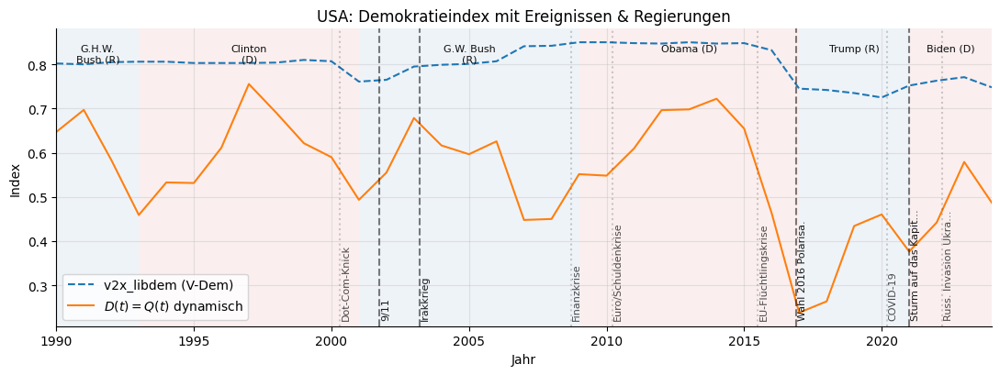

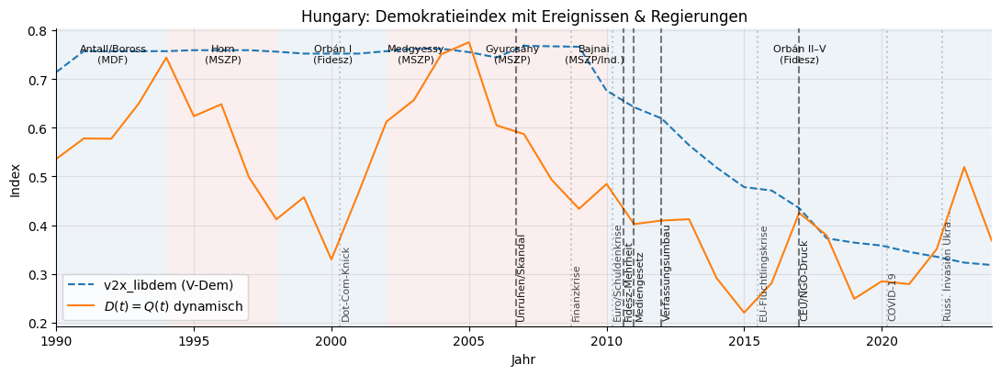

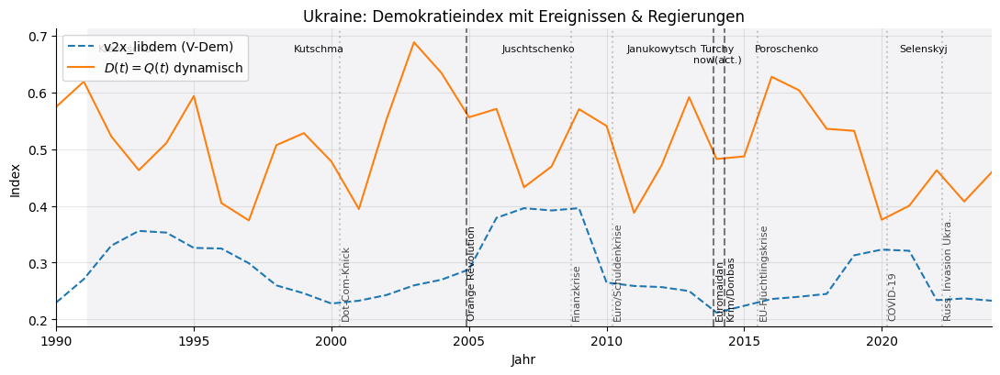

In [26]:
# ============================================================
# ADD-ON (Plot only, clamped spans + truncated event labels)
# änderung: P_D-Plot -> v2x_libdem aus V-Dem
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import textwrap
from scipy.interpolate import interp1d

def _get_series_for_country(c):
    years = P_D = D = None
    if "democracy_out" in globals() and c in democracy_out:
        d = democracy_out[c]
        years = np.asarray(d.get("years"), float)
        P_D   = d.get("P_D")
        D     = d.get("D")
    if (years is None) and ("results_qsd_countries" in globals() and c in results_qsd_countries):
        d = results_qsd_countries[c]
        years = np.asarray(d.get("years", d.get("t_eval")), float)
        P_D   = d.get("P_D")
        D     = d.get("D")
    if P_D is not None: P_D = np.asarray(P_D, float)
    if D   is not None: D   = np.asarray(D, float)
    return years, P_D, D

# ---- NEU: v2x_libdem aus Loader lesen (arrays_dict / vdem_arrays) ----
def _get_libdem_for_country(c, years_ref=None):
    # Quelle bestimmen
    loader = None
    if "arrays_dict" in globals():
        loader = arrays_dict
    elif "vdem_arrays" in globals():
        loader = vdem_arrays
    if (loader is None) or (c not in loader) or ("v2x_libdem" not in loader[c]):
        return None

    y_src = np.asarray(loader[c]["years"], float)
    x_src = np.asarray(loader[c]["v2x_libdem"]["values"], float)

    if years_ref is None:
        return y_src, x_src

    years_ref = np.asarray(years_ref, float)
    # auf years_ref interpolieren (linear, endpoints halten)
    f = interp1d(y_src, x_src, kind="linear", bounds_error=False,
                 fill_value=(x_src[0], x_src[-1]))
    x_ref = f(years_ref)
    return years_ref, np.asarray(x_ref, float)

def _year_ticks(ax, years, step=5):
    yi = years.astype(int)
    ticks = yi[::step]
    ax.set_xticks(ticks)
    ax.set_xticklabels([str(t) for t in ticks])

def _wrap_leader(text, width=10):
    return "\n".join(textwrap.wrap(text, width=width, break_long_words=False, replace_whitespace=False))

def _truncate_event(text, maxlen=20):
    t = str(text)
    return t if len(t) <= maxlen else t[:maxlen-1] + "…"

PARTY_COLOR = {
    "R": "#2b6cb0", "Right": "#2b6cb0", "C": "#2b6cb0",
    "L": "#c53030", "Left": "#c53030",
    "N": "#6b7280", "Centrist": "#6b7280"
}

LEADERS = {
    "Germany": [
        (1982.10, 1998.10, "Kohl (CDU)", "R"),
        (1998.10, 2005.11, "Schröder (SPD)", "L"),
        (2005.11, 2021.12, "Merkel (CDU)", "R"),
        (2021.12, 2025.00, "Scholz (SPD)", "L"),
    ],
    "USA": [
        (1989.01, 1993.01, "G.H.W. Bush (R)", "R"),
        (1993.01, 2001.01, "Clinton (D)", "L"),
        (2001.01, 2009.01, "G.W. Bush (R)", "R"),
        (2009.01, 2017.01, "Obama (D)", "L"),
        (2017.01, 2021.01, "Trump (R)", "R"),
        (2021.01, 2025.00, "Biden (D)", "L"),
    ],
    "Hungary": [
        (1990.05, 1994.07, "Antall/Boross (MDF)", "R"),
        (1994.07, 1998.07, "Horn (MSZP)", "L"),
        (1998.07, 2002.05, "Orbán I (Fidesz)", "R"),
        (2002.05, 2004.09, "Medgyessy (MSZP)", "L"),
        (2004.09, 2009.04, "Gyurcsány (MSZP)", "L"),
        (2009.04, 2010.05, "Bajnai (MSZP/Ind.)", "L"),
        (2010.05, 2025.00, "Orbán II–V (Fidesz)", "R"),
    ],
    "Ukraine": [
        (1991.12, 1994.07, "Krawtschuk", "N"),
        (1994.07, 2005.01, "Kutschma", "N"),
        (2005.01, 2010.02, "Juschtschenko", "N"),
        (2010.02, 2014.02, "Janukowytsch", "N"),
        (2014.02, 2014.06, "Turchy now(act.)", "N"),
        (2014.06, 2019.05, "Poroschenko", "N"),
        (2019.05, 2025.00, "Selenskyj", "N"),
    ],
}

COMMON_EVENTS = {
    2000.3: "Dot-Com-Knick",
    2008.7: "Finanzkrise",
    2010.2: "Euro/Schuldenkrise",
    2015.5: "EU-Flüchtlingskrise",
    2020.2: "COVID-19",
    2022.2: "Russ. Invasion Ukraine",
}

COUNTRY_EVENTS = {
    "Germany": { 1990.8: "Wiedervereinigung" },
    "USA": {
        2001.75: "9/11",
        2003.2:  "Irakkrieg",
        2016.9:  "Wahl 2016 Polarisa.",
        2021.0:  "Sturm auf das Kapitol",
    },
    "Hungary": {
        2006.7: "Unruhen/Skandal",
        2010.6: "Fidesz-Mehrheit",
        2011.0: "Mediengesetz",
        2012.0: "Verfassungsumbau",
        2017.0: "CEU/NGO-Druck",
    },
    "Ukraine": {
        2004.9: "Orange Revolution",
        2013.9: "Euromaidan",
        2014.3: "Krim/Donbas",
    }
}

def plot_country_with_overlays(country, show_PD=True, show_D=True,
                               include_common=True, include_country=True,
                               leader_wrap_width=10, year_step=5):
    years, P_D_IGNORED, D = _get_series_for_country(country)
    if years is None and D is None:
        print(f"⚠️ {country}: keine Zeitreihen gefunden – übersprungen.")
        return

    # v2x_libdem passend zu 'years' holen
    y_ref = years if years is not None else (D["years"] if isinstance(D, dict) and "years" in D else None)
    y_lib, libdem = _get_libdem_for_country(country, y_ref)
    if y_lib is None:
        print(f"⚠️ {country}: v2x_libdem nicht verfügbar – nur D(t) wird geplottet.")
    else:
        years = y_lib  # Referenzachse

    xmin, xmax = float(years[0]), float(years[-1])

    fig, ax = plt.subplots(figsize=(11, 4.2))
    # ---- Änderung: statt P_D jetzt v2x_libdem ----
    if show_PD and (y_lib is not None):
        ax.plot(years, libdem, linestyle="--", label="v2x_libdem (V-Dem)")
    if show_D and D is not None:
        ax.plot(years, D, linestyle="-", label=r"$D(t)=Q(t)$ dynamisch")

    ax.set_xlim(xmin, xmax)

    # Regierungsbänder + Labels
    if country in LEADERS:
        ymin, ymax = ax.get_ylim()
        y_val = ymin + 0.95*(ymax-ymin)
        for (t0, t1, label, party) in LEADERS[country]:
            t0c, t1c = max(t0, xmin), min(t1, xmax)
            if t1c <= xmin or t0c >= xmax:
                continue
            col = PARTY_COLOR.get(party, "#6b7280")
            ax.axvspan(t0c, t1c, color=col, alpha=0.08, linewidth=0)
            ax.text(0.5*(t0c+t1c), y_val, _wrap_leader(label, width=leader_wrap_width),
                    ha="center", va="top", fontsize=8, rotation=0, alpha=0.95, clip_on=True)

    # Ereignisse
    y_text = ax.get_ylim()[0] + 0.02*(ax.get_ylim()[1]-ax.get_ylim()[0])
    if include_common:
        for x, lab in COMMON_EVENTS.items():
            if xmin <= x <= xmax:
                ax.axvline(x, color="k", alpha=0.18, linestyle=":")
                ax.text(x+0.05, y_text, _truncate_event(lab, 20),
                        rotation=90, fontsize=8, va="bottom", ha="left", alpha=0.7, clip_on=True)
    if include_country and country in COUNTRY_EVENTS:
        for x, lab in sorted(COUNTRY_EVENTS[country].items()):
            if xmin <= x <= xmax:
                ax.axvline(x, color="k", alpha=0.5, linestyle="--")
                ax.text(x+0.05, y_text, _truncate_event(lab, 20),
                        rotation=90, fontsize=8, va="bottom", ha="left", alpha=0.9, clip_on=True)

    ax.set_title(f"{country}: Demokratieindex mit Ereignissen & Regierungen")
    ax.set_xlabel("Jahr"); ax.set_ylabel("Index")
    _year_ticks(ax, years, step=year_step)
    ax.grid(True, alpha=0.3); ax.legend(loc="best")
    plt.tight_layout(); plt.show()

# Batch
try:
    countries
except NameError:
    if "democracy_out" in globals():
        countries = list(democracy_out.keys())
    elif "results_qsd_countries" in globals():
        countries = list(results_qsd_countries.keys())
    else:
        countries = []

for c in countries:
    plot_country_with_overlays(c)
